# VAE + DC Methodology

In [ ]:
!pip install tensorflow-io
!pip install tensorflow
!pip install keras
!pip install pydot
!pip install keras_tuner
!pip install google-cloud-bigquery
!pip install matplotlib
!pip install scikit-learn
!pip install pandas
!pip install db-dtypes
!pip install seaborn
!pip install plotly
!pip install plotly[kaleido]
!pip install nbformat>=4.2.0


## Colab - BigQuery setup

When running this notebook on Colab, in order to authenticate yourself to access data in BigQuery, install the additional packages below and authenticate using your Google account.


In [ ]:
# Required for Colab only
!pip install --upgrade google-auth google-auth-oauthlib google-auth-httplib2

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.1/216.1 kB 5.1 MB/s eta 0:00:0000:01
  Attempting uninstall: google-auth
    Found existing installation: google-auth 2.29.0
    Uninstalling google-auth-2.29.0:
      Successfully uninstalled google-auth-2.29.0
  You can safely remove it manually.
  You can safely remove it manually.
  Attempting uninstall: google-auth-oauthlib
    Found existing installation: google-auth-oauthlib 1.2.0
    Uninstalling google-auth-oauthlib-1.2.0:
      Successfully uninstalled google-auth-oauthlib-1.2.0


In [6]:
# Required for Colab only
# This will prompt a popup asking you to log in and authorize the notebook.
from google.colab import auth
auth.authenticate_user()


ModuleNotFoundError: No module named 'google.colab'

In [2]:
import os
import random
import datetime
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from scipy import stats
from scipy.stats import probplot, shapiro
from sklearn.preprocessing import PowerTransformer, MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.utils.validation import check_is_fitted
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from google.cloud import bigquery

2025-07-20 06:26:47.538265: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-07-20 06:26:47.563244: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-07-20 06:26:47.601958: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-07-20 06:26:47.640750: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-07-20 06:26:47.651917: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-07-20 06:26:47.691733: I tensorflow/core/platform/cpu_feature_gu

## Introduction

Market participants operate in specific frequencies. We propose a method for studying market microstructure at varying frequencies thus generating signals useful for strategic decision making in forecasting price changes.

## Directional Change Algorithm

#### Sample tick data from BigQuery

In [3]:
#The following code is meant for summarising the given time-series (or sequence of 
#observations) accrding to the Directional Change framework for a given threshold.
#Prepared and verified by Dr V L Raju Chinthalapati, University of London

# Project and table info
project = "derivatives-417104"
dataset_id = "coindesk"
table_id = "coindesk_latest_tick"

# Create a BigQuery client
client = bigquery.Client()

# SQL query chronological order
query = f"""
SELECT 
    PRICE, CURRENT_HOUR_VOLUME, 
    CURRENT_DAY_VOLUME, MOVING_7_DAY_HIGH, PRICE_FLAG, 
    LOAD_TIME, DATETIME(LOAD_TIME, "America/Toronto") AS load_time_toronto 
FROM 
    `{project}.{dataset_id}.{table_id}` 
    
WHERE LOAD_TIME >= TIMESTAMP('2025-07-06')
  AND LOAD_TIME < TIMESTAMP('2025-07-13')
AND
MOD(ABS(FARM_FINGERPRINT(CAST(CCSEQ AS STRING))), 100) < 10
ORDER BY 
    LOAD_TIME ASC
"""

# Run query
df = client.query(query).to_dataframe()

df.tail()

,PRICE,CURRENT_HOUR_VOLUME,CURRENT_DAY_VOLUME,MOVING_7_DAY_HIGH,PRICE_FLAG,LOAD_TIME,load_time_toronto
47251,117431.36,67.290029,2395.651929,118909.74,DOWN,2025-07-12 23:58:12.169283+00:00,2025-07-12 19:58:12.169283
47252,117443.34,67.466251,2395.828151,118909.74,DOWN,2025-07-12 23:58:33.500022+00:00,2025-07-12 19:58:33.500022
47253,117443.35,67.769858,2396.131757,118909.74,UNCHANGED,2025-07-12 23:58:57.189294+00:00,2025-07-12 19:58:57.189294
47254,117443.35,67.786016,2396.147916,118909.74,UNCHANGED,2025-07-12 23:59:13.910934+00:00,2025-07-12 19:59:13.910934
47255,117448.63,68.116667,2396.478567,118909.74,UP,2025-07-12 23:59:38.182730+00:00,2025-07-12 19:59:38.182730


#### Run DC Algorithm

In [163]:
#In the following code, we are recording both upward and downward trends. 
#Note that PDCC2_Up and PDCC_Down refer to the directional change confirmation 
#points for the upward and downward trends, respectively. 
#OSV_Up and OSV_Down represent the overshoot values for the upward and downward 
#trends. Also note that "Upward Update" marks the end of an upward trend, 
#while "Downward Update" indicates the end of a downward trend.

import pandas as pd
import numpy as np 
import plotly.graph_objects as go 

# ───────────────────────────────────────────
# Parameters for directional-change thresholds
Threshold = 0.001 # Downward
Threshold2 = 0.001 # Upward

# ───────────────────────────────────────────
# Initialize tracking variables for downward trends
maxPrice    = 0.5         # highest price seen before confirming a down-trend
minPrice    = 10_000_000  # placeholder large number; reset once trend starts
PDCC        = 0           # price at which down-trend is confirmed
OSV         = 0           # instantaneous overshoot during a down-trend
max_OSV     = 0           # maximum overshoot seen in a single down-trend
filter_down = 0           # flag: 0=not in down-trend, 1=in down-trend
filter_up   = 0           # flag: prevents overlap with up-trend logic

# Initialize tracking variables for upward trends
maxPrice2    = 0.5        # lowest price seen before confirming an up-trend
minPrice2    = 10_000_000 # placeholder large number; reset once up-trend starts
PDCC2        = 0          # price at which up-trend is confirmed
OSV2         = 0          # instantaneous overshoot during an up-trend
max_OSV2     = 0          # maximum overshoot seen in a single up-trend

# ───────────────────────────────────────────
# Copy dataframe and extract series
df = df.copy()
ask_prices = df['PRICE']
dates      = df['load_time_toronto']

# Prepare columns and temporary date markers
df['event']      = np.nan
df['event_type'] = np.nan
PDCC_date        = np.nan
max_date         = np.nan
osv_down_date_today = np.nan
osv_up_date_today   = np.nan
PDCC2_date       = np.nan
min_date         = np.nan

# Lists to record each event for later plotting
downward_events = []
upward_events   = []

# ───────────────────────────────────────────
# Main loop over each price/time
for askPrice, date_today in zip(ask_prices, dates):

    # --- Section A: Detect start of a downward trend ---
    if filter_down == 0:
        difference = maxPrice - askPrice
        # If price has fallen at least Threshold% from the previous max
        if maxPrice > askPrice and difference >= maxPrice * Threshold:
            # Confirm PDCC_Down event
            minPrice    = askPrice
            PDCC        = askPrice
            filter_down = 1         # enter down-trend mode
            max_OSV     = 0         # reset overshoot counter
            filter_up   = 0         # ensure up-trend logic is off

            # Record the start of the down-trend
            downward_events.append((max_date, date_today, maxPrice, askPrice, 'PDCC_Down'))
            PDCC_date = date_today
            df.loc[df['load_time_toronto'] == date_today, 'event']      = 'PDCC_Down'
            df.loc[df['load_time_toronto'] == date_today, 'event_type'] = 'Downward Start'

            # Also mark the last up-trend’s overshoot update
            upward_events.append((PDCC2_date, osv_up_date_today, PDCC2, maxPrice2, 'OSV_Up'))
            df.loc[df['load_time_toronto'] == osv_up_date_today, 'event']      = 'OSV_Up'
            df.loc[df['load_time_toronto'] == osv_up_date_today, 'event_type'] = 'Upward Update'

            # Reset up-trend trackers
            minPrice2 = 10_000_000
            maxPrice2 = 0.5

        # If price goes above the previous max, just update maxPrice
        if askPrice > maxPrice:
            maxPrice = askPrice
            max_date = date_today

    # --- Section B: While inside a downward trend, measure overshoot ---
    if filter_down == 1:
        # If price has risen above the local low, compute overshoot
        if minPrice < askPrice:
            OSV = (PDCC - askPrice) / (PDCC * Threshold)
            max_OSV = max(max_OSV, OSV)
            # Clamp negative overshoots to zero
            if OSV < 0:
                OSV = 0
                # If an upward signal is already active, exit down-trend
                if filter_up == 1:
                    filter_down = 0
                    minPrice   = 10_000_000
                    maxPrice   = 0.5

        # Always update the running low and overshoot marker date
        if minPrice >= askPrice or filter_up == 1:
            minPrice = askPrice
            osv_down_date_today = date_today
            OSV = (PDCC - askPrice) / (PDCC * Threshold)
            max_OSV = max(max_OSV, OSV)

    # --- Section C: Detect start of an upward trend ---
    if filter_up == 0:
        difference2 = askPrice - minPrice2
        # If price has risen at least Threshold2% from the previous min
        if minPrice2 < askPrice and difference2 >= minPrice2 * Threshold2:
            # Confirm PDCC2_UP event
            maxPrice2  = askPrice
            PDCC2      = askPrice
            filter_up  = 1        # enter up-trend mode
            max_OSV2   = 0        # reset overshoot counter

            # Record the start of the up-trend
            upward_events.append((min_date, date_today, minPrice2, PDCC2, 'PDCC2_UP'))
            PDCC2_date = date_today
            df.loc[df['load_time_toronto'] == date_today, 'event']      = 'PDCC2_UP'
            df.loc[df['load_time_toronto'] == date_today, 'event_type'] = 'Upward Start'

            # Also mark the last down-trend’s overshoot update
            downward_events.append((PDCC_date, osv_down_date_today, PDCC, minPrice, 'OSV_Down'))
            df.loc[df['load_time_toronto'] == osv_down_date_today, 'event']      = 'OSV_Down'
            df.loc[df['load_time_toronto'] == osv_down_date_today, 'event_type'] = 'Downward Update'

            # Reset down-trend trackers
            filter_down = 0
            minPrice    = 10_000_000
            maxPrice    = 0.5

        # If price dips below previous low, just update minPrice2
        if askPrice < minPrice2:
            minPrice2 = askPrice
            min_date  = date_today

    # --- Section D: While inside an upward trend, measure overshoot ---
    if filter_up == 1:
        # If price has fallen back below the running max, compute overshoot
        if askPrice < maxPrice2:
            OSV2 = (askPrice - PDCC2) / (PDCC2 * Threshold2)
            max_OSV2 = max(max_OSV2, OSV2)
            # Clamp negative overshoots to zero
            if OSV2 < 0:
                OSV2 = 0
                # If a down-signal is already active, exit up-trend
                if filter_down == 1:
                    filter_up   = 0
                    minPrice2   = 10_000_000
                    maxPrice2   = 0.5

        # Always update the running high and overshoot marker date
        if askPrice >= maxPrice2 or filter_down == 1:
            maxPrice2 = askPrice
            osv_up_date_today = date_today
            OSV2 = (askPrice - PDCC2) / (PDCC2 * Threshold2)
            max_OSV2 = max(max_OSV2, OSV2)

# ───────────────────────────────────────────
# Final results: the largest overshoot seen in any down- or up-trend
print(f"Final maximum OSV for downward trends: {max_OSV}")
print(f"Final maximum OSV2 for upward trends:   {max_OSV2}")

# ───────────────────────────────────────────
# Build a Plotly figure marking all PDCC and OSV events
fig = go.Figure()
fig.add_trace(go.Scatter(x=dates, y=ask_prices, mode='lines', name='Ask Prices'))

# Plot downward-trend starts and updates
downward_start_added = False
downward_update_added = False
for prev, today, price0, price1, event in downward_events:
    if event == 'PDCC_Down':
        fig.add_trace(go.Scatter(
            x=[today], y=[price1], mode='markers',
            marker=dict(color='red', symbol='triangle-down'),
            name='Downward Start', showlegend=not downward_start_added
        ))
        downward_start_added = True
    elif event == 'OSV_Down':
        fig.add_trace(go.Scatter(
            x=[today], y=[price1], mode='markers',
            marker=dict(color='orange', symbol='triangle-down'),
            name='Downward Update', showlegend=not downward_update_added
        ))
        downward_update_added = True

    if prev and today:
        fig.add_shape(
            type='line',
            x0=prev, y0=price0, x1=today, y1=price1,
            line=dict(color='red' if event == 'PDCC_Down' else 'black',
                      width=2, dash='dashdot'),
            opacity=0.7
        )

fig.update_layout(
    title='DC Events on Ask Prices',
    xaxis_title='Date', yaxis_title='Price',
    legend_title='Events', legend=dict(itemsizing='constant')
)

# Plot upward-trend starts and updates on the *same* figure
upward_start_added = False
upward_update_added = False
for prev, today, price0, price1, event in upward_events:
    if event == 'PDCC2_UP':
        fig.add_trace(go.Scatter(
            x=[today], y=[price1], mode='markers',
            marker=dict(color='green', symbol='triangle-up'),
            name='Upward Start', showlegend=not upward_start_added
        ))
        upward_start_added = True
    elif event == 'OSV_Up':
        fig.add_trace(go.Scatter(
            x=[today], y=[price1], mode='markers',
            marker=dict(color='magenta', symbol='triangle-up'),
            name='Upward Update', showlegend=not upward_update_added
        ))
        upward_update_added = True

    if prev and today:
        fig.add_shape(
            type='line',
            x0=prev, y0=price0, x1=today, y1=price1,
            line=dict(color='green' if event == 'PDCC2_UP' else 'magenta',
                      width=2, dash='dashdot'),
            opacity=0.7
        )

fig.show()

# fig.write_image("dc_events_plot.png")


/var/tmp/ipykernel_4967/75327635.py:73: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'PDCC_Down' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.loc[df['load_time_toronto'] == date_today, 'event']      = 'PDCC_Down'
/var/tmp/ipykernel_4967/75327635.py:74: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Downward Start' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.loc[df['load_time_toronto'] == date_today, 'event_type'] = 'Downward Start'


Final maximum OSV for downward trends: 0
Final maximum OSV2 for upward trends:   2.8835013205337727


Thresholds on X axis
Currency pairs on Y axis (CAD/USD, EUR/USD, ...)
Each grid represents currency pair and threshold
bLUE ZONE - NO RISK
RED ZONE - RISK

e.g Probability information theory extending 
SSRN

#### Store DC events (summary) in BigQuery

In [165]:
from google.cloud import bigquery
from google.cloud.exceptions import NotFound

# BigQuery client
client = bigquery.Client()

project_id = "derivatives-417104"
dataset_id = "coindesk"
table_id   = "dc_events"

table_ref = client.dataset(dataset_id, project=project_id).table(table_id)

# Create the table if it doesn’t exist
try:
    client.get_table(table_ref)
    print(f"Table {dataset_id}.{table_id} already exists.")
except NotFound:
    schema = [
        bigquery.SchemaField("start_time",  "TIMESTAMP", mode="REQUIRED"),
        bigquery.SchemaField("end_time",    "TIMESTAMP", mode="REQUIRED"),
        bigquery.SchemaField("start_price", "FLOAT64"),
        bigquery.SchemaField("end_price",   "FLOAT64"),
        bigquery.SchemaField("event_type",  "STRING"),
        bigquery.SchemaField("threshold",   "FLOAT64"),
    ]
    table = bigquery.Table(table_ref, schema=schema)
    table = client.create_table(table)  # actually creates it
    print(f"Created table {table.project}.{table.dataset_id}.{table.table_id}")


def load_dc_events(events, threshold):
    """Loads DC summary events to BigQuery"""
    
    if len(events) > 1:
        # Remove the default null start/end dates
        clean_events = [
            ev for ev in events
            if ev[0] is not np.nan and ev[1] is not np.nan
        ]
        
        # Create DC summary evets dataframe
        df = pd.DataFrame(
            clean_events,
            columns=["start_time", "end_time", "start_price", "end_price", "event_type"]
        )
        df["threshold"] = threshold

        # Initialize BigQuery client
        client = bigquery.Client(project)
        target_table_id  = f"{project}.{dataset_id}.dc_events"

        # ensure pandas Timestamps have UTC tzinfo:
        df["start_time"] = df["start_time"].dt.tz_localize("UTC")
        df["end_time"]   = df["end_time"].dt.tz_localize("UTC")

        # Load DataFrame into a temporary staging table
        job = client.load_table_from_dataframe(df, target_table_id)
        job.result()  # wait for load

        # Clean up staging table
        # client.delete_table(staging_table_id, not_found_ok=True)

        print('Loaded DC events!')

        return df
        # return 'OK'
    else:
        print('No DC events to load')


Table coindesk.dc_events already exists.


In [166]:
downward_df = load_dc_events(downward_events, Threshold)
upward_df = load_dc_events(upward_events, Threshold2)

Loaded DC events!
Loaded DC events!


## Extract DC Sequeces at Each Threshold (DC Summary) using price time-series

In addition to the prices, the dataset (**derivatives-417104.coindesk.coindesk_latest_tick**) has other features as well (e.g., volume, volatility, CVD etc.).

For each threshold, prepare a new dataset by augmenting FOUR more features (columns), PDCC_down, OSV_dow, PDCC_Up, and OSV_up **derived from the DC Summary**.

#### Get DC events (summary) from BigQuery

In [167]:
# Project and table info
project = "derivatives-417104"
dataset_id = "coindesk"
table_id = "coindesk_latest_tick"

# DC Summary
table_id = "dc_events"

query = f"""
SELECT DISTINCT * FROM 
    `{project}.{dataset_id}.{table_id}` 
WHERE threshold = {Threshold}
ORDER BY start_time, end_time ASC
"""

# Run DC Summary query
dc_summary = client.query(query).to_dataframe()

dc_summary.tail()

,start_time,end_time,start_price,end_price,event_type,threshold
5268,2025-07-12 11:45:42.690079+00:00,2025-07-12 11:49:14.907303+00:00,117137.59,117016.33,PDCC_Down,0.001
5269,2025-07-12 11:49:14.907303+00:00,2025-07-12 11:53:53.579438+00:00,117016.33,116984.91,OSV_Down,0.001
5270,2025-07-12 11:53:53.579438+00:00,2025-07-12 11:55:28.056996+00:00,116984.91,117104.16,PDCC2_UP,0.001
5271,2025-07-12 11:55:28.056996+00:00,2025-07-12 12:43:39.846222+00:00,117104.16,117441.83,OSV_Up,0.001
5272,2025-07-12 12:43:39.846222+00:00,2025-07-12 12:43:48.803834+00:00,117441.83,117289.69,PDCC_Down,0.001


In [168]:
df[df.event.notna()][['load_time_toronto','PRICE', 'event', 'event_type']][-6:]

,load_time_toronto,PRICE,event,event_type
44876,2025-07-12 11:45:30.529152,117138.35,OSV_Up,Upward Update
44895,2025-07-12 11:49:14.907303,117016.33,PDCC_Down,Downward Start
44918,2025-07-12 11:53:53.579438,116984.91,OSV_Down,Downward Update
44921,2025-07-12 11:55:28.056996,117104.16,PDCC2_UP,Upward Start
45171,2025-07-12 12:43:39.846222,117441.83,OSV_Up,Upward Update
45172,2025-07-12 12:43:48.803834,117289.69,PDCC_Down,Downward Start


In [169]:
df[['load_time_toronto', 'PRICE', 'event', 'event_type']][-6:]

,load_time_toronto,PRICE,event,event_type
45205,2025-07-12 12:49:05.813848,117359.91,NaN,NaN
45206,2025-07-12 12:49:13.976049,117355.32,NaN,NaN
45207,2025-07-12 12:49:22.923523,117325.61,NaN,NaN
45208,2025-07-12 12:49:44.362500,117344.07,NaN,NaN
45209,2025-07-12 12:49:46.097119,117341.00,NaN,NaN
45210,2025-07-12 12:49:52.082853,117340.39,NaN,NaN


In [ ]:
# This code is used to experiment with how masking works.

# mask_up = dc_summary['event_type'] == 'PDCC2_UP'
# dc_summary.loc[mask_up, 'PDCC2_UP'] = 1

# mask_down = dc_summary['event_type'] == 'PDCC_Down'
# dc_summary.loc[mask_down, 'PDCC_Down'] = 1

# # dc_summary.loc[mask_up]
# # dc_summary.loc[mask_down]
# dc_summary.loc[mask_osv_up]

#### Feature engineering

In [170]:
# This code performs the first step of DC Summary join ticks
def dc_summary_manual_feature_engineering(dc_summary: pd.DataFrame,
                        threshold: float) -> pd.DataFrame:
    
    """Concatenate new feature columns (2 binary, 2 float64) for each event + 1 PDCC start indicator"""
    
    # DC feature columns
    int_binary_cols = ['PDCC2_UP','PDCC_Down']
    float_magnitude_cols = ['OSV_Down','OSV_Up']
    
    # Filter DC events by threshold
    dc_summary = dc_summary[dc_summary['threshold'] == threshold].copy()

    # Initialize all four feature cols to zero
    dc_summary[int_binary_cols] = 0
    dc_summary[float_magnitude_cols] = 0.0
    
    # Mark 1 on DC Trend Indicator for PDCC_Down and PDCC2_Up binary features
    mask_up = dc_summary['event_type'] == 'PDCC2_UP'
    dc_summary.loc[mask_up, 'PDCC2_UP'] = 1
    
    mask_osv_up = dc_summary['event_type'] == 'OSV_Up'
    dc_summary.loc[mask_osv_up, 'PDCC2_UP'] = 1
    
    mask_down = dc_summary['event_type'] == 'PDCC_Down'
    dc_summary.loc[mask_down, 'PDCC_Down'] = 1
    
    mask_osv_down = dc_summary['event_type'] == 'OSV_Down'
    dc_summary.loc[mask_osv_down, 'PDCC_Down'] = 1

    # Compute OSV magnitudes for the OSV_Up and OSV_Down case
    dc_summary.loc[mask_osv_up, 'OSV_Up'] = np.abs(
        (dc_summary.loc[mask_osv_up, 'start_price'] - dc_summary.loc[mask_osv_up, 'end_price'])
        / dc_summary.loc[mask_osv_up, 'start_price']
        * 100
    )

    dc_summary.loc[mask_osv_down, 'OSV_Down'] = np.abs(
        (dc_summary.loc[mask_osv_down, 'start_price'] - dc_summary.loc[mask_osv_down, 'end_price'])
        / dc_summary.loc[mask_osv_down, 'start_price']
        * 100
    )
    
    return dc_summary


def ticks_manual_feature_engineering(ticks: pd.DataFrame,
                        dc_summary: pd.DataFrame) -> pd.DataFrame:
    """
    The goal is for each tick‐row, figure out which summary‐row window it belongs to, copy that summary’s 
    one‐hot flags (e.g. PDCC_Up, PDCC_Down, etc.) onto the tick, and compute a tick‐level magnitude as
    ∣price − start_price∣ / start_price × 100.
    
    Return each tick will have columns
    load_time_toronto, price, …, PDCC_Up, PDCC_Down, OSV_Up (magnitudes), OSV_Down (magnitudes)
    """
    # DC feature columns
    dc_feature_cols = ['PDCC_Down','OSV_Down','PDCC2_UP','OSV_Up']
        
    # DC feature columns
    int_binary_cols = ['PDCC2_UP','PDCC_Down']
    float_magnitude_cols = ['OSV_Down','OSV_Up']
    
    # Sort - Rely on BQ Sort
    ticks = ticks.sort_values('LOAD_TIME')
    dc_summary = dc_summary.sort_values('start_time')
    
    # ticks['load_time_toronto'] = (
    #     ticks['load_time_toronto']
    #     .dt.tz_localize("America/Toronto")   # now they become tz‐aware (Toronto)
    #     .dt.tz_convert("UTC")                # convert to UTC
    # )
    
    # Create PDCC Indicator
    # to mark PDCC events
    mask_pdcc_events = ticks.event.notna() & ticks.event.str.contains('PDCC', na=False)
    ticks['PDCC_event_ind'] = mask_pdcc_events.astype(int)
    
    print("ticks['LOAD_TIME'] dtype:", ticks['LOAD_TIME'].dtype)
    print("dc_summary['start_time'] dtype:  ", dc_summary['start_time'].dtype)

    # https://pandas.pydata.org/docs/reference/api/pandas.merge_asof.html#pandas.merge_asof
    # For each tick, attach the most recent summary row whose start_time <= load_time_toronto
    augmented_ticks = pd.merge_asof(
        left=ticks,
        right=dc_summary[['start_time', 'end_time', 'start_price', 'end_price', 'threshold', *dc_feature_cols]],
        left_on='LOAD_TIME',
        right_on='start_time',
        direction='backward',
        # tolerance=None # Means no tolerance. If no start_time <= load_time_toronto summary fields will be NaN
    )
    count_before_adjust = len(augmented_ticks)
    
    # Keep in window ticks. Drop any tick that does not actually lie in [start_time, end_time).
    # in_window_mask = augmented_ticks['LOAD_TIME'] < augmented_ticks['end_time']
    in_window_mask = augmented_ticks['start_time'] < augmented_ticks['LOAD_TIME']
    augmented_ticks = augmented_ticks.loc[in_window_mask].copy()
    
    # Validate
    count_after_adjust = len(augmented_ticks)
    
    if count_before_adjust != count_after_adjust:
        print(f"Warning: Some ticks dropped to adjust for in window mask. Before: {count_before_adjust} After: {count_after_adjust}")
    
    # Compute tick level absolute pct change derived from dc_summary start_price
    # magnitude = | price - start_price | / start_price * 100
    mask_osv_up = augmented_ticks['PDCC2_UP'] == 1
    mask_osv_down = augmented_ticks['PDCC_Down'] == 1
    
    augmented_ticks.loc[mask_osv_up, 'OSV_Up'] = np.abs(
        (augmented_ticks.loc[mask_osv_up, 'start_price'] - augmented_ticks.loc[mask_osv_up, 'PRICE'])
        / augmented_ticks.loc[mask_osv_up, 'start_price']
        * 100
    )
    
    augmented_ticks.loc[mask_osv_down, 'OSV_Down'] = np.abs(
        (augmented_ticks.loc[mask_osv_down, 'start_price'] - augmented_ticks.loc[mask_osv_down, 'PRICE'])
        / augmented_ticks.loc[mask_osv_down, 'start_price']
        * 100
    )
    
    
    # Missing value percentages for all columns
    missing_percentages = augmented_ticks.isnull().mean() * 100
    print(missing_percentages)
    
    # Fill any stray NaN with O
    augmented_ticks[int_binary_cols] = augmented_ticks[int_binary_cols].fillna(0)
    augmented_ticks[float_magnitude_cols] = augmented_ticks[float_magnitude_cols].fillna(0.0)
    
    return augmented_ticks

In [171]:
# Ticks
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype              
---  ------               --------------  -----              
 0   PRICE                45211 non-null  float64            
 1   CURRENT_HOUR_VOLUME  45211 non-null  float64            
 2   CURRENT_DAY_VOLUME   45211 non-null  float64            
 3   MOVING_7_DAY_HIGH    45211 non-null  float64            
 4   PRICE_FLAG           45211 non-null  object             
 5   LOAD_TIME            45211 non-null  datetime64[us, UTC]
 6   load_time_toronto    45211 non-null  datetime64[us]     
 7   event                1389 non-null   object             
 8   event_type           1389 non-null   object             
dtypes: datetime64[us, UTC](1), datetime64[us](1), float64(4), object(3)
memory usage: 3.1+ MB


Use feature engineering functions

In [172]:
new_dc_summary = dc_summary_manual_feature_engineering(dc_summary, Threshold)
ticks = ticks_manual_feature_engineering(df, new_dc_summary)

ticks['LOAD_TIME'] dtype: datetime64[us, UTC]
dc_summary['start_time'] dtype:   datetime64[us, UTC]
PRICE                   0.000000
CURRENT_HOUR_VOLUME     0.000000
CURRENT_DAY_VOLUME      0.000000
MOVING_7_DAY_HIGH       0.000000
PRICE_FLAG              0.000000
LOAD_TIME               0.000000
load_time_toronto       0.000000
event                  96.927739
event_type             96.927739
PDCC_event_ind          0.000000
start_time              0.000000
end_time                0.000000
start_price             0.000000
end_price               0.000000
threshold               0.000000
PDCC_Down               0.000000
OSV_Down                0.000000
PDCC2_UP                0.000000
OSV_Up                  0.000000
dtype: float64


In [173]:
ticks.PRICE

0        108263.51
1        108257.09
2        108260.85
3        108260.87
4        108260.86
           ...    
45206    117355.32
45207    117325.61
45208    117344.07
45209    117341.00
45210    117340.39
Name: PRICE, Length: 45211, dtype: float64

In [174]:
new_dc_summary.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5273 entries, 0 to 5272
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   start_time   5273 non-null   datetime64[us, UTC]
 1   end_time     5273 non-null   datetime64[us, UTC]
 2   start_price  5273 non-null   float64            
 3   end_price    5273 non-null   float64            
 4   event_type   5273 non-null   object             
 5   threshold    5273 non-null   float64            
 6   PDCC2_UP     5273 non-null   int64              
 7   PDCC_Down    5273 non-null   int64              
 8   OSV_Down     5273 non-null   float64            
 9   OSV_Up       5273 non-null   float64            
dtypes: datetime64[us, UTC](2), float64(5), int64(2), object(1)
memory usage: 412.1+ KB


In [175]:
dc_feature_cols = ['PDCC_Down','OSV_Down','PDCC2_UP','OSV_Up']
ticks[['start_time', 'LOAD_TIME', 'PRICE', 'start_price', 'end_price', 'threshold', *dc_feature_cols]][-70:]

,start_time,LOAD_TIME,PRICE,start_price,end_price,threshold,PDCC_Down,OSV_Down,PDCC2_UP,OSV_Up
45141,2025-07-12 12:43:39.846222+00:00,2025-07-12 16:38:48.856545+00:00,117376.35,117441.83,117289.69,0.001,1,0.055755,0,0.0
45142,2025-07-12 12:43:39.846222+00:00,2025-07-12 16:39:10.971048+00:00,117375.19,117441.83,117289.69,0.001,1,0.056743,0,0.0
45143,2025-07-12 12:43:39.846222+00:00,2025-07-12 16:39:18.487019+00:00,117376.22,117441.83,117289.69,0.001,1,0.055866,0,0.0
45144,2025-07-12 12:43:39.846222+00:00,2025-07-12 16:39:19.874215+00:00,117376.21,117441.83,117289.69,0.001,1,0.055874,0,0.0
45145,2025-07-12 12:43:39.846222+00:00,2025-07-12 16:39:34.825457+00:00,117373.64,117441.83,117289.69,0.001,1,0.058063,0,0.0
...,...,...,...,...,...,...,...,...,...,...
45206,2025-07-12 12:43:39.846222+00:00,2025-07-12 16:49:13.976049+00:00,117355.32,117441.83,117289.69,0.001,1,0.073662,0,0.0
45207,2025-07-12 12:43:39.846222+00:00,2025-07-12 16:49:22.923523+00:00,117325.61,117441.83,117289.69,0.001,1,0.098960,0,0.0
45208,2025-07-12 12:43:39.846222+00:00,2025-07-12 16:49:44.362500+00:00,117344.07,117441.83,117289.69,0.001,1,0.083241,0,0.0
45209,2025-07-12 12:43:39.846222+00:00,2025-07-12 16:49:46.097119+00:00,117341.00,117441.83,117289.69,0.001,1,0.085855,0,0.0


#### Store training data set (feature engineered)

In [176]:
# Store enriched data

from google.cloud import bigquery
from google.cloud.exceptions import NotFound

# BigQuery client
client = bigquery.Client()

project_id = "derivatives-417104"
dataset_id = "coindesk"
table_id   = "training"

table_ref = client.dataset(dataset_id, project=project_id).table(table_id)

# Create the table if it doesn’t exist
try:
    client.get_table(table_ref)
    print(f"Table {dataset_id}.{table_id} already exists.")
except NotFound:
    # required schema
    schema = [
        bigquery.SchemaField("start_time",  "TIMESTAMP", mode="REQUIRED"),
        bigquery.SchemaField("LOAD_TIME",    "TIMESTAMP", mode="REQUIRED"),
        bigquery.SchemaField("start_price", "FLOAT64", mode="REQUIRED"),
        bigquery.SchemaField("PRICE",   "FLOAT64", mode="REQUIRED"),
        bigquery.SchemaField("threshold",   "FLOAT64", mode="REQUIRED"),
        bigquery.SchemaField("PDCC_event_ind", "INT64", mode="REQUIRED"),
        bigquery.SchemaField("PDCC_Down",  "INT64", mode="REQUIRED"),
        bigquery.SchemaField("OSV_Down",  "FLOAT64", mode="REQUIRED"),
        bigquery.SchemaField("PDCC2_UP",  "INT64", mode="REQUIRED"),
        bigquery.SchemaField("OSV_Up",  "FLOAT64", mode="REQUIRED"),
    ]
    table = bigquery.Table(table_ref, schema=schema)
    table = client.create_table(table)  # actually creates it
    print(f"Created table {table.project}.{table.dataset_id}.{table.table_id}")

# Reorder columns
ticks = ticks[['start_time', 'LOAD_TIME', 'start_price', 'PRICE', 'threshold', 'PDCC_event_ind', *dc_feature_cols]]
# Load ticks DataFrame to BQ table
target_table_id = f'{project_id}.{dataset_id}.{table_id}'
job = client.load_table_from_dataframe(ticks, target_table_id)
job.result()  # wait for load

# Clean up staging table
# client.delete_table(staging_table_id, not_found_ok=True)

print(f'Loaded training records for {Threshold2 * 100}%')



Table coindesk.training already exists.
Loaded training records for 0.1%


In [86]:
# 0.1%
X_1 = ticks
# # 0.5%
# X_2 = ticks
# # 1%
# X_3 = ticks
# # 1.5%
# X_4 = ticks

In [87]:
X_1.tail()

,start_time,LOAD_TIME,start_price,PRICE,threshold,PDCC_event_ind,PDCC_Down,OSV_Down,PDCC2_UP,OSV_Up
45353,2025-06-12 19:44:28.970597+00:00,2025-06-12 23:59:25.217655+00:00,106117.39,105834.43,0.001,0,1,0.266648,0,0.0
45354,2025-06-12 19:44:28.970597+00:00,2025-06-12 23:59:31.312730+00:00,106117.39,105813.02,0.001,0,1,0.286824,0,0.0
45355,2025-06-12 19:44:28.970597+00:00,2025-06-12 23:59:35.337895+00:00,106117.39,105783.01,0.001,0,1,0.315104,0,0.0
45356,2025-06-12 19:44:28.970597+00:00,2025-06-12 23:59:45.456584+00:00,106117.39,105754.90,0.001,0,1,0.341593,0,0.0
45357,2025-06-12 19:44:28.970597+00:00,2025-06-12 23:59:56.547937+00:00,106117.39,105721.07,0.001,0,1,0.373473,0,0.0


In [88]:
X_2.tail()

,start_time,LOAD_TIME,start_price,PRICE,threshold,PDCC_event_ind,PDCC_Down,OSV_Down,PDCC2_UP,OSV_Up
45353,2025-06-12 17:26:45.551110+00:00,2025-06-12 23:59:25.217655+00:00,106481.03,105834.43,0.005,0,1,0.607244,0,0.0
45354,2025-06-12 17:26:45.551110+00:00,2025-06-12 23:59:31.312730+00:00,106481.03,105813.02,0.005,0,1,0.627351,0,0.0
45355,2025-06-12 17:26:45.551110+00:00,2025-06-12 23:59:35.337895+00:00,106481.03,105783.01,0.005,0,1,0.655535,0,0.0
45356,2025-06-12 17:26:45.551110+00:00,2025-06-12 23:59:45.456584+00:00,106481.03,105754.90,0.005,0,1,0.681934,0,0.0
45357,2025-06-12 17:26:45.551110+00:00,2025-06-12 23:59:56.547937+00:00,106481.03,105721.07,0.005,0,1,0.713705,0,0.0


In [89]:
X_3.tail()

,start_time,LOAD_TIME,start_price,PRICE,threshold,PDCC_event_ind,PDCC_Down,OSV_Down,PDCC2_UP,OSV_Up
45353,2025-06-12 16:57:53.206991+00:00,2025-06-12 23:59:25.217655+00:00,107967.88,105834.43,0.01,0,1,1.976004,0,0.0
45354,2025-06-12 16:57:53.206991+00:00,2025-06-12 23:59:31.312730+00:00,107967.88,105813.02,0.01,0,1,1.995834,0,0.0
45355,2025-06-12 16:57:53.206991+00:00,2025-06-12 23:59:35.337895+00:00,107967.88,105783.01,0.01,0,1,2.023630,0,0.0
45356,2025-06-12 16:57:53.206991+00:00,2025-06-12 23:59:45.456584+00:00,107967.88,105754.90,0.01,0,1,2.049665,0,0.0
45357,2025-06-12 16:57:53.206991+00:00,2025-06-12 23:59:56.547937+00:00,107967.88,105721.07,0.01,0,1,2.080999,0,0.0


In [90]:
X_4.tail()

,start_time,LOAD_TIME,start_price,PRICE,threshold,PDCC_event_ind,PDCC_Down,OSV_Down,PDCC2_UP,OSV_Up
45353,2025-06-12 16:57:53.206991+00:00,2025-06-12 23:59:25.217655+00:00,107967.88,105834.43,0.015,0,1,1.976004,0,0.0
45354,2025-06-12 16:57:53.206991+00:00,2025-06-12 23:59:31.312730+00:00,107967.88,105813.02,0.015,0,1,1.995834,0,0.0
45355,2025-06-12 16:57:53.206991+00:00,2025-06-12 23:59:35.337895+00:00,107967.88,105783.01,0.015,0,1,2.023630,0,0.0
45356,2025-06-12 16:57:53.206991+00:00,2025-06-12 23:59:45.456584+00:00,107967.88,105754.90,0.015,0,1,2.049665,0,0.0
45357,2025-06-12 16:57:53.206991+00:00,2025-06-12 23:59:56.547937+00:00,107967.88,105721.07,0.015,0,1,2.080999,0,0.0


In [91]:
# Recall
schema = [
    bigquery.SchemaField("start_time",  "TIMESTAMP", mode="REQUIRED"),
    bigquery.SchemaField("LOAD_TIME",    "TIMESTAMP", mode="REQUIRED"),
    bigquery.SchemaField("start_price", "FLOAT64", mode="REQUIRED"),
    bigquery.SchemaField("PRICE",   "FLOAT64", mode="REQUIRED"),
    bigquery.SchemaField("threshold",   "FLOAT64", mode="REQUIRED"),
    bigquery.SchemaField("PDCC_event_ind", "INT64", mode="REQUIRED"),
    bigquery.SchemaField("PDCC_Down",  "INT64", mode="REQUIRED"),
    bigquery.SchemaField("OSV_Down",  "FLOAT64", mode="REQUIRED"),
    bigquery.SchemaField("PDCC2_UP",  "INT64", mode="REQUIRED"),
    bigquery.SchemaField("OSV_Up",  "FLOAT64", mode="REQUIRED"),
]


# Semantic kernel - Microsoft
# Progrmamming framework
# Builds AI apps using existing AI tools
# Systematic prompt



### Split and normalize data

In [3]:
from google.cloud import bigquery
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Project and table info
project = "derivatives-417104"
dataset_id = "coindesk"
table_id = "training"

# Fractional differencing helper
def frac_diff(series, d, threshold=1e-5):
    '''
    Compute fractional differentiation weights and apply them to a time series.
    This uses a fixed-width window based on weight truncation.
    '''
    # Compute weights
    w, k = [1.0], 1
    while True:
        w_ = -w[-1] * (d - k + 1) / k
        if abs(w_) < threshold:
            break
        w.append(w_)
        k += 1
    w = np.array(w[::-1]).reshape(-1, 1)

    # Apply weights
    df = pd.Series(dtype=float)
    for i in range(len(w) - 1, len(series)):
        window = series.iloc[i - len(w) + 1:i + 1]
        if window.isnull().any():
            df.at[series.index[i]] = np.nan
        else:
            df.at[series.index[i]] = np.dot(w.T, window)[0]
    return df

# BQ client
client = bigquery.Client(project=project)

# Thresholds
thresholds = [0.001, 0.005, 0.01, 0.015]

processed_splits = {}

for th in thresholds:
    # 1) Pull and compute features exactly as before
    sql = f"""
      SELECT DISTINCT start_time, LOAD_TIME, start_price, PRICE, threshold,
             PDCC_event_ind, PDCC_Down, OSV_Down, PDCC2_UP, OSV_Up
      FROM `{project}.{dataset_id}.{table_id}`
      WHERE threshold = {th}
        AND LOAD_TIME <= TIMESTAMP('2025-07-06')
      ORDER BY LOAD_TIME
    """
    df = client.query(sql).to_dataframe()
    # Ensure sorted by time for consistency
    df = df.sort_values("LOAD_TIME").reset_index(drop=True)
    
    # … compute log_price, log_return_start, masks, fracdiff, etc. …
    # Log price and log returns w.r.t start price 
    df['log_price'] = np.log(df['PRICE'])
    df['log_start_price'] = np.log(df['start_price'])
    df['log_return_start'] = df['log_price'] - df['log_start_price'] # log(Pt/P0)

    # Masks for OSV up/down
    mask_osv_up = df['PDCC2_UP'] == 1
    mask_osv_down = df['PDCC_Down'] == 1

    # Log returns conditional on OSV events
    df['log_return_OSV_up'] = np.where(mask_osv_up, df['log_return_start'], 0.0)
    df['log_return_OSV_down'] = np.where(mask_osv_down, df['log_return_start'], 0.0)

    # Fractional differenceing on log_price
    d = 0.4 #0.3 - 0.5 suggested by AFML
    df['log_price_fracdiff'] = frac_diff(df['log_price'], d)

    # Replace remaining NaNs (if any) from fracdiff for modeling (e.g. with ffill or 0)
    df['log_price_fracdiff'] = df['log_price_fracdiff'].bfill().ffill()

    # Add OSV-specific fracdiff features and standardize them
    df['log_price_fracdiff_OSV_up'] = np.where(mask_osv_up, df['log_price_fracdiff'], 0.0)
    df['log_price_fracdiff_OSV_down'] = np.where(mask_osv_down, df['log_price_fracdiff'], 0.0)

    # Split indices
    n = len(df)
    i_train = int(n * 0.7)
    i_val   = int(n * 0.9)   # next 20% up to 90%

    train_df = df.iloc[:i_train].copy()
    val_df   = df.iloc[i_train:i_val].copy()
    test_df  = df.iloc[i_val:].copy()

    # Fit scaler on train only
    feature_cols = [
        'log_return_start',
        'log_return_OSV_up',
        'log_return_OSV_down',
        'log_price_fracdiff',
        'log_price_fracdiff_OSV_up',
        'log_price_fracdiff_OSV_down'
    ]
    scaler = StandardScaler().fit(train_df[feature_cols])

    # 4) Transform each split
    for split_name, split_df in [('train', train_df), ('val', val_df), ('test', test_df)]:
        scaled = scaler.transform(split_df[feature_cols])
        std_cols = [f + '_std' for f in feature_cols]
        split_df[std_cols] = scaled
        # store back
        if split_name == 'train':
            train_df = split_df
        elif split_name == 'val':
            val_df = split_df
        else:
            test_df = split_df

    # 5) Save the three splits for this threshold
    processed_splits[th] = {
        'train': train_df,
        'val':   val_df,
        'test':  test_df
    }


In [4]:
processed_splits[0.001]['train'].columns

Index(['start_time', 'LOAD_TIME', 'start_price', 'PRICE', 'threshold',
       'PDCC_event_ind', 'PDCC_Down', 'OSV_Down', 'PDCC2_UP', 'OSV_Up',
       'log_price', 'log_start_price', 'log_return_start', 'log_return_OSV_up',
       'log_return_OSV_down', 'log_price_fracdiff',
       'log_price_fracdiff_OSV_up', 'log_price_fracdiff_OSV_down',
       'log_return_start_std', 'log_return_OSV_up_std',
       'log_return_OSV_down_std', 'log_price_fracdiff_std',
       'log_price_fracdiff_OSV_up_std', 'log_price_fracdiff_OSV_down_std'],
      dtype='object')

In [5]:
# Build a nested dict: { threshold: { split_name: pct_missing, … }, … }
percent_missing = {}
for threshold, splits in processed_splits.items():
    # for each of train/val/test compute overall % of NaNs
    percent_missing[threshold] = {
        split_name: df.isnull().mean().mean() * 100
        for split_name, df in splits.items()
    }
    
    # For each split, get percent missing by column
    percent_missing_by_col = {
        threshold: splits['train'].isnull().mean() * 100
        for threshold, splits in processed_splits.items()
    }

# Wrap in a DataFrame
percent_missing_by_col = pd.DataFrame(percent_missing_by_col).T

# Turn into a DataFrame
percent_missing_df = (
    pd.DataFrame.from_dict(percent_missing, orient='index')
      .rename_axis('threshold')
)

print(percent_missing_df)

# print(percent_missing_by_col)


           train  val  test
threshold                  
0.001        0.0  0.0   0.0
0.005        0.0  0.0   0.0
0.010        0.0  0.0   0.0
0.015        0.0  0.0   0.0


In [6]:
for th, df in processed_splits.items():
    print(f"Threshold {th} (Train):")
    print("OSV_up event frequency:", df['train']['PDCC2_UP'].mean())
    print("OSV_down event frequency:", df['train']['PDCC_Down'].mean())


Threshold 0.001 (Train):
OSV_up event frequency: 0.5297694052419355
OSV_down event frequency: 0.4702305947580645
Threshold 0.005 (Train):
OSV_up event frequency: 0.5119707661290323
OSV_down event frequency: 0.48802923387096775
Threshold 0.01 (Train):
OSV_up event frequency: 0.6327179939516129
OSV_down event frequency: 0.3672820060483871
Threshold 0.015 (Train):
OSV_up event frequency: 0.8422379032258065
OSV_down event frequency: 0.15776209677419356


## Data Windowing

The main features of the input windows are:

  - The width (number of time steps) of the input and label windows.
  - The time offset between them.
  - Which features are used as inputs, labels, or both.


This DC VAE experiment builds a variety of models (including Linear, DNN, CNN and RNN models), and uses them for both:

  - *Single-time-step and multi-time-step predictions*.
  - *Single-output, and multi-output predictions*.


This section focuses on implementing the data windowing so that it can be reused for all of those models.

Depending on the task and type of model you may want to generate a variety of data windows. Here are some examples:

1. For example, to make a single prediction 24 ticks into the future, given 24 ticks of history, you might define a window like this:

  ![One prediction 24 ticks into the future.](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/structured_data/images/raw_window_24h.png?raw=1)

2. A model that makes a prediction one tick into the future, given six ticks of history, would need a window like this:

  ![One prediction 1 tick into the future.](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/structured_data/images/raw_window_1h.png?raw=1)


### Window Generator Class
The rest of this section defines a WindowGenerator class. This class can:

1. Handle the indexes and offsets as shown in the diagrams above.
2. Split windows of features into (features, labels) pairs.
3. Plot the content of the resulting windows.
4. Efficiently generate batches of these windows from the training, evaluation, and test data, using tf.data.Datasets.

In [7]:
import numpy as np
import pandas as pd
import tensorflow as tf
from typing import Optional, List, Dict, Tuple

class WindowGenerator():
    """
    Utility to generate input/label windows from time-series DataFrames for model training.

    Splits each of train, validation, and test DataFrames into overlapping
    windows of fixed length, returning slices of inputs and corresponding labels.
    
    Optionally supports selecting only certain label columns.

    Attributes:
        train_df (pd.DataFrame): Full training data.
        val_df   (pd.DataFrame): Full validation data.
        test_df  (pd.DataFrame): Full test data.
        input_width      (int): Number of time steps in each input window.
        label_width      (int): Number of time steps to predict.
        shift            (int): Offset between end of input window and start of label window.
        total_window_size(int): input_width + shift.
        input_slice      (slice): Python slice for input indices [0:input_width].
        labels_slice     (slice): Python slice for label indices [label_start:].
        input_indices    (np.ndarray): Array of indices for inputs within the total window.
        label_indices    (np.ndarray): Array of indices for labels within the total window.
        column_indices   (dict): Maps each column name to its integer index.
        label_columns    (list[str] or None): Names of columns to be used as labels.
        label_columns_indices (dict): Maps each label column name to its index.
    """

    def __init__(
        self,
        input_width: int,
        label_width: int,
        shift: int,
        train_df: pd.DataFrame,
        val_df: Optional[pd.DataFrame] = None,
        test_df: Optional[pd.DataFrame] = None,
        label_columns: Optional[List[str]] = ['log_return_start_std'],
    ):
        # Raw splits
        self.train_df = train_df
        self.val_df = val_df
        self.test_df = test_df

        # Label column indices
        self.label_columns = label_columns
        if label_columns is not None:
            self.label_columns_indices = {name: i for i, name in
                                        enumerate(label_columns)}
        self.column_indices = {name: i for i, name in
                            enumerate(train_df.columns)}

        # Work out the window parameters.
        self.input_width = input_width
        self.label_width = label_width
        self.shift = shift # Includes label width

        self.total_window_size = input_width + shift

        self.input_slice = slice(0, input_width)
        self.input_indices = np.arange(self.total_window_size)[self.input_slice]

        self.label_start = self.total_window_size - self.label_width
        self.labels_slice = slice(self.label_start, None)
        self.label_indices = np.arange(self.total_window_size)[self.labels_slice]

    def _split_window(self, batch: tf.Tensor) -> Tuple[tf.Tensor, tf.Tensor]:
        """
        Given a batch of windows, split into (inputs, labels) tensors.
        """
        inputs = batch[:, self.input_slice, :]
        labels = batch[:, self.labels_slice, :]
        if self.label_columns:
            labels = tf.stack([
                labels[:, :, self.column_indices[c]]
                for c in self.label_columns
            ], axis=-1)
        inputs.set_shape([None, self.input_width, None])
        labels.set_shape([None, self.label_width, None])
        return inputs, labels

    def _split(
        self,
        features: tf.Tensor,
        latents: Optional[tf.Tensor] = None
    ) -> Tuple[tf.Tensor, tf.Tensor]:
        """
        Given a list of consecutive inputs, the split_window method will convert them to a window of inputs and a window of labels.
        Split a full window into (inputs, labels), and optionally append latents.
        
        Parameters:
            features: (batch_size, total_window_size, num_features)
            latents: (batch_size, latent_dim)

        Returns:
            inputs: (batch_size, input_width, num_features) OR 
            (batch_size, input_width, num_features + latent_dim)
            labels: (batch_size, label_width, num_labels)
            
        """
        inputs = features[:, self.input_slice, :]
        labels = features[:, self.labels_slice, :]

        # select only label columns
        if self.label_columns:
            labels = tf.stack([
                labels[:, :, self.column_indices[name]]
                for name in self.label_columns
            ], axis=-1)

        # attach latents if provided
        if latents is not None:
            # expand and tile latents to match time dimension
            lat_tiled = tf.repeat(
                latents[:, tf.newaxis, :],  # (batch_size, 1, latent_dim)
                repeats=self.input_width,  # (batch_size, input_width, latent_dim)
                axis=1 
            )
            inputs = tf.concat([inputs, lat_tiled], axis=-1) # (batch_size, input_width, num_features + latent_dim)

        # Slicing doesn't preserve static shape information, so set the shapes
        # manually. This way the `tf.data.Datasets` are easier to inspect.
        inputs.set_shape([None, self.input_width, None])
        labels.set_shape([None, self.label_width, None])

        return inputs, labels

    def _make_base_dataset(
        self,
        data: pd.DataFrame,
        batch_size: int,
        shuffle: bool
    ) -> tf.data.Dataset:
        """
        Build base tf.data.Dataset of raw windows from a DataFrame.
        """
        arr = np.array(data, dtype=np.float32)
        ds = tf.keras.utils.timeseries_dataset_from_array(
            data=arr,
            targets=None,
            sequence_length=self.total_window_size,
            sequence_stride=1,
            shuffle=shuffle,
            batch_size=batch_size
        )
        return ds

    def make_dataset(
        self,
        split: pd.DataFrame,
        encoder: Optional[tf.keras.Model] = None,
        batch_size: int = 32,
        shuffle: bool = True,
    ) -> tf.data.Dataset:
        """
        Construct a tf.data.Dataset, optionally mapping through a VAE encoder.

        Returns a tf.data.Dataset of (inputs, labels) or (latent, labels) for a given split.

        Args:
            split:    One of 'train', 'val', 'test'.
            encoder:  If provided, the VAE encoder to map raw windows to latents.
            batch_size: Batch size.
            shuffle:  Whether to shuffle (only applies to 'train' by default).
        """
        # Get the DataFrame for the split
        df = getattr(self, f"{split}_df")
        if df is None:
            raise ValueError(f"No DataFrame for split '{split}'")

        ds = self._make_base_dataset(df, batch_size, shuffle)

        # If an encoder is provided, map to attach latent
        if encoder:
            # map to attach latent
            def map_fn(batch):
                # encode the batch to get the latent vector z
                _, _, z = encoder(batch, training=False) # z shape: (batch_size, latent_dim)

                # # tile z over time axis
                # z_tiled = tf.repeat(
                #     z[:, tf.newaxis, :], # (batch_size, 1, latent_dim)
                #     repeats=self.input_width, # (batch_size, input_width, latent_dim)
                #     axis=1)

                # get the corresponding label y for the forecasting task
                x, y = self._split(batch) 
                return z, y
            ds = ds.map(map_fn, num_parallel_calls=tf.data.AUTOTUNE)
        else:
            ds = ds.map(lambda batch: self._split(batch),
                        num_parallel_calls=tf.data.AUTOTUNE)

        return ds.prefetch(tf.data.AUTOTUNE)

    def get_latent_dict(
        self,
        encoders: Dict[float, tf.keras.Model],
        thresholds: List[float],
        batch_size: int = 32
    ) -> Dict[float, np.ndarray]:
        """
        Returns a dict of raw latent arrays (n_windows, latent_dim) per threshold,
        using the 'train' split of each WindowGenerator in self.
        """
        z_dict: Dict[float, np.ndarray] = {}
        for thr in thresholds:
            # Build a dataset that yields (latent_windows, labels) batches
            ds = self.make_dataset(
                split='train',
                encoder=encoders[thr],
                batch_size=batch_size,
                shuffle=False
            )
            # Collect all batches into a list of tuples
            batches = list(ds)  # [(z_batch, y_batch), ...]
            # Transpose to two tuples: one of all z_batches, one of all y_batches
            z_batches, _ = zip(*batches)
            # Concatenate along the batch dimension and store
            z_dict[thr] = np.concatenate([zb.numpy() for zb in z_batches], axis=0)
        return z_dict

    def plot(self, model=None, plot_col='log_return_start_std', max_subplots=3):
                inputs, labels = self.example
                plt.figure(figsize=(12, 8))
                plot_col_index = self.column_indices[plot_col]
                max_n = min(max_subplots, len(inputs))
                for n in range(max_n):
                    plt.subplot(max_n, 1, n+1)
                    plt.ylabel(f'{plot_col} [normed]')
                    plt.plot(self.input_indices, inputs[n, :, plot_col_index],
                            label='Inputs', marker='.', zorder=-10)

                    if self.label_columns:
                        label_col_index = self.label_columns_indices.get(plot_col, None)
                    else:
                        label_col_index = plot_col_index

                    if label_col_index is None:
                        continue

                    plt.scatter(self.label_indices, labels[n, :, label_col_index],
                                edgecolors='k', label='Labels', c='#2ca02c', s=64)
                    if model is not None:
                        predictions = model(inputs)
                        plt.scatter(self.label_indices, predictions[n, :, label_col_index],
                                marker='X', edgecolors='k', label='Predictions',
                                c='#ff7f0e', s=64)

                    if n == 0:
                        plt.legend()
                plt.xlabel('Time [ticks]')

    # v2 plot
    # 
    def plot(self, model=None, plot_col='log_return_start_std', max_subplots=3):
        inputs, labels = self.example
        plt.figure(figsize=(12, 8))
        plot_col_index = self.column_indices[plot_col]
        max_n = min(max_subplots, len(inputs))
        
        for n in range(max_n):
            plt.subplot(max_n, 1, n+1)
            plt.ylabel(f'{plot_col} [normed]')
            plt.plot(self.input_indices, inputs[n, :, plot_col_index],
                    label='Inputs', marker='.', zorder=-10)

            if self.label_columns:
                label_col_index = self.label_columns_indices.get(plot_col, None)
            else:
                label_col_index = plot_col_index

            if label_col_index is None:
                continue

            # Plot labels safely
            label_vals = labels[n, :, label_col_index]
            if len(self.label_indices) != label_vals.shape[0]:
                plt.scatter([self.label_indices[-1]], [label_vals[-1]],
                            edgecolors='k', label='Labels', c='#2ca02c', s=64)
            else:
                plt.scatter(self.label_indices, label_vals,
                            edgecolors='k', label='Labels', c='#2ca02c', s=64)

            # Plot predictions safely
            if model is not None:
                predictions = model(inputs)
                pred_vals = predictions[n, :, label_col_index]
                if len(self.label_indices) != pred_vals.shape[0]:
                    plt.scatter([self.label_indices[-1]], [pred_vals[-1]],
                                marker='X', edgecolors='k', label='Predictions',
                                c='#ff7f0e', s=64)
                else:
                    plt.scatter(self.label_indices, pred_vals,
                                marker='X', edgecolors='k', label='Predictions',
                                c='#ff7f0e', s=64)

            if n == 0:
                plt.legend()

        plt.xlabel('Time [ticks]')
        
    @property
    def train(self) -> tf.data.Dataset:
        return self.make_dataset('train')

    @property
    def val(self) -> tf.data.Dataset:
        return self.make_dataset('val') if self.val_df is not None else None

    @property
    def test(self) -> tf.data.Dataset:
        return self.make_dataset('test') if self.test_df is not None else None

    @property
    def example(self):
        """Get and cache an example batch of `inputs, labels` for plotting."""
        result = getattr(self, '_example', None)
        if result is None:
            # No example batch was found, so get one from the `.train` dataset
            result = next(iter(self.train))
            # And cache it for next time
            self._example = result
        return result
    
    def __repr__(self):
        """Human-readable summary of the window configuration."""
        return '\n'.join([
            f'Total window size: {self.total_window_size}',
            f'Input indices: {self.input_indices}',
            f'Shift: {self.shift}',
            f'Label indices: {self.label_indices}',
            f'Label column name(s): {self.label_columns}'
        ])



def combine_targets(
    window_generators: Dict[float, WindowGenerator],
    thresholds: List[float]
) -> np.ndarray:
    """
    Concatenate label sequences from different thresholds into a joint target array.
    """
    y_list = []
    for thr in thresholds:
        ds = window_generators[thr].make_dataset(
            window_generators[thr].train_df,
            encoder=None,
            batch_size=len(window_generators[thr].train_df) - window_generators[thr].total_window_size + 1,
            shuffle=False
        )
        # each element is (x_window, y_window)
        for _, y_batch in ds:
            y_list.append(y_batch.numpy())
    return np.concatenate(y_list, axis=0)


### Create window configs
Create window configurations and store in dictionary keyed by threshold

The current configuration we are testing is **Next tick prediction**

In [8]:
# Configure window generators for all thresholds
label_column_names = ["log_return_start_std"]
# features = ['PRICE', 'PDCC_Down', 'OSV_Down', 'PDCC2_UP', 'OSV_Up']
features = ['log_price', 'log_return_start_std', 
            'PDCC_Down', 'log_return_OSV_down_std', 
            'PDCC2_UP', 'log_return_OSV_up_std']
thresholds = [0.001, 0.005, 0.01, 0.015]

# Create window configs for each threshold
window_configs = {}
for threshold in thresholds:
    window_configs[threshold] = WindowGenerator(
        train_df=processed_splits[threshold]['train'][features], 
        val_df=processed_splits[threshold]['val'][features],
        test_df=processed_splits[threshold]['test'][features],
        input_width=50,
        shift=1,
        label_width=1,
        label_columns=label_column_names
    )

Simple usage without encoder... creates input windows and labels

In [9]:
wg = window_configs[0.001]
ds = wg.train
ds.take(1).element_spec

(TensorSpec(shape=(None, 50, 6), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 1, 1), dtype=tf.float32, name=None))

Usage with encoder

In [10]:
# With trained encoder
# wg = window_configs[0.001]
# ds = wg.make_dataset('train', encoder=trained_weights[0.001])
# ds.take(1).element_spec

## Train a VAE for each Threshold

Window Config ```input_width``` must match VAE sequence length ```seq_length```

#### Fast VAE Config

In [11]:
import datetime
import numpy as np
import tensorflow as tf
import keras
from keras import layers

# Define constants
seq_length = 50
n_features = len(features)
latent_dim = 3
initial_kl_weight = 1e-4

# Sampling Layer
class Sampling(layers.Layer):
    def __init__(self, seed: int = 1998, **kwargs):
        super().__init__(**kwargs)
        # Create a random generator with a fixed seed
        self.generator = tf.random.Generator.from_seed(seed)

    def call(self, inputs):
        z_mean, z_log_var = inputs
        # Use the generator to draw reproducible normals
        epsilon = self.generator.normal(shape=tf.shape(z_mean))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

# Encoder
def build_encoder():
    inputs = keras.Input(shape=(seq_length, n_features))
    x = layers.LSTM(32, return_sequences=True, dropout=0.1)(inputs)
    x = layers.LSTM(16)(x)
    z_mean = layers.Dense(latent_dim, name="z_mean")(x)
    z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
    z_log_var = layers.Lambda(lambda t: tf.clip_by_value(t, -10, 10))(z_log_var)
    z = Sampling()([z_mean, z_log_var])
    return keras.Model(inputs, [z_mean, z_log_var, z], name="encoder")

# Decoder
def build_decoder():
    latent_inputs = keras.Input(shape=(latent_dim,), name="z_sampling")
    x = layers.RepeatVector(seq_length)(latent_inputs)
    x = layers.LSTM(16, return_sequences=True)(x)
    x = layers.LSTM(32, return_sequences=True)(x)
    outputs = layers.TimeDistributed(layers.Dense(n_features))(x)
    return keras.Model(latent_inputs, outputs, name="decoder")

# VAE Class
class VAE(keras.Model):
    def __init__(self, encoder, decoder, kl_weight=initial_kl_weight, **kwargs):
        super().__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.kl_weight = kl_weight

        # Trackers for loss componenets
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = keras.metrics.Mean(
            name="reconstruction_loss"
        )
        self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
        ]

    def train_step(self, data):
        # Forward pass
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(data, training=True)
            reconstruction = self.decoder(z, training=True)
            # Reconstruction loss
            recon_loss = tf.reduce_mean(tf.reduce_sum(tf.square(data - reconstruction), axis=[1, 2]))
            # KL divergence loss
            kl_loss = -0.5 * tf.reduce_mean(tf.reduce_sum(1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var), axis=1))
            kl_loss *= self.kl_weight
            # Total loss
            loss = recon_loss + kl_loss

        # Backprop and update weights
        grads = tape.gradient(loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))

        # Update KL weight dynamically
        # self.kl_weight = min(1.0, self.kl_weight * 1.10) # Gradually increase KL contribution

        # Update metrics trackers
        self.total_loss_tracker.update_state(loss)
        self.reconstruction_loss_tracker.update_state(recon_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        return {"loss": loss, "reconstruction_loss": recon_loss, "kl_loss": kl_loss}

# Fast Training Function
def train_vae(X, threshold, epochs=3, batch_size=256):
    encoder = build_encoder()
    decoder = build_decoder()

    vae = VAE(encoder, decoder)
    vae.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-4, clipnorm=1.0))

    vae.fit(X, epochs=epochs, batch_size=batch_size)

    encoder.save(f"weights/vae_encoder_thr{threshold:.3f}.keras")
    decoder.save(f"weights/vae_decoder_thr{threshold:.3f}.keras")

    return {"encoder": encoder, "decoder": decoder}

#### Run VAE Training 

In [12]:
# thresh_models = {}
# thresholds = [0.001, 0.005, 0.01, 0.015]

# for th in thresholds:
#     X = window_configs[th].train.map(lambda x, y: x)
#     thresh_models[th] = train_vae(X, th)

#### Plot training history

In [13]:
# # Plot training history
# plt.figure(figsize=(12, 6))
# plt.subplot(1, 2, 1)
# plt.plot(history.history['loss'][1:], label='Training Loss')
# plt.plot(history.history['val_loss'][1:], label='Validation Loss')
# plt.legend()
# plt.title(f"VAE training and validation loss curves ({threshold})")
# plt.xlabel('Epoch')
# plt.ylabel('Loss')
# plt.grid(axis='y', linestyle='--', alpha=0.6)
# plt.tight_layout()
# # Save the figure
# plt.savefig(f"plots/training_curves_vae_{threshold}.png", dpi=300, bbox_inches='tight')
# plt.show()

#### Load trained weights

In [14]:
def load_weights(thresholds=[0.001, 0.005, 0.01, 0.015]):
    """ Load the weights for the VAE for each threshold """
    encoder_weights = {}
    for th in thresholds:
        encoder = build_encoder()
        weights = f"weights/vae_encoder_thr{th:.3f}.keras"
        # Load the weights into the encoder
        encoder.load_weights(weights)
        encoder_weights[th] = encoder
    return encoder_weights

trained_weights = load_weights()


In [15]:
trained_weights[0.001].summary()


Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 50, 6)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm (LSTM)         │ (None, 50, 32)    │      4,992 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_1 (LSTM)       │ (None, 16)        │      3,136 │ lstm[0][0]        │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_log_var (Dense)   │ (None, 3)         │         51 │ lstm_1[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_mean (Dense)      │ (None, 3)         │         51 │ lstm_1[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda (Lambda)     │ (None, 3)         │          0 │ z_log_var[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sampling (Sampling) │ (None, 3)         │          0 │ z_mean[0][0],     │
│                     │                   │            │ lambda[0][0]      │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 8,230 (32.15 KB)

 Trainable params: 8,230 (32.15 KB)

 Non-trainable params: 0 (0.00 B)

**Validate encoder weights**

In [16]:
# Validate the loaded weights have not been corrupted. if loaded weights contain large values in z_log_var
encoder = trained_weights[0.001]
for layer in encoder.layers:
    weights = layer.get_weights()
    print(f"{layer.name}: {[np.any(np.isnan(w)) for w in weights]}")


input_layer: []
lstm: [False, False, False]
lstm_1: [False, False, False]
z_log_var: [False, False]
z_mean: [False, False]
lambda: []
sampling: []


**Validate encoder usage**

In [17]:
print(type(trained_weights[0.001]))
# trained_weights[0.001].summary()

# Functionnal validation
# Generate dummy data for quick test
dummy_input = np.random.rand(1, seq_length, n_features).astype(np.float32)
print(f"Dummy input shape: {dummy_input.shape}")

# Perform inference
z_mean, z_log_var, z = trained_weights[0.001](dummy_input)

# Validate shape
print("Shapes:", z_mean.shape, z_log_var.shape, z.shape)

<class 'keras.src.models.functional.Functional'>
Dummy input shape: (1, 50, 6)
Shapes: (1, 3) (1, 3) (1, 3)


**Validate latents**

In [18]:
np.isnan(z).mean()

0.0

#### get_latent_dict

**z_dict**

Under the hood, ```get_latent_dict``` for each thr does:

1. Builds a non-shuffled tf.data.Dataset of 50-step windows **of the training set (train_df)**.

2. Calls encoder.predict, grabbing only the 3-dim z output.

3. Returns the concatenated array **across all 4 thresholds**.

In [19]:
# With trained encoder
wg = window_configs[0.001]
ds = wg.make_dataset('train', encoder=trained_weights[0.001])
ds.take(1).element_spec

(TensorSpec(shape=(None, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 1, 1), dtype=tf.float32, name=None))

Now we have latent vector representations keyed by threshold in **z_dict**

Similarly, we have original representation and the target in **window generators**

We can use these in forecasting

### Combine Latent Vectors and Targets across Thresholds and Splits

We concatenate the latent codes into a **joint feature vector**

```
z_combined = [0.21, 0.05, 0.12, 0.33, # from 1%
0.19, 0.02, 0.08, 0.29, # from 2%
0.25, 0.01, 0.15, 0.31] # from 3%
```

The **number of samples** in train_ds, val_ds, and test_ds is determined by:

- The total number of sliding windows (i.e., how many input_width-length segments you can extract from your original time series).

- How you split your dataset (e.g., 70/20/10).

- Batch size does not reduce the total number of samples — it only affects how they’re grouped.

- Using a VAE to encode these windows doesn’t reduce the number of windows, it just transforms each window into a compressed latent vector.

In [20]:
# Function to build a joint tf.data.Dataset across thresholds
def create_joint_dataset(
    window_generators: Dict[float, WindowGenerator],
    encoders: Dict[float, tf.keras.Model],
    thresholds: List[float],
    split: str = 'train',
    batch_size: int = 32
) -> tf.data.Dataset:
    """
    Constructs a single tf.data.Dataset by concatenating latent-window datasets
    and their labels across multiple thresholds.

    Args:
        window_generators: Mapping of threshold to WindowGenerator.
        encoders:         Mapping of threshold to its trained encoder.
        thresholds:       List of thresholds to include.
        split:            Which split to use ('train', 'val', 'test').
        batch_size:       Batch size for both per-threshold extraction and final dataset.

    Returns:
        A tf.data.Dataset yielding (z_windows, y_windows) batches of shape
        (batch_size, input_width, latent_dim) and (batch_size, label_width, n_labels).
    """
    import numpy as np
    # collect all latent and label batches
    latent_batches = []
    label_batches = []
    for thr in thresholds:
        wg = window_generators[thr]
        encoder = encoders[thr]
        ds = wg.make_dataset(split=split, encoder=encoder, batch_size=batch_size, shuffle=False)
        for z_batch, y_batch in ds:
            latent_batches.append(z_batch.numpy())
            label_batches.append(y_batch.numpy())
    # concatenate across thresholds
    z_all = np.concatenate(latent_batches, axis=0)
    y_all = np.concatenate(label_batches, axis=0)
    # wrap into a tf.data.Dataset
    joint_ds = tf.data.Dataset.from_tensor_slices((z_all.astype('float32'), y_all.astype('float32')))
    return joint_ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)

# Create a joint tf.data.Dataset across thresholds and splits
def create_joint_datasets(
    window_generators: Dict[float, WindowGenerator],
    encoders: Dict[float, tf.keras.Model],
    thresholds: List[float],
    splits: List[str] = ['train', 'val', 'test'],
    batch_size: int = 32
) -> Dict[str, tf.data.Dataset]:
    """
    Constructs joint tf.data.Datasets for each split by concatenating
    latent-window datasets and their labels across multiple thresholds.

    Args:
        window_generators: Mapping threshold -> WindowGenerator.
        encoders:         Mapping threshold -> trained encoder.
        thresholds:       List of thresholds to include.
        splits:           Which splits to build ('train', 'val', 'test').
        batch_size:       Batch size for extraction and final datasets.

    Returns:
        A dict mapping each split name to a tf.data.Dataset yielding
        (latent_windows, labels) batched across all thresholds.
    """
    datasets: Dict[str, tf.data.Dataset] = {}
    import numpy as np
    for split in splits:
        latent_batches = []
        label_batches = []
        for thr in thresholds:
            wg = window_generators[thr]
            encoder = encoders[thr]
            ds = wg.make_dataset(split=split, encoder=encoder, batch_size=batch_size, shuffle=False)
            for z_batch, y_batch in ds:
                latent_batches.append(z_batch.numpy())
                label_batches.append(y_batch.numpy())
        # concatenate all thresholds for this split
        z_all = np.concatenate(latent_batches, axis=0)
        y_all = np.concatenate(label_batches, axis=0)
        ds_joint = tf.data.Dataset.from_tensor_slices((
            z_all.astype('float32'), y_all.astype('float32')
        ))
        datasets[split] = ds_joint.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return datasets


In [21]:
thresholds

[0.001, 0.005, 0.01, 0.015]

In [22]:
joint = create_joint_datasets(window_configs, trained_weights, thresholds)
train_ds = joint['train']; val_ds = joint['val']; test_ds = joint['test']


2025-07-20 06:30:22.773004: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-07-20 06:30:29.933833: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-07-20 06:30:44.585826: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-07-20 06:30:54.277835: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [23]:
for name, ds in [('train', train_ds), ('val', val_ds), ('test', test_ds)]:
    print(f"\n{name.upper()} ELEMENT SPEC:")
    print(ds.element_spec)

    x0, y0 = next(iter(ds))
    print(f"{name.upper()} SAMPLE SHAPES: x → {x0.shape},  y → {y0.shape}")



TRAIN ELEMENT SPEC:
(TensorSpec(shape=(None, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 1, 1), dtype=tf.float32, name=None))
TRAIN SAMPLE SHAPES: x → (32, 3),  y → (32, 1, 1)

VAL ELEMENT SPEC:
(TensorSpec(shape=(None, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 1, 1), dtype=tf.float32, name=None))
VAL SAMPLE SHAPES: x → (32, 3),  y → (32, 1, 1)

TEST ELEMENT SPEC:
(TensorSpec(shape=(None, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 1, 1), dtype=tf.float32, name=None))
TEST SAMPLE SHAPES: x → (32, 3),  y → (32, 1, 1)


In [24]:
train_total = 0
val_total = 0
test_total = 0
for x_batch, y_batch in train_ds:
    train_total += x_batch.shape[0]
for x_batch, y_batch in val_ds:
    val_total += x_batch.shape[0]
for x_batch, y_batch in test_ds:
    test_total += x_batch.shape[0]
print("Exact total train samples:", train_total)
print("Exact total val samples:", val_total)
print("Exact total test samples:", test_total)

Exact total train samples: 126776
Exact total val samples: 36080
Exact total test samples: 17940


### Feature index lookup

In [25]:
features

['log_price',
 'log_return_start_std',
 'PDCC_Down',
 'log_return_OSV_down_std',
 'PDCC2_UP',
 'log_return_OSV_up_std']

In [26]:
# Create a column index lookup
feature_idx_lookup = {feature: idx for idx, feature in enumerate(features)}

print(feature_idx_lookup)

{'log_price': 0, 'log_return_start_std': 1, 'PDCC_Down': 2, 'log_return_OSV_down_std': 3, 'PDCC2_UP': 4, 'log_return_OSV_up_std': 5}


In summary, we start with

**Originally**

```(num_windows, 50, 5)  # i.e., (samples, time_steps, features)```

Each 50-timestep window has a corresponding label of shape:

```(num_windows, label_width, label_dim)  # often (num_windows, 1, 1) for next-tick regression```

**After VAE transformation**

Now we passed the input X of shape (N, 50, 5) into our encoder

```z_mean, z_log_var, z = encoder.predict(X)```

Result: a latent vector z with shape

```(N, latent_dim)  # e.g., (181196, 3)```

The time dimension is now gone — each 50-timestep window is compressed into a single vector.

**Can we map these latent vectors back to their original labels?**

Yes — as long as we kept the order consistent.

That is:

If ```X[i]``` produced ```z[i]```, and ```y[i]``` is the label for ```X[i]```,

Then ```z[i]``` maps directly to ```y[i]```.

**Final dataset for Forecasting**

```z.shape          == (N, latent_dim)```

```y_targets.shape  == (N, label_width, label_dim)  # e.g., (N, 1, 1)```

We can now train a model to:

```Take z (latent) → Predict y (labels)```

# Forecasting Methodology

This section is based on an introduction to time series forecasting using TensorFlow tutorial, but applied on our Directional Change dataset. It builds a few different styles of models including Gradient Boosting, Convolutional and Recurrent Neural Networks (CNNs and RNNs).

This is covered in two main parts, with subsections:

1. Forecast for a single time step:
    - A single feature.
    - All features.

2. Forecast multiple steps:
    - Single-shot: Make the predictions all at once.
    - Autoregressive: Make one prediction at a time and feed the output back to the model.


In [27]:
TARGET_COLUMN = 'log_return_start_std'

In [28]:
def plot_model_performance(perf_dict, metric='mean_absolute_error', title='Model Performance (Sorted by MAE)', color='skyblue'):
    """
    Plots a horizontal bar chart of model performance sorted by a given metric.

    Parameters:
    - perf_dict (dict): Dictionary of model performance, e.g., {'model_name': {'loss': ..., 'mae': ...}, ...}
    - metric (str): The metric to sort and plot (e.g., 'mean_absolute_error' or 'loss')
    - title (str): Title of the plot
    - color (str): Bar color
    """
    # Convert dictionary to DataFrame
    df = pd.DataFrame.from_dict(perf_dict, orient='index')
    
    # Sort DataFrame by the chosen metric
    df_sorted = df.sort_values(by=metric)

    # Plot
    plt.figure(figsize=(12, 6))
    plt.barh(df_sorted.index, df_sorted[metric], color=color)
    plt.xlabel(metric.replace('_', ' ').title())
    plt.title(title)
    plt.gca().invert_yaxis()  # So best-performing is at the top
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return df_sorted  # Return sorted DataFrame for inspection or export


## Single Step models

A single time step model has no context. It can't see how the input features are changing over time.

### Baseline

Before building a trainable model it would be good to have a performance baseline as a point for comparison with the later more complicated models.

This first task is to **predict the next normalized log return relative to the DC event** given all the features from the last 50 timesteps (tick history)

So we start with a baseline model that just **returns the current log return as the prediction**, predicting "No change". This is a reasonable baseline. The baseline will work less well if we start making predictions further in the future

![Send the input to the output](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/structured_data/images/baseline.png?raw=1)



In [29]:
class Baseline(tf.keras.Model):
    """Baseline model for predicting the next PRICE tick"""
    def __init__(self, label_index=None):
        """Initialize the baseline model"""
        super().__init__() # Call the parent class constructor
        self.label_index = label_index # Index of the PRICE tick in the input data

    def call(self, inputs):
        """Call the baseline model"""
        if self.label_index is None:
            return inputs # No change
        result = inputs[:, :, self.label_index] # Get the label column if provided from 3D inputs
        return result[:, :, tf.newaxis] # Make 3D. No change

Define wider window for the next tick prediction

Our WindowGenerator windows 50 ticks of consecutive inputs and labels at a time. The new wide window variable doesn't change the way the model operates. The model still makes predictions one tick into the future based on a single input time step. Here, the time axis acts like the batch axis: each prediction is made independently with no interaction between time steps:

![One prediction every 1 tick into the future, every tick.](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/structured_data/images/last_window.png?raw=1)

In [30]:
wide_window_configs = {}
for threshold in thresholds:
    wide_window_configs[threshold] = WindowGenerator(
        train_df=processed_splits[threshold]['train'][features], 
        val_df=processed_splits[threshold]['val'][features],
        test_df=processed_splits[threshold]['test'][features],
        input_width=50,
        shift=1,
        label_width=50,
        label_columns=label_column_names
    )
wide_window_configs[0.001]

Total window size: 51
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49]
Shift: 1
Label indices: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49 50]
Label column name(s): ['log_return_start_std']

In [31]:
baseline = Baseline(label_index=feature_idx_lookup[TARGET_COLUMN])

baseline.compile(loss=tf.keras.losses.MeanSquaredError(),
                 metrics=[tf.keras.metrics.MeanAbsoluteError()])

train_performance = {}
val_performance = {}
test_performance = {}

for threshold in thresholds:
    train_performance[f'Baseline_{threshold}'] = baseline.evaluate(x=wide_window_configs[threshold].train, return_dict=True)
    val_performance[f'Baseline_{threshold}'] = baseline.evaluate(x=wide_window_configs[threshold].val, return_dict=True)
    test_performance[f'Baseline_{threshold}'] = baseline.evaluate(x=wide_window_configs[threshold].test, return_dict=True)

114/991 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 0.0037 - mean_absolute_error: 0.0242

991/991 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 0.0035 - mean_absolute_error: 0.0241
282/282 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0042 - mean_absolute_error: 0.0286
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3193 - mean_absolute_error: 0.2116
991/991 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0046 - mean_absolute_error: 0.0195
282/282 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0035 - mean_absolute_error: 0.0226
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3055 - mean_absolute_error: 0.2047
991/991 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.0028 - mean_absolute_error: 0.0147
282/282 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0029 - mean_absolute_error: 0.0168
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1924 - mean_absolute_error: 0.1629
991/991 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 6.7059e-04 - mean_absolute_error: 0.0057
282/282 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 2.8989e-04 - mean_absolute_error: 0.0064
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - los

Some performance metrics plot

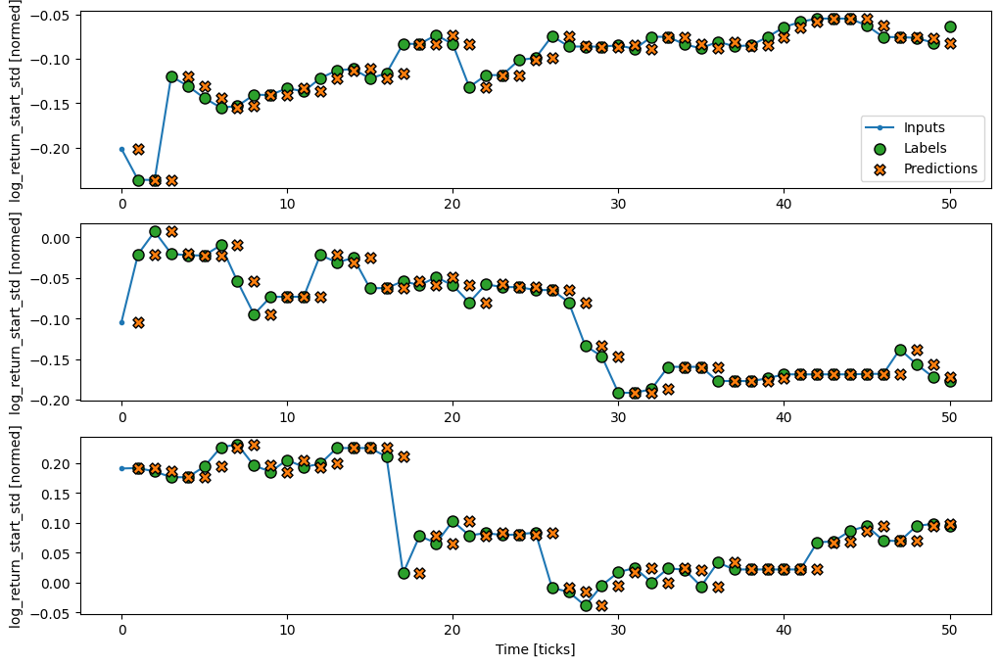

In [32]:
# baseline is likely to perform better on large thresholds
wide_window_configs[0.001].plot(model=baseline, plot_col='log_return_start_std')

In the above plots of three examples the single step model is run over the course of 50 ticks. This deserves some explanation:

- The blue Inputs line shows the input log_return_start_std at each time step. The model receives all features, this plot only shows the log_return_start_std.

- The green Labels dots show the target prediction value. These dots are shown at the prediction time, not the input time. That is why the range of labels is shifted 1 step relative to the inputs.

- The orange Predictions crosses are the model's prediction's for each output time step. If the model were predicting perfectly the predictions would land directly on the Labels.

### Linear regression 

The simplest **trainable** model you can apply to this task is to insert linear transformation between the input and output. In this case the output from a time step only depends on that step.

![Predict the next time step](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/structured_data/images/narrow_window.png?raw=1)


A ***`tf.keras.layers.Dense`*** layer with no activation set is a linear model. The layer only transforms the last axis of the data from (batch, time, inputs) to (batch, time, units); it is applied independently to every item across the batch and time axes.


In [33]:
linear = tf.keras.Sequential([
    tf.keras.layers.Dense(units=1)
])

In [34]:
print('Input shape:', window_configs[0.001].example[0].shape)
print('Output shape:', linear(window_configs[0.001].example[0]).shape)

Input shape: (32, 50, 6)
Output shape: (32, 50, 1)


In [35]:
MAX_EPOCHS = 20

def compile_and_fit(model, window, patience=2):
  early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                    patience=patience,
                                                    mode='min')

  model.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()])

  history = model.fit(window.train, epochs=MAX_EPOCHS,
                      validation_data=window.val,
                      callbacks=[early_stopping])
  return history

In [36]:
for threshold in thresholds:
    # Create a new model for each threshold
    linear = tf.keras.Sequential([
        tf.keras.layers.Dense(units=1)
    ])
    # Train the model
    history = compile_and_fit(linear, window_configs[threshold])
    # Evaluate the model and store results
    train_performance[f'Linear_{threshold}'] = linear.evaluate(x=window_configs[threshold].train, return_dict=True)
    val_performance[f'Linear_{threshold}'] = linear.evaluate(x=window_configs[threshold].val, return_dict=True)
    test_performance[f'Linear_{threshold}'] = linear.evaluate(x=window_configs[threshold].test, return_dict=True)

Epoch 1/20
991/991 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 31.2487 - mean_absolute_error: 5.1725 - val_loss: 0.3619 - val_mean_absolute_error: 0.5495
Epoch 2/20
991/991 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 0.1320 - mean_absolute_error: 0.2825 - val_loss: 0.0687 - val_mean_absolute_error: 0.1850
Epoch 3/20
991/991 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 0.0614 - mean_absolute_error: 0.1651 - val_loss: 0.0678 - val_mean_absolute_error: 0.1846
Epoch 4/20
991/991 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 0.0612 - mean_absolute_error: 0.1661 - val_loss: 0.0671 - val_mean_absolute_error: 0.1846
Epoch 5/20
991/991 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 0.0611 - mean_absolute_error: 0.1668 - val_loss: 0.0670 - val_mean_absolute_error: 0.1848
Epoch 6/20
991/991 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 0.0611 - mean_absolute_error: 0.1672 - val_loss: 0.0670 - val_mean_absolute_error: 0.1847
Epoch 7/20
991/991 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 0.0611 - mean_absolute_error: 0.1672 - 

Like the `baseline` model, the linear model can be called on batches of wide windows. Used this way the model makes a set of independent predictions on consecutive time steps. The `time` axis acts like another `batch` axis. There are no interactions between the predictions at each time step.

![A single step prediction](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/structured_data/images/wide_window.png?raw=1)

In [37]:
print('Input shape:', wide_window_configs[0.015].example[0].shape)
print('Output shape:', linear(wide_window_configs[0.015].example[0]).shape)

Input shape: (32, 50, 6)
Output shape: (32, 50, 1)


Here is the plot of its example predictions on the wide_window

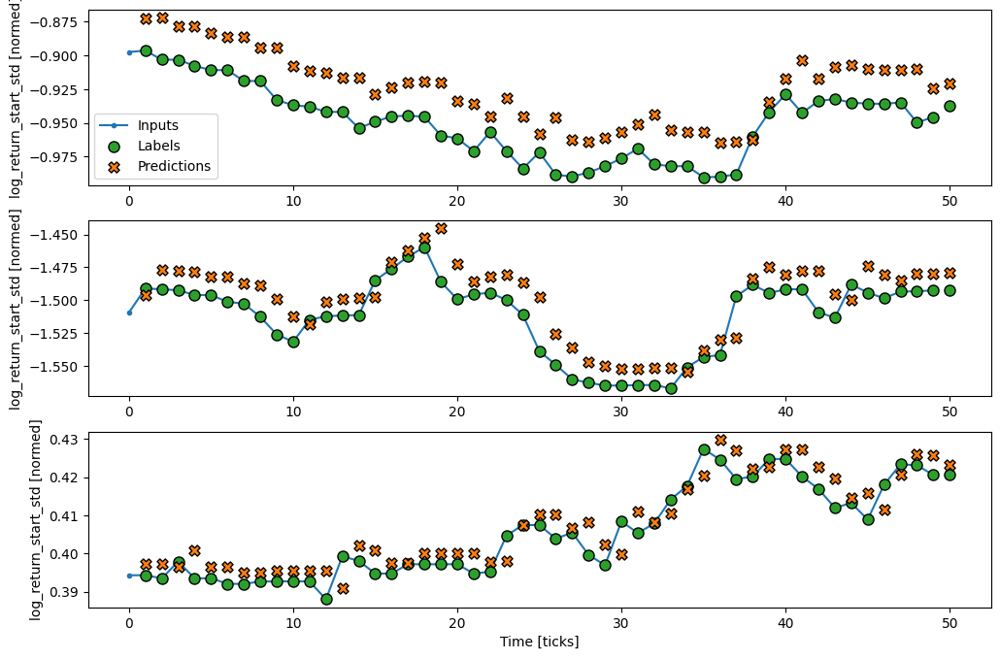

In [38]:
wide_window_configs[0.015].plot(linear)

**Feature importance**

One advantage to linear models is that they're relatively simple to interpret. You can pull out the layer's weights and visualize the weight assigned to each input:

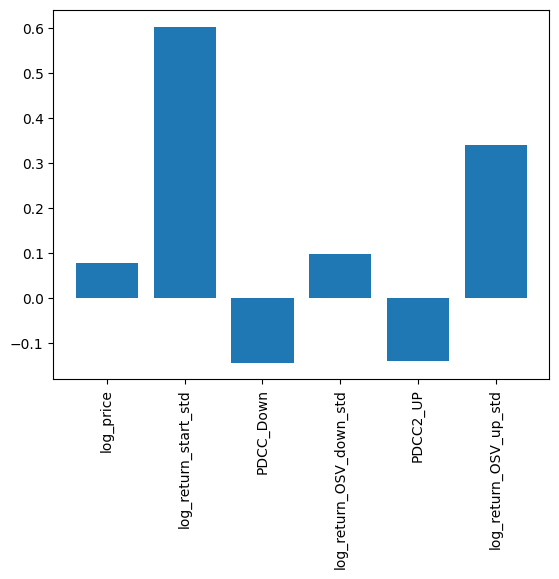

In [39]:
plt.bar(x = range(len(features)),
        height=linear.layers[0].kernel[:,0].numpy())
axis = plt.gca()
axis.set_xticks(range(len(features)))
_ = axis.set_xticklabels(features, rotation=90)

### Linear regression on latent features 
When forecasting from a latent representation, our baseline model should map

Input:   latent vector z ∈ ℝ³ (e.g., [z1, z2, z3])
Target:  next tick target y ∈ ℝ (e.g., log return or price change)

Since the latent vector is a learned, abstract summary of the previous window, a baseline using it has to be **simple yet valid** — meaning it should make minimal assumptions and have low complexity, serving as a benchmark for evaluating whether more complex models actually learn meaningful predictive structure from z.

**Linear Baseline**

- Applies a linear transformation on latent features to predict the target
- Dense layer without activation
- Tests whether the latent features already encode the target ina linearly predictable way


In [40]:
MAX_EPOCHS = 20

def compile_and_fit_latent(model, train_dataset, val_dataset, patience=2):
  early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                    patience=patience,
                                                    mode='min')

  model.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()])

  history = model.fit(train_dataset, epochs=MAX_EPOCHS,
                      validation_data=val_dataset,
                      callbacks=[early_stopping])
  return history

class LinearLatentBaseline(tf.keras.Model):
    def __init__(self, latent_dim):
        super().__init__()
        self.dense = tf.keras.layers.Dense(1, input_shape=(latent_dim,))  # Output shape: (batch_size, 1)

    def call(self, inputs):  # inputs: (batch_size, latent_dim)
        x = self.dense(inputs)  # (batch_size, 1)
        return x[:, tf.newaxis, :]  # (batch_size, 1, 1)


linear_latent = LinearLatentBaseline(latent_dim=3)  # fresh model instance

# Train the model
history = compile_and_fit_latent(linear_latent, train_ds, val_ds)

# Evaluate and store results
train_performance[f'Linear_Latent_Regression'] = linear_latent.evaluate(x=train_ds, return_dict=True)
val_performance[f'Linear_Latent_Regression'] = linear_latent.evaluate(x=val_ds, return_dict=True)
test_performance[f'Linear_Latent_Regression'] = linear_latent.evaluate(x=test_ds, return_dict=True)


Epoch 1/20


/opt/conda/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3962/3962 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step - loss: 19.2505 - mean_absolute_error: 3.3304 - val_loss: 2.1397 - val_mean_absolute_error: 1.1010
Epoch 2/20
3962/3962 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step - loss: 1.1639 - mean_absolute_error: 0.7913 - val_loss: 1.7759 - val_mean_absolute_error: 0.9998
Epoch 3/20
3962/3962 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step - loss: 0.9645 - mean_absolute_error: 0.7304 - val_loss: 1.7768 - val_mean_absolute_error: 1.0100
Epoch 4/20
3962/3962 ━━━━━━━━━━━━━━━━━━━━ 9s 2ms/step - loss: 0.9416 - mean_absolute_error: 0.7227 - val_loss: 1.7771 - val_mean_absolute_error: 1.0119
3962/3962 ━━━━━━━━━━━━━━━━━━━━ 7s 2ms/step - loss: 1.4193 - mean_absolute_error: 0.9251
1128/1128 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 1.4980 - mean_absolute_error: 0.9431
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.7548 - mean_absolute_error: 1.2428


In [41]:
# # Clean perfromance dict of erroneous entry
# val_ds_performance = {
#     key: value
#     for key, value in val_performance.items()
#     if not (key.startswith("Linear_Latent_") and key != "Linear_Latent_Regression")
# }

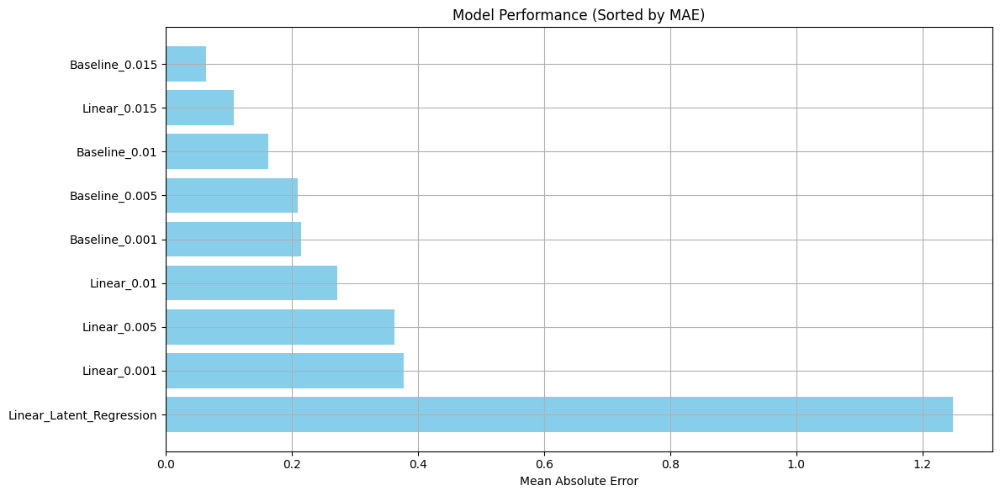

,loss,mean_absolute_error
Baseline_0.015,0.029996,0.063928
Linear_0.015,0.044065,0.107719
Baseline_0.01,0.191356,0.162233
Baseline_0.005,0.314054,0.208571
Baseline_0.001,0.326186,0.214912
Linear_0.01,0.257572,0.271994
Linear_0.005,0.451818,0.361847
Linear_0.001,0.477072,0.377108
Linear_Latent_Regression,2.834637,1.248683


In [42]:
plot_model_performance(test_performance, metric='mean_absolute_error')

### Gradient boosting regression on latent features

In [43]:
import numpy as np
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Utility: convert a tf.data.Dataset into numpy arrays
def extract_xy_from_dataset(dataset):
    x_list, y_list = [], []
    for x_batch, y_batch in dataset:
        x_list.append(x_batch.numpy())
        y_list.append(y_batch.numpy().squeeze())  # squeeze (batch_size, 1, 1) → (batch_size,)
    x_np = np.concatenate(x_list, axis=0)
    y_np = np.concatenate(y_list, axis=0)
    return x_np, y_np

# Extract latent inputs and labels
x_train, y_train = extract_xy_from_dataset(train_ds)
x_val, y_val = extract_xy_from_dataset(val_ds)
x_test, y_test = extract_xy_from_dataset(test_ds)

# Train Gradient Boosting Regressor
gbr = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3)
gbr.fit(x_train, y_train)

# Evaluate
def evaluate_gbr(model, x, y):
    y_pred = model.predict(x)
    return {
        'loss': mean_squared_error(y, y_pred),
        'mean_absolute_error': mean_absolute_error(y, y_pred)
    }

train_performance['Gradient_Boosting_Latent_Regression'] = evaluate_gbr(gbr, x_train, y_train)
val_performance['Gradient_Boosting_Latent_Regression'] = evaluate_gbr(gbr, x_val, y_val)
test_performance['Gradient_Boosting_Latent_Regression'] = evaluate_gbr(gbr, x_test, y_test)


2025-07-20 06:35:05.032380: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


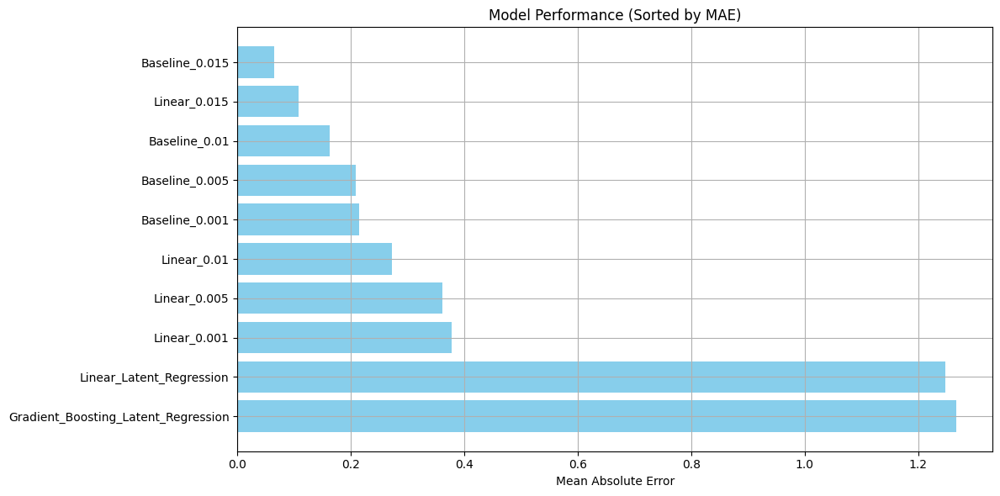

,loss,mean_absolute_error
Baseline_0.015,0.029996,0.063928
Linear_0.015,0.044065,0.107719
Baseline_0.01,0.191356,0.162233
Baseline_0.005,0.314054,0.208571
Baseline_0.001,0.326186,0.214912
Linear_0.01,0.257572,0.271994
Linear_0.005,0.451818,0.361847
Linear_0.001,0.477072,0.377108
Linear_Latent_Regression,2.834637,1.248683
Gradient_Boosting_Latent_Regression,2.494201,1.267858


In [44]:
plot_model_performance(test_performance, metric='mean_absolute_error')

### Dense

Before applying models that actually operate on multiple time-steps, it's worth checking the performance of deeper, more powerful, single input step models.

Here's a model similar to the `linear` model, except it stacks several a few `Dense` layers between the input and the output:


....

When you pass a (batch, time, features) tensor into a Dense layer

```Dense(units=64)```

Keras internally broadcasts the Dense layer across the time dimension, **treating each time step independently**.

So it’s equivalent to:

```tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(64))```


In [45]:
for threshold in thresholds:
    # Create a new model for each threshold
    dense = tf.keras.Sequential([
        tf.keras.layers.Dense(units=64, activation='relu'),
        tf.keras.layers.Dense(units=64, activation='relu'),
        tf.keras.layers.Dense(units=1)
    ])
    # Train the model
    history = compile_and_fit(dense, window_configs[threshold])
    # Evaluate the model and store results
    train_performance[f'Dense_{threshold}'] = dense.evaluate(x=window_configs[threshold].train, return_dict=True)
    val_performance[f'Dense_{threshold}'] = dense.evaluate(x=window_configs[threshold].val, return_dict=True)
    test_performance[f'Dense_{threshold}'] = dense.evaluate(x=window_configs[threshold].test, return_dict=True)

Epoch 1/20
991/991 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 0.0994 - mean_absolute_error: 0.2048 - val_loss: 0.0745 - val_mean_absolute_error: 0.1963
Epoch 2/20
991/991 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0654 - mean_absolute_error: 0.1756 - val_loss: 0.0735 - val_mean_absolute_error: 0.1957
Epoch 3/20
991/991 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0655 - mean_absolute_error: 0.1756 - val_loss: 0.0987 - val_mean_absolute_error: 0.2359
Epoch 4/20
991/991 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - loss: 0.0647 - mean_absolute_error: 0.1739 - val_loss: 0.0732 - val_mean_absolute_error: 0.1972
Epoch 5/20
991/991 ━━━━━━━━━━━━━━━━━━━━ 9s 9ms/step - loss: 0.0636 - mean_absolute_error: 0.1718 - val_loss: 0.0778 - val_mean_absolute_error: 0.1998
Epoch 6/20
991/991 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0640 - mean_absolute_error: 0.1727 - val_loss: 0.0720 - val_mean_absolute_error: 0.1935
Epoch 7/20
991/991 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - loss: 0.0638 - mean_absolute_error: 0.1726 - v

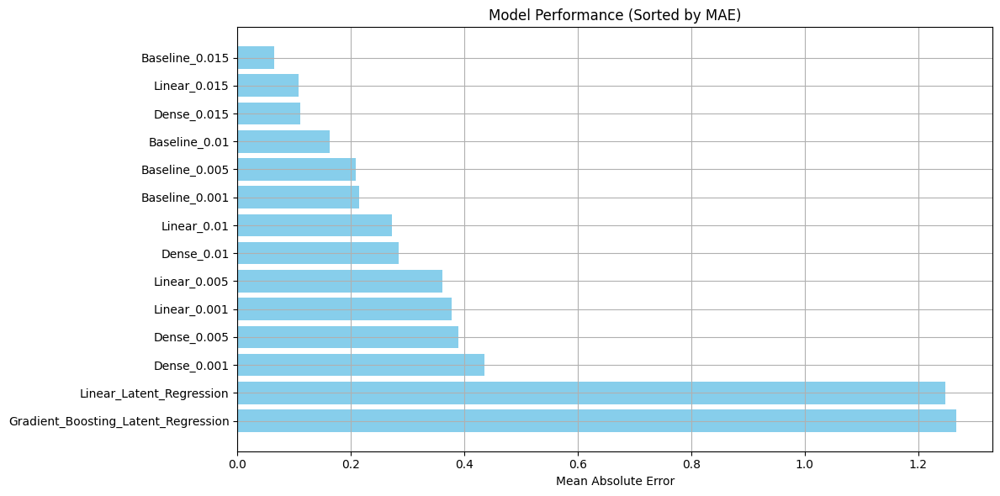

,loss,mean_absolute_error
Baseline_0.015,0.029996,0.063928
Linear_0.015,0.044065,0.107719
Dense_0.015,0.042338,0.111247
Baseline_0.01,0.191356,0.162233
Baseline_0.005,0.314054,0.208571
Baseline_0.001,0.326186,0.214912
Linear_0.01,0.257572,0.271994
Dense_0.01,0.257681,0.284322
Linear_0.005,0.451818,0.361847
Linear_0.001,0.477072,0.377108


In [46]:
plot_model_performance(test_performance, metric='mean_absolute_error')

### Dense on latent features

In [47]:
MAX_EPOCHS = 20

class DenseLatentBaseline(tf.keras.Model):
    def __init__(self):
        super().__init__()
        self.model = tf.keras.Sequential([
            tf.keras.layers.Dense(units=64, activation='relu'),
            tf.keras.layers.Dense(units=64, activation='relu'),
            tf.keras.layers.Dense(units=1)
        ])

    def call(self, inputs):  # inputs: (batch_size, latent_dim)
        x = self.model(inputs)  # (batch_size, 1)
        return x[:, tf.newaxis, :]  # (batch_size, 1, 1)



dense_latent = DenseLatentBaseline()  # fresh model instance

# Train the model
history = compile_and_fit_latent(dense_latent, train_ds, val_ds)

# Evaluate and store results
train_performance[f'Dense_Latent_Regression'] = dense_latent.evaluate(x=train_ds, return_dict=True)
val_performance[f'Dense_Latent_Regression'] = dense_latent.evaluate(x=val_ds, return_dict=True)
test_performance[f'Dense_Latent_Regression'] = dense_latent.evaluate(x=test_ds, return_dict=True)


Epoch 1/20
3962/3962 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - loss: 0.5563 - mean_absolute_error: 0.5041 - val_loss: 1.4161 - val_mean_absolute_error: 0.9125
Epoch 2/20
3962/3962 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - loss: 0.6695 - mean_absolute_error: 0.5874 - val_loss: 1.4463 - val_mean_absolute_error: 0.9398
Epoch 3/20
3962/3962 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - loss: 0.7296 - mean_absolute_error: 0.6307 - val_loss: 1.5205 - val_mean_absolute_error: 0.9758
3962/3962 ━━━━━━━━━━━━━━━━━━━━ 7s 2ms/step - loss: 1.2334 - mean_absolute_error: 0.8966
1128/1128 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 1.8715 - mean_absolute_error: 1.1604
561/561 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.6595 - mean_absolute_error: 1.0945


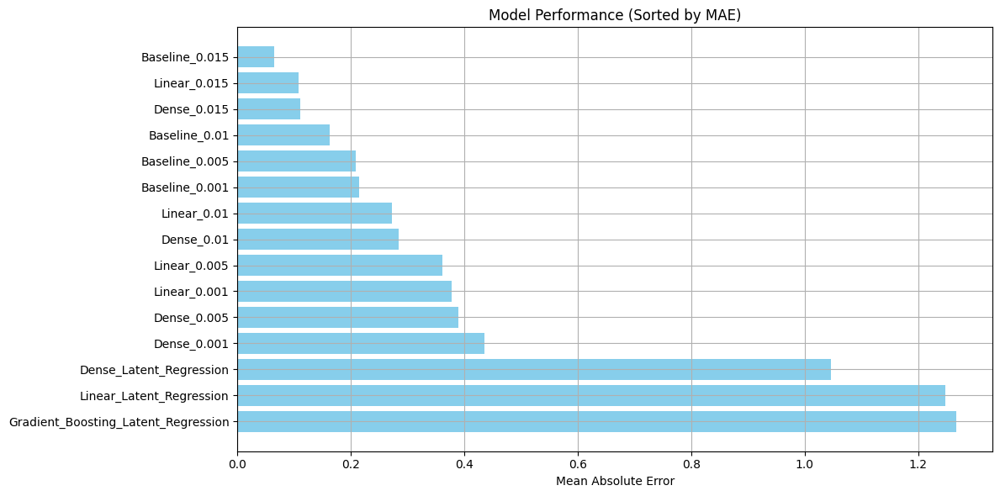

,loss,mean_absolute_error
Baseline_0.015,0.029996,0.063928
Linear_0.015,0.044065,0.107719
Dense_0.015,0.042338,0.111247
Baseline_0.01,0.191356,0.162233
Baseline_0.005,0.314054,0.208571
Baseline_0.001,0.326186,0.214912
Linear_0.01,0.257572,0.271994
Dense_0.01,0.257681,0.284322
Linear_0.005,0.451818,0.361847
Linear_0.001,0.477072,0.377108


In [48]:
plot_model_performance(test_performance, metric='mean_absolute_error')

### Multi-step dense

A single time step model has no context for the current values of its inputs. It can't see how the input features are changing over time. To address this issue the model needs access to multiple time steps when making predictions:

![Three time steps are used for each prediction.](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/structured_data/images/conv_window.png?raw=1)

The `baseline`, `linear` and `dense` models handled each time step independently. Here the model will take multiple time steps as input to produce a single output.

Use a `WindowGenerator` that will produce batches of 50 tick inputs and 1 tick labels:

Note that the `Window`'s `shift` parameter is relative to the end of the two windows.


Text(0.5, 0.98, 'Given 50 ticks of inputs, predict 1 tick into the future.')

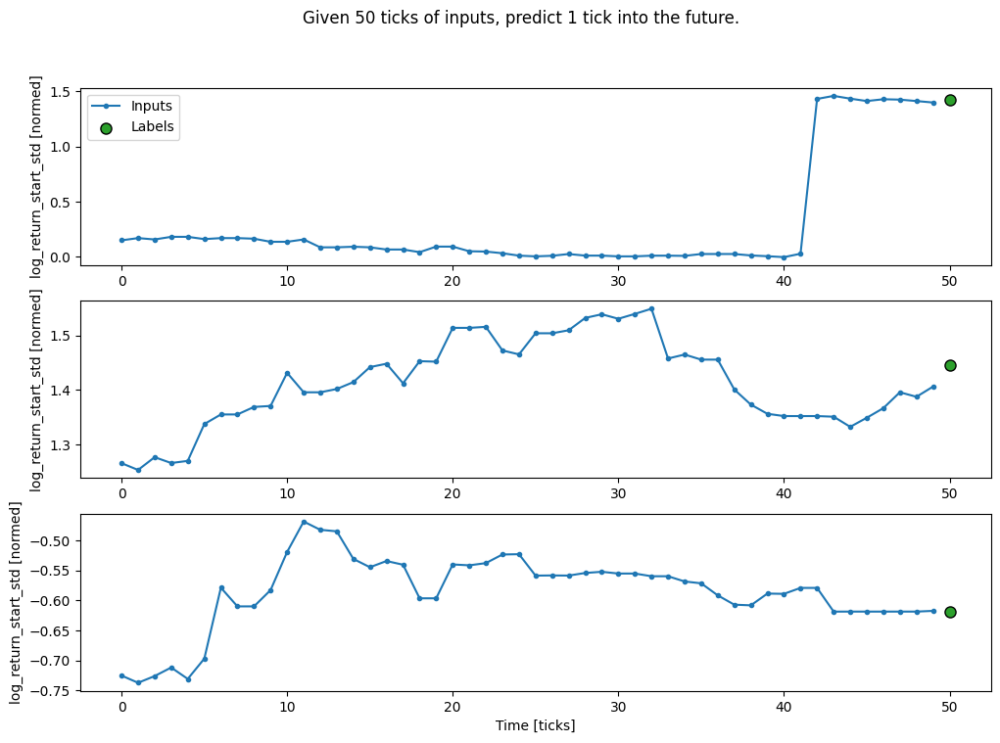

In [49]:
window_configs[0.005].plot()
plt.suptitle("Given 50 ticks of inputs, predict 1 tick into the future.")

You could train a `dense` model on a multiple-input-step window by adding a `tf.keras.layers.Flatten` as the first layer of the model:

In [50]:
multi_step_dense = tf.keras.Sequential([
    # Shape: (time, features) => (time*features)
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=32, activation='relu'),
    tf.keras.layers.Dense(units=32, activation='relu'),
    tf.keras.layers.Dense(units=1),
    # Add back the time dimension.
    # Shape: (outputs) => (1, outputs)
    tf.keras.layers.Reshape([1, -1]),
])
print('Input shape:', window_configs[0.005].example[0].shape)
print('Output shape:', multi_step_dense(window_configs[0.005].example[0]).shape)

Input shape: (32, 50, 6)
Output shape: (32, 1, 1)


**Train multi step dense**

Flattening encodes context as positional correlation across all time steps

So even though this model does not explicitly model time (like an RNN or Transformer), it still has full access to the entire sequence, because:

- After flattening, the entire input sequence becomes one large vector:
- 50 time steps × 6 features = 300 features
- Fully connected layers now see all time steps at once.

The main down-side of this approach is that the resulting model can only be executed on input windows of exactly this shape.

In [51]:
for threshold in thresholds:
    # Create a new model for each threshold
    multi_step_dense = tf.keras.Sequential([
        # Shape: (time, features) => (time*features)
        tf.keras.layers.Flatten(), # (batch, 50, 6) → (batch, 300)
        tf.keras.layers.Dense(units=32, activation='relu'),
        tf.keras.layers.Dense(units=32, activation='relu'),
        tf.keras.layers.Dense(units=1),
        # Add back the time dimension.
        # Shape: (outputs) => (1, outputs)
        tf.keras.layers.Reshape([1, -1]),
    ])
    # Train the model
    history = compile_and_fit(multi_step_dense, window_configs[threshold])
    # Evaluate the model and store results
    train_performance[f'Multi_step_Dense_{threshold}'] = multi_step_dense.evaluate(x=window_configs[threshold].train, return_dict=True)
    val_performance[f'Multi_step_Dense_{threshold}'] = multi_step_dense.evaluate(x=window_configs[threshold].val, return_dict=True)
    test_performance[f'Multi_step_Dense_{threshold}'] = multi_step_dense.evaluate(x=window_configs[threshold].test, return_dict=True)

Epoch 1/20
991/991 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - loss: 0.1458 - mean_absolute_error: 0.1874 - val_loss: 0.0197 - val_mean_absolute_error: 0.0806
Epoch 2/20
991/991 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 0.0099 - mean_absolute_error: 0.0661 - val_loss: 0.0168 - val_mean_absolute_error: 0.0868
Epoch 3/20
991/991 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 0.0084 - mean_absolute_error: 0.0615 - val_loss: 0.0158 - val_mean_absolute_error: 0.0932
Epoch 4/20
991/991 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 0.0077 - mean_absolute_error: 0.0591 - val_loss: 0.0113 - val_mean_absolute_error: 0.0574
Epoch 5/20
991/991 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 0.0070 - mean_absolute_error: 0.0549 - val_loss: 0.0168 - val_mean_absolute_error: 0.0857
Epoch 6/20
991/991 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 0.0063 - mean_absolute_error: 0.0513 - val_loss: 0.0111 - val_mean_absolute_error: 0.0679
Epoch 7/20
991/991 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 0.0061 - mean_absolute_error: 0.0501 - v

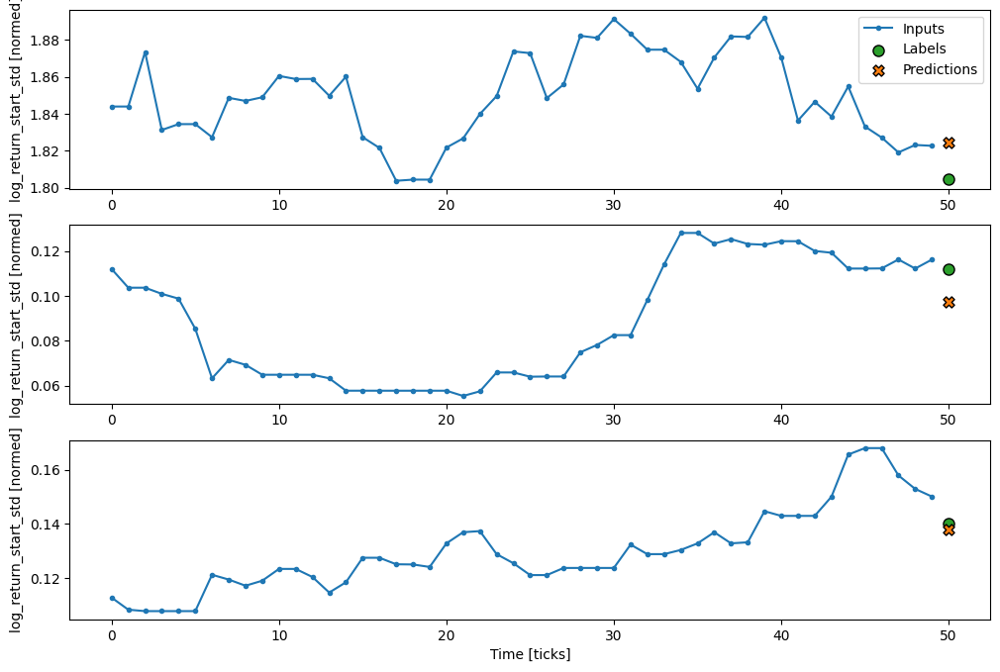

In [52]:
# Use 0.015 because it was last model that was trained in the loop
window_configs[0.015].plot(multi_step_dense)

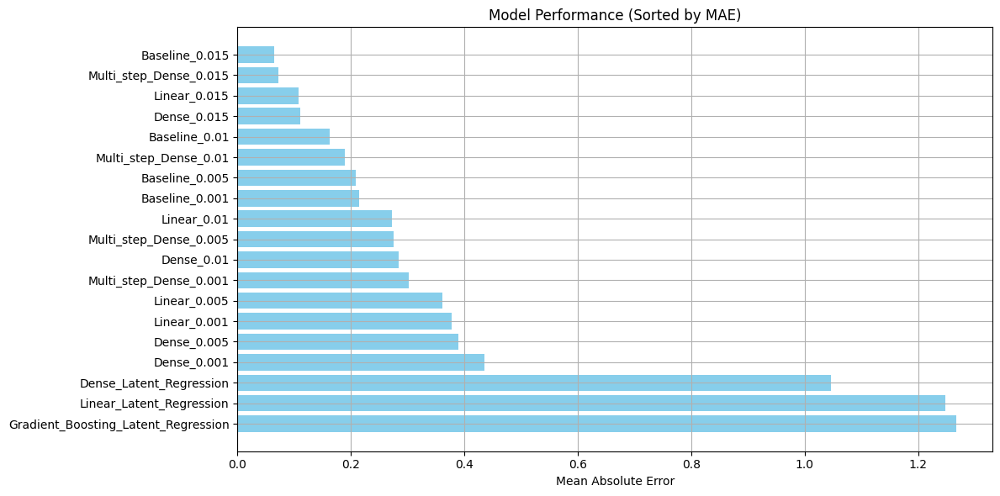

,loss,mean_absolute_error
Baseline_0.015,0.029996,0.063928
Multi_step_Dense_0.015,0.021564,0.071770
Linear_0.015,0.044065,0.107719
Dense_0.015,0.042338,0.111247
Baseline_0.01,0.191356,0.162233
Multi_step_Dense_0.01,0.139492,0.188509
Baseline_0.005,0.314054,0.208571
Baseline_0.001,0.326186,0.214912
Linear_0.01,0.257572,0.271994
Multi_step_Dense_0.005,0.278550,0.274958


In [56]:
plot_model_performance(test_performance, metric='mean_absolute_error')

### Multi-step on latent features

In [ ]:
MAX_EPOCHS = 20

class MultiStepDenseLatent(tf.keras.Model):
    def __init__(self):
        super().__init__()
        # self.model = None

    def call(self, inputs):  # inputs: (batch_size, latent_dim)
        x = self.model(inputs)  # (batch_size, 1)
        return x[:, tf.newaxis, :]  # (batch_size, 1, 1)



multi_step_dense_latent = MultiStepDenseLatent()  # fresh model instance

# Train the model
history = compile_and_fit_latent(multi_step_dense_latent, train_ds, val_ds)

# Evaluate and store results
train_performance[f'Multi_step_Dense_Latent_Regression'] = multi_step_dense_latent.evaluate(x=train_ds, return_dict=True)
val_performance[f'Multi_step_Dense_Latent_Regression'] = multi_step_dense_latent.evaluate(x=val_ds, return_dict=True)
test_performance[f'Multi_step_Dense_Latent_Regression'] = multi_step_dense_latent.evaluate(x=test_ds, return_dict=True)


# Old methodology

#### 1.3.0 Move overlapping records

In [54]:
import pandas as pd

def move_records(train, validation, test):
    # Move records from train to validation
    if not validation.empty:
        # Find the minimum end_time in the validation set
        val_min_end_time = validation['end_time'].min()
        # Identify rows in train with end_time >= val_min_end_time
        mask_train = train['end_time'] >= val_min_end_time
        to_move_train = train[mask_train]
        # Remove these rows from train
        train = train[~mask_train]
        # Append these rows to validation
        validation = pd.concat([validation, to_move_train], ignore_index=True)
    
    # Move records from validation to test
    if not test.empty:
        # Find the minimum end_time in the test set
        test_min_end_time = test['end_time'].min()
        # Identify rows in validation with end_time >= test_min_end_time
        mask_val = validation['end_time'] >= test_min_end_time
        to_move_val = validation[mask_val]
        # Remove these rows from validation
        validation = validation[~mask_val]
        # Append these rows to test
        test = pd.concat([test, to_move_val], ignore_index=True)
    
    # Sort each DataFrame chronologically by the "end_time" column    
    train = train.sort_values("end_time").reset_index(drop=True)
    validation = validation.sort_values("end_time").reset_index(drop=True)
    test = test.sort_values("end_time").reset_index(drop=True)
    
    return train, validation, test 


In [55]:
upward_train_data, upward_val_data, upward_test_data = move_records(upward_train_data, upward_val_data, upward_test_data)

NameError: name 'upward_train_data' is not defined

In [ ]:
downward_train_data, downward_val_data, downward_test_data = move_records(downward_train_data, downward_val_data, downward_test_data)

#### 1.3.1 Plot timeseries with split indicators

In [ ]:
def get_date_intervals(train, val, test):
    """
    Prints the date ranges for train, validation, and test splits.
    """
    print(f"Train: {train['end_time'].min()} → {train['end_time'].max()}")
    print(f"Validation: {val['end_time'].min()} → { val['end_time'].max()}")
    print(f"Test: {test['end_time'].min()} → {test['end_time'].max()}")


In [ ]:
print("Upward OS:\n")
get_date_intervals(upward_train_data, upward_val_data, upward_test_data)
# print("Upward OS 1%:\n")
# get_date_intervals(upward_train_data, upward_val_data, upward_test_data_1)
print("\nDownward OS:\n")
get_date_intervals(downward_train_data, downward_val_data, downward_test_data)
# print("\nDownward OS 1%:\n")
# get_date_intervals(downward_train_data, downward_val_data, downward_test_data_1)

In [ ]:
def plot_time_series_splits(train, val, test, title, path):
    """
    Plots the full time series with different colors for train, validation, and test splits.
    """
    plt.figure(figsize=(12, 6))

    # Plot each split with a different color
    plt.plot(train['end_time'], train['price_move'], label="Train", color="blue", linewidth=2)
    plt.plot(val['end_time'], val['price_move'], label="Validation", color="orange", linewidth=2)
    plt.plot(test['end_time'], test['price_move'], label="Test", color="red", linewidth=2)

    # Add vertical lines to mark split points
    plt.axvline(x=val['end_time'].iloc[0], color='black', linestyle='--', label="Train/Val Split")
    plt.axvline(x=test['end_time'].iloc[0], color='black', linestyle='-.', label="Val/Test Split")

    plt.xlabel("Date")
    plt.ylabel("Price Change (%)")
    plt.title(title)
    plt.legend()
    # Save the figure
    plt.savefig(path, dpi=300, bbox_inches='tight')
    plt.show()

In [ ]:
plot_time_series_splits(upward_train_data, 
                        upward_val_data, 
                        upward_test_data, 
                        title="Upward OS event data splits",
                        path="plots/upward_os_event_data_splits.png")
plot_time_series_splits(downward_train_data, 
                        downward_val_data, 
                        downward_test_data,
                        title="Downward OS event data splits",
                        path="plots/downward_os_event_data_splits.png")

### 1.4 Sklearn transform pipeline experiments

In [ ]:
def get_pipelines():
    pipeline_yj = Pipeline([
        ("power", PowerTransformer(method='yeo-johnson'))
    ])

    pipeline_minmax = Pipeline([
        ("minmax", MinMaxScaler())
    ])

    pipeline_yj_minmax = Pipeline([
        ("power", PowerTransformer(method='yeo-johnson')),  
        ("minmax", MinMaxScaler())
    ])
    
    return pipeline_yj, pipeline_minmax, pipeline_yj_minmax

def apply_transform(pipeline, train, val, test, extra=None):
    train_transformed = pipeline.fit_transform(train.price_move.to_numpy().reshape(-1, 1))
    val_transformed = pipeline.transform(val.price_move.to_numpy().reshape(-1, 1))
    test_transformed = pipeline.transform(test.price_move.to_numpy().reshape(-1, 1))
    if extra is not None: 
        # Per threshold
        extra_transformed = pipeline.transform(extra.price_move.to_numpy().reshape(-1, 1))
        return train_transformed, val_transformed, test_transformed, extra_transformed
    return train_transformed, val_transformed, test_transformed

Experimenting with different transformation options

In [ ]:
# Upward Transform
upward_pipeline_yj, upward_pipeline_minmax, upward_pipeline_yj_minmax = get_pipelines()

# Downward transform
downward_pipeline_yj, downward_pipeline_minmax, downward_pipeline_yj_minmax = get_pipelines()

Now we need to apply transformations to these:

- upward_train_data, upward_val_data, upward_test_data
- downward_train_data, downward_val_data, downward_test_data

#### Run one of 1.4.1, 1.4.2 OR 1.4.3

#### 1.4.1 Yeo Johnson

In [ ]:
# # Fit on upward OS train data
upward_train_transformed, upward_val_transformed, upward_test_transformed = apply_transform(upward_pipeline_yj, 
                                                                                                                             upward_train_data, 
                                                                                                                             upward_val_data, 
                                                                                                                             upward_test_data, 
                                                                                                                             # upward_test_data_07
                                                                                                                            )

# Fit on downward OS train data
downward_train_transformed, downward_val_transformed, downward_test_transformed = apply_transform(downward_pipeline_yj, 
                                                                                                                                     downward_train_data, 
                                                                                                                                     downward_val_data, 
                                                                                                                                     downward_test_data, 
                                                                                                                                     # downward_test_data_07
                                                                                                                                    )

# Uncomment to experiment with both validation and test sets exclusively from 0.7% threshold only
# Fit on upward OS train data
# upward_train_transformed, upward_val_transformed, upward_test_transformed, upward_test_data_transformed_05 = apply_transform(upward_pipeline_yj, 
#                                                                                                                              upward_train_data, 
#                                                                                                                              upward_val_data_07, 
#                                                                                                                              upward_test_data, 
#                                                                                                                              upward_test_data_07)

# # Fit on downward OS train data
# downward_train_transformed, downward_val_transformed, downward_test_transformed, downward_test_data_transformed_05 = apply_transform(downward_pipeline_yj, 
#                                                                                                                                      downward_train_data, 
                                                                                                                                     # downward_val_data_07, 
                                                                                                                                     # downward_test_data, 
                                                                                                                                     # downward_test_data_07)

In [ ]:
# Confirm is fitted
try:
    check_is_fitted(upward_pipeline_yj.named_steps['power'])  # Check PowerTransformer
    check_is_fitted(downward_pipeline_yj.named_steps['power'])  # Check PowerTransformer
    print("Pipeline is fit!")
except:
    print("Pipeline is NOT fit!")


#### 1.4.2 Min max scaling

In [ ]:
# # Fit on upward OS train data
# upward_train_transformed, upward_val_transformed, upward_test_transformed = apply_transform(upward_pipeline_minmax, upward_train_data, upward_val_data, upward_test_data)

# # Fit on downward OS train data
# downward_train_transformed, downward_val_transformed, downward_test_transformed = apply_transform(downward_pipeline_minmax, upward_train_data, upward_val_data, upward_test_data)

In [ ]:
# # Confirm is fitted
# try:
#     check_is_fitted(upward_pipeline_minmax.named_steps['minmax'])  # Check PowerTransformer
#     check_is_fitted(downward_pipeline_minmax.named_steps['minmax'])  # Check PowerTransformer
#     print("Pipeline is fit!")
# except:
#     print("Pipeline is NOT fit!")


#### 1.4.3 Yeo Johnson + Min max scaling

In [ ]:
# # Fit on upward OS train data
# upward_train_transformed, upward_val_transformed, upward_test_transformed, upward_test_data_transformed_05 = apply_transform(upward_pipeline_yj_minmax, 
#                                                                                                                              upward_train_data, 
#                                                                                                                              upward_val_data, 
#                                                                                                                              upward_test_data, 
#                                                                                                                              upward_test_data_05)

# # Fit on downward OS train data
# downward_train_transformed, downward_val_transformed, downward_test_transformed, downward_test_data_transformed_05 = apply_transform(downward_pipeline_yj_minmax, 
#                                                                                                                                      downward_train_data, 
#                                                                                                                                      downward_val_data, 
#                                                                                                                                      downward_test_data, 
#                                                                                                                                      downward_test_data_05)

In [ ]:
# # Confirm is fitted
# try:
#     check_is_fitted(upward_pipeline_yj_minmax.named_steps['power'])  # Check PowerTransformer
#     check_is_fitted(upward_pipeline_yj_minmax.named_steps['minmax'])  # Check MinMaxScaler
#     check_is_fitted(downward_pipeline_yj_minmax.named_steps['power'])  # Check PowerTransformer
#     check_is_fitted(downward_pipeline_yj_minmax.named_steps['minmax'])  # Check MinMaxScaler
#     print("Pipeline is fit!")
# except:
#     print("Pipeline is NOT fit!")


### 1.5 Explore data distribution after Transform

**Compute stats on numpy array**

In [ ]:
print("Upward OS transformed train, val, test stats:\n")
print(pd.Series(upward_train_transformed.ravel()).describe().apply(lambda x: f"{x:.20f}"))
print(pd.Series(upward_val_transformed.ravel()).describe().apply(lambda x: f"{x:.20f}"))
print(pd.Series(upward_test_transformed.ravel()).describe().apply(lambda x: f"{x:.20f}"))
# print(pd.Series(upward_test_data_transformed_05.ravel()).describe().apply(lambda x: f"{x:.20f}"))

print("\nDownward OS transformed train, val, test stats:\n")
print(pd.Series(downward_train_transformed.ravel()).describe().apply(lambda x: f"{x:.20f}"))
print(pd.Series(downward_val_transformed.ravel()).describe().apply(lambda x: f"{x:.20f}"))
print(pd.Series(downward_test_transformed.ravel()).describe().apply(lambda x: f"{x:.20f}"))
# print(pd.Series(downward_test_data_transformed_05.ravel()).describe().apply(lambda x: f"{x:.20f}"))

#### 1.5.1 Histogram

In [ ]:
# Visualize the transformed distribution
sns.histplot(upward_train_transformed, kde=True, label='Yeo-Johnson Transform')
# plt.title('Histogram of Upward Overshoot Price Changes')
plt.xlabel('Transformed Price Change')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.legend()
# Save the figure
plt.savefig("plots/histogram_yj_upward_os_event_timeseries.png", dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# Visualize the transformed distribution
sns.histplot(downward_train_transformed, kde=True, label='Yeo-Johnson Transform')
# plt.title('Histogram of Downward Overshoot Price Changes')
plt.xlabel('Transformed Price Change')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.legend()
# Save the figure
plt.savefig("plots/histogram_yj_downward_os_event_timeseries.png", dpi=300, bbox_inches='tight')
plt.show()

#### 1.5.2 QQ plot

In [ ]:
# QQ plot to visually check for normality (after transformation)
probplot(upward_train_transformed.ravel(), dist="norm", plot=plt)
plt.title('Upward OS Probability Plot (Yeo-Johnson)')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.savefig("plots/qq_yeo_upward_Probability_Plot.png", dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# QQ plot to visually check for normality (after transformation)
probplot(downward_train_transformed.ravel(), dist="norm", plot=plt)
plt.title('Downward OS Probability Plot (Yeo-Johnson)')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.savefig("plots/qq_yeo_downward_Probability_Plot.png", dpi=300, bbox_inches='tight')
plt.show()

We can also visually observe in the QQ plot how close the data is to a normal distribution. The QQ plot orders the z-scores from low to high and plots each values z score on the y axis. The x axis is the corresponding quantile of a normal distribution. Since the data is normalized, the units correspond to the number of standard deviations away from the mean, Since the data points do not roughly fall on the diagonal line, then the distribution is considered furter away to normal..

The points are far below the line for low values, and far above the line for high values, indicating the data are not normally distributed. This means we are much more likely to observe extreme values that would be expected if the data had a normal distribution.

Another observation is that data are close to the line for the data within 1 standard deviation. This phenomenon is typicall knonw as data being "normal in the middle" (Tukey 1987) but having much longer tails.

#### 1.5.3 Interpretation

Observations from the QQ Plots (before and after Yeo Johnson)

**Before Transformation (Original Data)**

1. Significant deviation from the normal distribution:
- The right tail (upper quantiles) shows heavy skewness, meaning the data has extreme values.

- The left tail (lower quantiles) is compressed, indicating a lack of symmetry.

- S-shaped curve: Suggests positive skewness, where the right tail is longer than the left.

- The distribution is not Gaussian and requires transformation.

**After Yeo-Johnson Transformation**
1. Improved normality:

- The tails are much closer to the diagonal line, meaning extreme values have been compressed.

- The S-shape has reduced, showing a more symmetric distribution.

- The middle section aligns well with the diagonal, indicating that central quantiles now follow a normal distribution.

- Some slight deviation remains at the extremes, but overall the transformation has significantly improved the Gaussianity of the data.


**Interpretation**

Before Transformation: 
- The data is non-normal, positively skewed, and contains extreme values.

- Statistic all methods assuming normality would not perform well.

After Yeo-Johnson Transformation: 
- The normality assumption is much better satisfied.

- The tails are closer to a normal distribution, improving the applicability of normality-based methods.


Questions:
Would this help VAE's latent space learn a more normal representation? Is that good?

### 1.6 Create windowed datasets
https://www.tensorflow.org/tutorials/structured_data/time_series#data_windowing

In [ ]:
### Shuffle 
shuffle = True
seq_length = 10

In [ ]:
def create_windowed_datasets(data, seq_length = 50, shuffle=False):
    # https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/timeseries_dataset_from_array
    dataset = keras.utils.timeseries_dataset_from_array(
        data=data, 
        targets=data[seq_length:], 
        sequence_length=seq_length,
        shuffle=shuffle
        )
    
    return dataset

def unpack_ts_dataset(dataset):
    # Initialize empty lists to collect sequences and targets
    all_inputs = []
    all_targets = []

    # Iterate over the dataset and extract data
    for batch in dataset:
        inputs, targets = batch  # Unpack batch

        all_inputs.append(inputs.numpy())  # Convert to NumPy and store
        all_targets.append(targets.numpy())

    # Convert lists to NumPy arrays
    all_inputs = np.concatenate(all_inputs, axis=0)  # Shape: (num_samples, seq_length)
    all_targets = np.concatenate(all_targets, axis=0)  # Shape: (num_samples,)

    # Print shapes to verify
    print(f"Inputs Shape: {all_inputs.shape}")
    print(f"Targets Shape: {all_targets.shape}")
    
    return all_inputs, all_targets

At this point we need to use the data outputs from Sklearn transform pipeline

- upward_train_transformed, upward_val_transformed, upward_test_transformed
- downward_train_transformed, downward_val_transformed, downward_test_transformed 

##### Run this cell If transform was applied using sklearn pipeline

In [ ]:
# Upward windows
upward_os_train_dataset = create_windowed_datasets(upward_train_transformed, seq_length, shuffle)
upward_os_val_dataset = create_windowed_datasets(upward_val_transformed, seq_length, shuffle)
upward_os_test_dataset = create_windowed_datasets(upward_test_transformed, seq_length)
# upward_os_test_dataset_05 = create_windowed_datasets(upward_test_data_transformed_05, seq_length)

# Downward windowas
downward_os_train_dataset = create_windowed_datasets(downward_train_transformed, seq_length, shuffle)
downward_os_val_dataset = create_windowed_datasets(downward_val_transformed, seq_length, shuffle)
downward_os_test_dataset = create_windowed_datasets(downward_test_transformed, seq_length)
# downward_os_test_dataset_05 = create_windowed_datasets(downward_test_data_transformed_05, seq_length)

##### Run this cell if you do not want to apply any transform / want to ignore the sklearn transform in 1.4

In [ ]:
# # NO TRansformation
# # Upward windows
# upward_os_train_dataset = create_windowed_datasets(upward_train_data.price_move.values.reshape(-1,1), seq_length, shuffle)
# upward_os_val_dataset = create_windowed_datasets(upward_val_data.price_move.values.reshape(-1,1), seq_length, shuffle)
# upward_os_test_dataset = create_windowed_datasets(upward_test_data.price_move.values.reshape(-1,1), seq_length)
# upward_os_test_dataset_05 = create_windowed_datasets(upward_test_data_05.price_move.values.reshape(-1,1), seq_length)

# # Downward windowas
# downward_os_train_dataset = create_windowed_datasets(downward_train_data.price_move.values.reshape(-1,1), seq_length, shuffle)
# downward_os_val_dataset = create_windowed_datasets(downward_val_data.price_move.values.reshape(-1,1), seq_length, shuffle)
# downward_os_test_dataset = create_windowed_datasets(downward_test_data.price_move.values.reshape(-1,1), seq_length)
# downward_os_test_dataset_05 = create_windowed_datasets(downward_test_data_05.price_move.values.reshape(-1,1), seq_length)

#### 1.4.1 VAE datasets

In [ ]:
# Unpack Up
upward_train_input_seq, upward_train_labels = unpack_ts_dataset(upward_os_train_dataset)
upward_val_input_seq, upward_val_labels = unpack_ts_dataset(upward_os_val_dataset)
upward_test_input_seq, upward_test_labels = unpack_ts_dataset(upward_os_test_dataset)
# upward_test_input_seq_05, upward_test_labels_05 = unpack_ts_dataset(upward_os_test_dataset_05)

# Unpack Down
downward_train_input_seq, downward_train_labels = unpack_ts_dataset(downward_os_train_dataset)
downward_val_input_seq, downward_val_labels = unpack_ts_dataset(downward_os_val_dataset)
downward_test_input_seq, downward_test_labels = unpack_ts_dataset(downward_os_test_dataset)
# downward_test_input_seq_05, downward_test_labels_05 = unpack_ts_dataset(downward_os_test_dataset_05)

#### 1.4.2 Validate correctness

Windows must have been create with shuffle = false for this validation to work


In [ ]:
#  windows must have been create with shuffle = false for this validation to work
# for batch in upward_os_test_dataset:
#     inputs, targets = batch
#     first_input_seq = upward_test_transformed[:50]  # First sequence (50 steps)
#     first_target = upward_test_transformed[50]  # The 51st value
    
#     assert np.array_equal(inputs[0].numpy(), first_input_seq), "Mismatch in first sequence"
#     assert np.array_equal(targets[0].numpy(), first_target), "Mismatch in first target"
#     break


## 2. Upward OS VAE

### Reconstruction plotting function

In [ ]:
def plot_original_vs_reconstruction_v2(X, 
                                       encoder, 
                                       decoder, 
                                       sample_index=0, 
                                       title='Reconstructed Sequence', 
                                       path='plots/vae_reconstrcution_plot'):
    """
    Plots a single sample (shape (1, 50)) from X (the original),
    and its VAE reconstruction. 
    Here, X has shape (num_samples, 1, 50).

    Parameters
    ----------
    X : np.ndarray
        The array of samples, shape (num_samples, 1, 50).
    encoder : tf.keras.Model
        The VAE encoder, outputs [z_mean, z_log_var, z].
    decoder : tf.keras.Model
        The VAE decoder, takes z as input and outputs the reconstruction.
    sample_index : int
        Index of the sample in X to plot.
    """
    # 1. Extract one sample: shape is now (1, 50)
    original_seq = X[sample_index]  # shape (1, 50)

    # 2. Add a batch dimension -> (1, 1, 50)
    original_seq_batch = np.expand_dims(original_seq, axis=0)

    # 3. Encode
    z_mean, z_log_var, z = encoder.predict(original_seq_batch)  # shape (1, latent_dim)

    # 4. Decode
    reconstructed_seq = decoder.predict(z)  # shape (1, 1, 50)

    # 5. Remove batch dimension -> (1, 50)
    reconstructed_seq = reconstructed_seq[0]  # shape (1, 50)

    # For easy plotting, let's flatten each to (50,)
    original_seq = original_seq[0]           # shape (50,)
    reconstructed_seq = reconstructed_seq[0] # shape (50,)

    # 6. Plot
    plt.figure(figsize=(12, 4))

    # Left subplot: Original
    plt.subplot(1, 2, 1)
    plt.plot(original_seq, label='Original', color='blue')
    plt.title("Original Sequence")
    plt.legend()

    # Right subplot: Reconstructed
    plt.subplot(1, 2, 2)
    plt.plot(reconstructed_seq, label='Reconstruction', color='orange')
    plt.title(title)
    plt.legend()
    plt.savefig(path, dpi=300, bbox_inches='tight')
    plt.tight_layout()
    plt.show()


### Model 1: Multi-threshold VAE encoder/decoder model training

In [ ]:
import numpy as np
import tensorflow as tf
import keras
from keras import ops
from keras import layers

"""
## Create a sampling layer
"""
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.seed_generator = keras.random.SeedGenerator(1998)

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = ops.shape(z_mean)[0]
        dim = ops.shape(z_mean)[1]
        epsilon = keras.random.normal(shape=(batch, dim), seed=self.seed_generator)
        return z_mean + ops.exp(0.5 * z_log_var) * epsilon

"""
## Build the encoder
"""
# seq_length = 50
latent_dim = 8 
initial_kl_weight = 0.0001

# Encoder
encoder_inputs = tf.keras.Input(shape=(1, seq_length))

x = tf.keras.layers.LSTM(128,
                         return_sequences=True,
                         dropout=0.2 # regularization
                        )(encoder_inputs)
x = tf.keras.layers.LSTM(64,
                         return_sequences=True,
                         dropout=0.2 # regularization
                        )(x)
x = tf.keras.layers.LSTM(32,
                         return_sequences=False,
                         # dropout=0.2 # regularization
                        )(encoder_inputs)

z_mean = tf.keras.layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = tf.keras.layers.Dense(latent_dim, name="z_log_var")(x)
z = Sampling()([z_mean, z_log_var])

encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
encoder.summary()
keras.utils.plot_model(encoder, 'plots/model_1_multithreshold_upward_os_lstm_encoder.png', show_shapes=True)


"""
## Build the decoder
"""

# Decoder
latent_inputs = tf.keras.Input(shape=(latent_dim,), name="z_sampling")
# Repeat across timesteps so LSTM can generate a full sequence
x = tf.keras.layers.RepeatVector(1)(latent_inputs)
# Now x has shape (batch_size, seq_length, 32)
x = tf.keras.layers.LSTM(32,
                         return_sequences=True,
                         # dropout=0.2
                        )(x)
x = tf.keras.layers.LSTM(64,
                         return_sequences=True,
                         dropout=0.2
                        )(x)
x = tf.keras.layers.LSTM(128,
                         return_sequences=True,
                         dropout=0.2
                        )(x)


# Final time distributed Dense that outputs a single feature at each timestep
decoder_outputs = tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(seq_length))(x)
decoder = tf.keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()
keras.utils.plot_model(decoder, 'plots/model_1_multithreshold_upward_os_lstm_decoder.png', show_shapes=True)

"""
## Define the VAE as a `Model` with a custom `train_step`
"""

class VAE(keras.Model):
    def __init__(self, encoder, decoder, kl_weight=initial_kl_weight, **kwargs):
        super().__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.kl_weight = kl_weight
        
        # Trackers for loss componenets
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = keras.metrics.Mean(
            name="reconstruction_loss"
        )
        self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
        ]
    
    def train_step(self, data):
        # data has shape (batch_size, seq_length, 1)
        # Forward pass
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(data, training=True)
            reconstruction = self.decoder(z, training=True)
            # Calculate reconstruction loss (MSE)
            reconstruction_loss = tf.reduce_mean(
                tf.reduce_sum(keras.losses.mean_squared_error(data, reconstruction), axis=(0, 1))
            )
            # KL divergence
            kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
            kl_loss = self.kl_weight * tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
            # kl_loss = 0.0001 * tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
            # kl_loss = 1 * tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
            
            # total_loss = reconstruction_loss + self.kl_weight * kl_loss
            total_loss = reconstruction_loss + kl_loss

            
        # Backprop and update
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        
        # Update KL weight dynamically
        self.kl_weight = min(1.0, self.kl_weight * 1.10) # Gradually increase KL contribution
        
        # Update metrics
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }
    
    def test_step(self, data):
        """
        Similar to train_step, but no gradient updates.
        Used during validation/test phases (model.evaluate() or val_data in model.fit()).
        """
        # data shape: (batch_size, seq_length, 1)
        z_mean, z_log_var, z = self.encoder(data, training=False)
        reconstruction = self.decoder(z, training=False)

        # Calculate reconstruction loss (MSE)
        reconstruction_loss = tf.reduce_mean(
            tf.reduce_sum(keras.losses.mean_squared_error(data, reconstruction), axis=(0, 1))
        )
        # KL divergence
        kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
        kl_loss = self.kl_weight * tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
        # kl_loss = 0.0001 * tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
        # kl_loss = 1 * tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
        # total_loss = reconstruction_loss + self.kl_weight * kl_loss
        total_loss = reconstruction_loss + kl_loss


        # Update metrics (no backprop here)
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)

        # Return a dict mapping metric names to current value
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }

    def call(self, inputs, training=False):
        """
        This method defines the forward pass for inference.
        Typically, you'd want to return the reconstruction (or z if you prefer).
        """
        z_mean, z_log_var, z = self.encoder(inputs, training=training)
        reconstruction = self.decoder(z, training=training)
        return reconstruction

"""
## Train the VAE
"""
vae = VAE(encoder, decoder)


# Create a logs directory with a timestamp.
log_dir = "logs/fit/model_1_multithreshold_upward_os_" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir=log_dir, 
    histogram_freq=1,      # Log weight histograms every epoch.
    write_graph=True, 
    update_freq="epoch"    # Log metrics at the end of each epoch.
)

checkpoint_filepath='weights/model_1_multithreshold_upward_os_lstm_vae.weights.h5'
best_model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
                filepath=checkpoint_filepath,
                save_best_only=True,
                monitor='val_loss',
                save_weights_only=True, # Only save weights
                verbose=0
            )
early_stopping_callback = keras.callbacks.EarlyStopping(
    monitor="val_loss",
    min_delta=0,
    patience=10,
    verbose=1,
    mode="auto",
    baseline=None,
    restore_best_weights=True,
    start_from_epoch=2,
)
# Learning rate scheduler
# lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
#     initial_learning_rate=0.001,
#     decay_steps=1000,  
#     decay_rate=0.9) 

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.005,  # Increase LR temporarily
    decay_steps=5000,  # Slower decay
    decay_rate=0.95)   # Less aggressive decay

# Cosine learning rate annealing
# lr_schedule = tf.keras.optimizers.schedules.CosineDecay(initial_learning_rate=0.001, decay_steps=5000)

# Build model
vae.build(input_shape=(None,1, seq_length))

# optimizer = tf.keras.optimizers.AdamW(learning_rate=lr_schedule, weight_decay=1e-5)
optimizer = tf.keras.optimizers.AdamW(learning_rate=lr_schedule)
# optimizer = tf.keras.optimizers.AdamW(learning_rate=0.09)  # Fixed learning rate

vae.compile(optimizer=optimizer)

epochs = 200  # Increase epochs
batch_size = 128 

# Train
history = vae.fit(upward_train_input_seq.reshape(upward_train_input_seq.shape[0], 1, seq_length),
                  epochs=epochs,
                  batch_size=batch_size,
                  validation_data=upward_val_input_seq.reshape(upward_val_input_seq.shape[0], 1, seq_length),
                  callbacks=[tensorboard_callback, best_model_checkpoint_callback, early_stopping_callback],
                  # callbacks=[tensorboard_callback, best_model_checkpoint_callback],
                  shuffle=True # Added shuffle
                 ) 



#### Plot training history

In [ ]:
# Plot training history
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'][1:], label='Training Loss')
plt.plot(history.history['val_loss'][1:], label='Validation Loss')
plt.legend()
plt.title(" Upward OS VAE training and validation loss curves")
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
# Save the figure
plt.savefig("plots/training_curves_upward_os_best_vae.png", dpi=300, bbox_inches='tight')
plt.show()

#### Evaluate model

In [ ]:
upward_os_model_v3 = vae
upward_os_eval_v3 = upward_os_model_v3.evaluate(upward_test_input_seq.reshape(upward_test_input_seq.shape[0], 1, seq_length), batch_size=128)
print("Evaluation Results:", upward_os_eval_v3)

In [ ]:
# 0.5% threshold evaluation
upward_os_eval_v3_05 = upward_os_model_v3.evaluate(upward_test_input_seq_05.reshape(upward_test_input_seq_05.shape[0], 1, seq_length), batch_size=128)
print("Evaluation Results for 0.05 threshold:", upward_os_eval_v3_05)

#### Plot sample reconstructions

##### Reconstruct sequence from test set

In [ ]:
# Suppose X_train.shape is (num_samples, seq_length, 1)
sample_index = 42  # pick whichever sample you want
plot_original_vs_reconstruction_v2(upward_test_input_seq.reshape(upward_test_input_seq.shape[0], 1, seq_length), 
                                   upward_os_model_v3.encoder, 
                                   upward_os_model_v3.decoder, 
                                   sample_index=sample_index,
                                  title='Sample Reconstruction Sequence at 0.5%',
                                  path='plots/upward_os_sample_reconstruction.png')

##### Reconstruct sequence from 0.5% threshold test set

In [ ]:
sample_index = 42  # pick whichever sample you want
plot_original_vs_reconstruction_v2(upward_test_input_seq_05.reshape(upward_test_input_seq_05.shape[0], 1, seq_length), 
                                   upward_os_model_v3.encoder, 
                                   upward_os_model_v3.decoder, 
                                   sample_index=sample_index,
                                  title='Upward OS Sample Reconstruction Sequence',
                                  path='plots/up_os_sample_reconstruction_sequence_1pct.png')

##### Reconstruct sequence from train set

In [ ]:
# Suppose X_train.shape is (num_samples, seq_length, 1)
sample_index = 138  # pick whichever sample you want
plot_original_vs_reconstruction_v2(upward_train_input_seq.reshape(upward_train_input_seq.shape[0], 1, seq_length), upward_os_model_v3.encoder, upward_os_model_v3.decoder, sample_index=sample_index)

### Visualize tSNE

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

def visualize_tsne(encoder, data, title, fig, labels=None):
    """
    Applies t-SNE to visualize latent space in 2D.

    Args:
        encoder (tf.keras.Model): Trained VAE encoder.
        data (numpy.ndarray): Time series data to encode.
        labels (numpy.ndarray, optional): Optional labels for color coding.
    """
    z_mean, _, _ = encoder.predict(data)  # Get latent space representations

    tsne = TSNE(n_components=2, perplexity=30, random_state=42)
    z_2d = tsne.fit_transform(z_mean)  # Reduce dimensionality

    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(z_2d[:, 0], z_2d[:, 1], c=labels, cmap="viridis", alpha=0.7) if labels is not None else plt.scatter(z_2d[:, 0], z_2d[:, 1], alpha=0.7)
    
    if labels is not None:
        plt.colorbar(scatter, label="Labels")
    
    plt.xlabel("t-SNE Dim 1")
    plt.ylabel("t-SNE Dim 2")
    # plt.title(title)
    plt.grid()
    plt.savefig(f'plots/{fig}.png')
    plt.show()


In [ ]:
visualize_tsne(upward_os_model_v3.encoder, 
               upward_test_input_seq.reshape(upward_test_input_seq.shape[0], 1, seq_length),
               'Upward OS Latent Space Visualization with t-SNE',
               'Upward_OS_tsne',
              )

## 3. Downward OS VAE 

### Model 1: Multi-threshold VAE training

In [ ]:
import numpy as np
import tensorflow as tf
import keras
from keras import ops
from keras import layers

"""
## Create a sampling layer
"""
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.seed_generator = keras.random.SeedGenerator(1998)

    def call(self, inputs):
        # z_mean, z_log_var = inputs
        # batch = ops.shape(z_mean)[0]
        # dim = ops.shape(z_mean)[1]
        # epsilon = keras.random.normal(shape=(batch, dim), seed=self.seed_generator)
        # return z_mean + ops.exp(0.5 * z_log_var) * epsilon

        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.random.normal(shape=(batch, dim), seed=self.seed_generator)
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

"""
## Build the encoder
"""
seq_length = 50
latent_dim = 8 
initial_kl_weight = 0.0001

# Encoder
encoder_inputs = tf.keras.Input(shape=(1, seq_length))

# x = tf.keras.layers.LSTM(128,
#                          return_sequences=True,
#                          dropout=0.2 # regularization
#                         )(encoder_inputs)
x = tf.keras.layers.LSTM(64,
                         return_sequences=True,
                         # dropout=0.2 # regularization
                        )(x)
x = tf.keras.layers.LSTM(32,
                         return_sequences=False,
                         # dropout=0.2 # regularization
                        )(encoder_inputs)

z_mean = tf.keras.layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = tf.keras.layers.Dense(latent_dim, name="z_log_var")(x)
z = Sampling()([z_mean, z_log_var])

encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
encoder.summary()
keras.utils.plot_model(encoder, 'plots/model_1_multithreshold_downward_os_lstm_encoder.png', show_shapes=True)


"""
## Build the decoder
"""

# Decoder
latent_inputs = tf.keras.Input(shape=(latent_dim,), name="z_sampling")
# Repeat across timesteps so LSTM can generate a full sequence
x = tf.keras.layers.RepeatVector(1)(latent_inputs)
# Now x has shape (batch_size, seq_length, 32)
x = tf.keras.layers.LSTM(32,
                         return_sequences=True,
                         # dropout=0.2
                        )(x)
x = tf.keras.layers.LSTM(64,
                         return_sequences=True,
                         # dropout=0.2
                        )(x)
# x = tf.keras.layers.LSTM(128,
#                          return_sequences=True,
#                          dropout=0.2
#                         )(x)


# Final time distributed Dense that outputs a single feature at each timestep
decoder_outputs = tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(seq_length))(x)
decoder = tf.keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()
keras.utils.plot_model(decoder, 'plots/model_1_multithreshold_downard_os_lstm_decoder.png', show_shapes=True)

"""
## Define the VAE as a `Model` with a custom `train_step`
"""

class VAE(keras.Model):
    def __init__(self, encoder, decoder, kl_weight=initial_kl_weight, **kwargs):
        super().__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.kl_weight = kl_weight
        
        # Trackers for loss componenets
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = keras.metrics.Mean(
            name="reconstruction_loss"
        )
        self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
        ]
    
    def train_step(self, data):
        # data has shape (batch_size, seq_length, 1)
        # Forward pass
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(data, training=True)
            reconstruction = self.decoder(z, training=True)
            # Calculate reconstruction loss (MSE)
            reconstruction_loss = tf.reduce_mean(
                tf.reduce_sum(keras.losses.mean_squared_error(data, reconstruction), axis=(0, 1))
            )
            # KL divergence
            kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
            kl_loss = self.kl_weight * tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
            # kl_loss = 0.0001 * tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
            # kl_loss = 1 * tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
            
            # total_loss = reconstruction_loss + self.kl_weight * kl_loss
            total_loss = reconstruction_loss + kl_loss

            
        # Backprop and update
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        
        # Update KL weight dynamically
        self.kl_weight = min(1.0, self.kl_weight * 1.10) # Gradually increase KL contribution
        
        # Update metrics
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }
    
    def test_step(self, data):
        """
        Similar to train_step, but no gradient updates.
        Used during validation/test phases (model.evaluate() or val_data in model.fit()).
        """
        # data shape: (batch_size, seq_length, 1)
        z_mean, z_log_var, z = self.encoder(data, training=False)
        reconstruction = self.decoder(z, training=False)

        # Calculate reconstruction loss (MSE)
        reconstruction_loss = tf.reduce_mean(
            tf.reduce_sum(keras.losses.mean_squared_error(data, reconstruction), axis=(0, 1))
        )
        # KL divergence
        kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
        kl_loss = self.kl_weight * tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
        # kl_loss = 0.0001 * tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
        # kl_loss = 1 * tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
        # total_loss = reconstruction_loss + self.kl_weight * kl_loss
        total_loss = reconstruction_loss + kl_loss


        # Update metrics (no backprop here)
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)

        # Return a dict mapping metric names to current value
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }

    def call(self, inputs, training=False):
        """
        This method defines the forward pass for inference.
        Typically, you'd want to return the reconstruction (or z if you prefer).
        """
        z_mean, z_log_var, z = self.encoder(inputs, training=training)
        reconstruction = self.decoder(z, training=training)
        return reconstruction

"""
## Train the VAE
"""
down_vae = VAE(encoder, decoder)


# Create a logs directory with a timestamp.
log_dir = "logs/fit/model_1_multithreshold_downward_os_" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir=log_dir, 
    histogram_freq=1,      # Log weight histograms every epoch.
    write_graph=True, 
    update_freq="epoch"    # Log metrics at the end of each epoch.
)

checkpoint_filepath='weights/model_1_multithreshold_downward_os_lstm_vae.weights.h5'
best_model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
                filepath=checkpoint_filepath,
                save_best_only=True,
                monitor='val_loss',
                save_weights_only=True, # Only save weights
                verbose=0
            )
early_stopping_callback = keras.callbacks.EarlyStopping(
    monitor="val_loss",
    min_delta=0,
    patience=15,
    verbose=1,
    mode="auto",
    baseline=None,
    restore_best_weights=True,
    start_from_epoch=2,
)
# Learning rate scheduler
# lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
#     initial_learning_rate=0.001,
#     decay_steps=1000,  
#     decay_rate=0.9) 

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.005,  # Increase LR temporarily
    decay_steps=5000,  # Slower decay
    decay_rate=0.95)   # Less aggressive decay

# Cosine learning rate annealing
# lr_schedule = tf.keras.optimizers.schedules.CosineDecay(initial_learning_rate=0.001, decay_steps=5000)

# Build model
down_vae.build(input_shape=(None,1, seq_length))

# optimizer = tf.keras.optimizers.AdamW(learning_rate=lr_schedule, weight_decay=1e-5)
optimizer = tf.keras.optimizers.AdamW(learning_rate=lr_schedule)
# optimizer = tf.keras.optimizers.AdamW(learning_rate=0.09)  # Fixed learning rate

down_vae.compile(optimizer=optimizer)

epochs = 300  # Increase epochs
batch_size = 128 

# Train
down_history = down_vae.fit(downward_train_input_seq.reshape(downward_train_input_seq.shape[0], 1, seq_length),
                  epochs=epochs,
                  batch_size=batch_size,
                  validation_data=downward_val_input_seq.reshape(downward_val_input_seq.shape[0], 1, seq_length),
                  callbacks=[tensorboard_callback, best_model_checkpoint_callback, early_stopping_callback],
                  # callbacks=[tensorboard_callback, best_model_checkpoint_callback],
                  shuffle=True # Added shuffle
                 ) 



#### Plot training curves

In [ ]:
# Plot training history
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(down_history.history['loss'][1:], label='Training Loss')
plt.plot(down_history.history['val_loss'][1:], label='Validation Loss')
plt.legend()
# plt.title("Downward OS VAE training and validation loss curves")
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
# Save the figure
plt.savefig("plots/training_curves_downward_os_best_vae.png", dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# Plot training history
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(down_history.history['loss'][1:], label='Training Loss')
plt.plot(down_history.history['val_loss'][1:], label='Validation Loss')
plt.legend()
# plt.title("Downward OS VAE training and validation loss curves")
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
# Save the figure
plt.savefig("plots/training_curves_downward_os_best_vae.png", dpi=300, bbox_inches='tight')
plt.show()

#### Evaluate on test set

In [ ]:
downward_os_model_v3 = down_vae
downward_os_eval_v3 = downward_os_model_v3.evaluate(downward_test_input_seq.reshape(downward_test_input_seq.shape[0], 1, seq_length), batch_size=128)
print("Evaluation Results:", upward_os_eval_v3)

In [ ]:
# 0.5% threshold evaluation
downward_os_eval_v3_05 = downward_os_model_v3.evaluate(downward_test_input_seq_05.reshape(downward_test_input_seq_05.shape[0], 1, seq_length), batch_size=128)
print("Evaluation Results for 0.5% threshold:", upward_os_eval_v3_05)

#### Visually inspect reconstruct on a few samples

In [ ]:
# test reconstruction
sample_index = 40  # pick whichever sample you want
plot_original_vs_reconstruction_v2(downward_test_input_seq.reshape(downward_test_input_seq.shape[0], 1, seq_length), 
                                   downward_os_model_v3.encoder, 
                                   downward_os_model_v3.decoder, 
                                   sample_index=sample_index,
                                  )

In [ ]:
# test reconstruction
sample_index = 20  # pick whichever sample you want
plot_original_vs_reconstruction_v2(downward_test_input_seq_05.reshape(downward_test_input_seq_05.shape[0], 1, seq_length), 
                                   downward_os_model_v3.encoder, 
                                   downward_os_model_v3.decoder, 
                                   sample_index=sample_index,
                                  title='Downward OS Sample Reconstruction Sequence',
                                  path='plots/down_os_sample_reconstruction_sequence_1pct.png')

#### Visualize tSNE

In [ ]:
visualize_tsne(downward_os_model_v3.encoder, 
               downward_test_input_seq.reshape(downward_test_input_seq.shape[0], 1, seq_length),
               'Downward OS Latent Space Visualization with t-SNE',
               'Downward_OS_tsne',
              )

### 5.0 Reconstruction - normalized scale (V2)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_original_vs_reconstruction_v2(X, encoder, decoder, sample_index=0):
    """
    Plots a single sample (shape (1, 50)) from X (the original),
    and its VAE reconstruction. 
    Here, X has shape (num_samples, 1, 50).

    Parameters
    ----------
    X : np.ndarray
        The array of samples, shape (num_samples, 1, 50).
    encoder : tf.keras.Model
        The VAE encoder, outputs [z_mean, z_log_var, z].
    decoder : tf.keras.Model
        The VAE decoder, takes z as input and outputs the reconstruction.
    sample_index : int
        Index of the sample in X to plot.
    """
    # 1. Extract one sample: shape is now (1, 50)
    original_seq = X[sample_index]  # shape (1, 50)

    # 2. Add a batch dimension -> (1, 1, 50)
    original_seq_batch = np.expand_dims(original_seq, axis=0)

    # 3. Encode
    z_mean, z_log_var, z = encoder.predict(original_seq_batch)  # shape (1, latent_dim)

    # 4. Decode
    reconstructed_seq = decoder.predict(z)  # shape (1, 1, 50)

    # 5. Remove batch dimension -> (1, 50)
    reconstructed_seq = reconstructed_seq[0]  # shape (1, 50)

    # For easy plotting, let's flatten each to (50,)
    original_seq = original_seq[0]           # shape (50,)
    reconstructed_seq = reconstructed_seq[0] # shape (50,)

    # 6. Plot
    plt.figure(figsize=(12, 4))

    # Left subplot: Original
    plt.subplot(1, 2, 1)
    plt.plot(original_seq, label='Original', color='blue')
    plt.title("Original Sequence")
    plt.legend()

    # Right subplot: Reconstructed
    plt.subplot(1, 2, 2)
    plt.plot(reconstructed_seq, label='Reconstruction', color='orange')
    plt.title("Reconstructed Sequence")
    plt.legend()

    plt.tight_layout()
    plt.show()


### 5.1 Reconstruction - normalized scale (V1)

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt

# def plot_original_vs_reconstruction(X, encoder, decoder, sample_index=0):
#     """
#     Plots a single sample from X (the original sequence) on the left,
#     and its VAE reconstruction on the right.

#     Parameters:
#     -----------
#     X : np.ndarray
#         The array of sequences, shape (num_samples, seq_length, num_features).
#     encoder : tf.keras.Model
#         The VAE encoder model, which outputs [z_mean, z_log_var, z].
#     decoder : tf.keras.Model
#         The VAE decoder model, which takes z as input and outputs the reconstruction.
#     sample_index : int
#         The index of the sequence from X to plot.
#     """
#     # 1. Get the original sequence at sample_index
#     original_seq = X[sample_index] # shape: (seq_length, 1) 

#     # 2. Expand dimensions to create a batch of size 1
#     original_seq_batch = np.expand_dims(original_seq, axis=0) # shape: (1, seq_length, 1)

#     # 3. Pass through encoder to get the latent representation z
#     z_mean, z_log_var, z = encoder.predict(original_seq_batch)

#     # 4. Pass z into the decoder to get the reconstructed sequence
#     reconstructed_seq = decoder.predict(z) # shape: (1, seq_length, 1)

#     # 5. Remove the batch dimension
#     reconstructed_seq = reconstructed_seq[0] # shape: (seq_length, 1)

#     # 6. Plot original vs. reconstruction
#     plt.figure(figsize=(12, 4))

#     # Left: Original
#     plt.subplot(1, 2, 1)
#     plt.plot(original_seq, label='Original', color='blue')
#     plt.title("Original Sequence")
#     plt.legend()

#     # Right: Reconstruction
#     plt.subplot(1, 2, 2)
#     plt.plot(reconstructed_seq, label='Reconstruction', color='orange')
#     plt.title("Reconstructed Sequence")
#     plt.legend()

#     plt.tight_layout()
#     plt.show()


#### 5.1.1 Upward OS

In [ ]:
# sample_index = 1  # pick which ever sample 
# plot_original_vs_reconstruction(test_data, upward_os_model.encoder, upward_os_model.decoder, sample_index=sample_index)


#### 5.1.2 Downward OS

In [ ]:
# sample_index = 1  # pick which ever sample
# plot_original_vs_reconstruction(dos_test_data, downward_os_model.encoder, downward_os_model.decoder, sample_index=sample_index)


### 5.2 Reconstruction - original scale

In [ ]:
# import numpy as np

# def reconstruct_sequences(X, encoder, decoder):
#     """
#     Pass X (shape: (N, seq_length, 1)) through encoder & decoder to get reconstructions.
#     Returns a numpy array of shape (N, seq_length, 1).
#     """
#     # Encode
#     z_mean, z_log_var, z = encoder.predict(X)
#     # Decode
#     X_reconstructed = decoder.predict(z)
#     return X_reconstructed

# def inverse_transform_sequences(X_normalized, scaler):
#     """
#     Inverse transform an array of shape (N, seq_length, 1) 
#     using a fitted scaler that expects shape (N*seq_length, 1).
#     """
#     N, seq_len, _ = X_normalized.shape
#     # Flatten to (N * seq_len, 1)
#     X_flat = X_normalized.reshape(-1, 1)
#     # Inverse transform
#     X_original_flat = scaler.inverse_transform(X_flat)
#     # Reshape back
#     X_original = X_original_flat.reshape(N, seq_len, 1)
#     return X_original

# def inverse_power_transform():

#     # Suppose decoder output shape = (batch_size, seq_length, n_features)
#     recon = decoder_output.numpy()
#     batch_size, seq_length, n_features = recon.shape

#     # Flatten to (batch_size * seq_length, n_features)
#     recon_2d = recon.reshape(-1, n_features)

#     # Invert Yeo-Johnson
#     recon_inverted_2d = yj_transformer.inverse_transform(recon_2d)

#     # Reshape back to 3D
#     recon_inverted = recon_inverted_2d.reshape(batch_size, seq_length, n_features)



#### 5.2.1 Upward OS reconstructions

In [ ]:
# # Generate reconstructions
# X_train_rec = reconstruct_sequences(upward_train_input_seq, upward_os_model.encoder, upward_os_model.decoder)
# X_val_rec   = reconstruct_sequences(upward_val_input_seq,   upward_os_model.encoder, upward_os_model.decoder) 
# X_test_rec  = reconstruct_sequences(upward_test_input_seq,  upward_os_model.encoder, upward_os_model.decoder)

# # Inverse transform both the original and reconstructed data
# X_train_orig = inverse_transform_sequences(upward_train_input_seq, upward_scaler)
# X_train_rec_orig = inverse_transform_sequences(X_train_rec, upward_scaler)

# X_val_orig = inverse_transform_sequences(upward_val_input_seq, upward_scaler)
# X_val_rec_orig = inverse_transform_sequences(X_val_rec, upward_scaler)

# X_test_orig = inverse_transform_sequences(upward_test_input_seq, upward_scaler)
# X_test_rec_orig = inverse_transform_sequences(X_test_rec, upward_scaler)


In [ ]:
# import matplotlib.pyplot as plt

# def plot_original_vs_reconstruction(
#     X_original, X_reconstructed, sample_index=0
# ):
#     """
#     X_original, X_reconstructed: shape (num_samples, seq_length, 1)
#     sample_index: which sample to plot
#     """
#     # 1. Grab the single sequence
#     original_seq = X_original[sample_index, :, 0]     # shape: (seq_length,)
#     reconstructed_seq = X_reconstructed[sample_index, :, 0]  # shape: (seq_length,)

#     # 2. Plot
#     plt.figure(figsize=(12, 4))
    
#     # Left: Original
#     plt.subplot(1, 2, 1)
#     plt.plot(original_seq, label='Original', color='blue')
#     plt.title("Original Sequence")
#     plt.legend()

#     # Right: Reconstruction
#     plt.subplot(1, 2, 2)
#     plt.plot(reconstructed_seq, label='Reconstruction', color='orange')
#     plt.title("Reconstructed Sequence")
#     plt.legend()

#     plt.tight_layout()
#     plt.show()


In [ ]:
# # Plot from training data
# plot_original_vs_reconstruction(X_train_orig, X_train_rec_orig, sample_index=1)

# # Plot from validation data
# plot_original_vs_reconstruction(X_val_orig, X_val_rec_orig, sample_index=0)

# # Plot from test data
# plot_original_vs_reconstruction(X_test_orig, X_test_rec_orig, sample_index=0)


#### 5.2.2 Downward OS reconstructions

In [ ]:
# # Generate reconstructions
# downward_X_train_rec = reconstruct_sequences(downward_train_input_seq, downward_os_model.encoder, downward_os_model.decoder)
# downward_X_val_rec   = reconstruct_sequences(downward_val_input_seq,   downward_os_model.encoder, downward_os_model.decoder) 
# downward_X_test_rec  = reconstruct_sequences(downward_test_input_seq,  downward_os_model.encoder, downward_os_model.decoder)

# # Inverse transform both the original and reconstructed data
# downward_X_train_orig = inverse_transform_sequences(downward_train_input_seq, downward_scaler)
# downward_X_train_rec_orig = inverse_transform_sequences(downward_X_train_rec, downward_scaler)

# downward_X_val_orig = inverse_transform_sequences(downward_val_input_seq, downward_scaler)
# downward_X_val_rec_orig = inverse_transform_sequences(downward_X_val_rec, upward_scaler)

# downward_X_test_orig = inverse_transform_sequences(downward_test_input_seq, downward_scaler)
# downward_X_test_rec_orig = inverse_transform_sequences(downward_X_test_rec, downward_scaler)


In [ ]:
# # Plot from training data
# plot_original_vs_reconstruction(downward_X_train_orig, downward_X_train_rec_orig, sample_index=1)

# # Plot from validation data
# plot_original_vs_reconstruction(downward_X_val_orig, downward_X_val_rec_orig, sample_index=0)

# # Plot from test data
# plot_original_vs_reconstruction(downward_X_test_orig, downward_X_test_rec_orig, sample_index=0)


## 6. Frontend Forecasting Model

### 6.1 Forecast evaluation functions

#### 6.1.1 Save results

In [ ]:
def save_results(hits, filename='hits'):

    # Check result directory exists or create 
    results_dir = "results"
    if not os.path.exists(results_dir):
        os.makedirs(results_dir)

    # Save the hits array as a binary .npy file
    np.save(os.path.join(results_dir, f"{filename}.npy"), hits)

#### 6.3.1 Inverse transform

In [ ]:
import numpy as np

def get_inverse_predictions(test_dataset, model=None, pipeline=None, num_batches=None, threshold=0.0015, shift_model=False):
    """
    Evaluates the model on the test dataset and returns inverse-transformed
    y_true and y_pred arrays (if a scaler is provided).

    Args:
        model (tf.keras.Model): Trained model.
        test_dataset (tf.data.Dataset): Test dataset, yielding (X, y) pairs.
        pipeline (sklearn pipeline): If used, pass the pipeline to invert predictions.
        num_batches (int): Number of batches to consume from test_dataset. 
                           If None, consume the entire dataset.
        threshold (float): Scaling law baseline prediction

    Returns:
        (np.ndarray, np.ndarray):
            - y_true_all: Ground truth values, possibly inverse-transformed.
            - y_pred_all: Model predictions, possibly inverse-transformed.
    """
    
    if model is not None:
        # Evaluate on the entire test dataset for overall metrics
        results = model.evaluate(test_dataset, return_dict=True)
        print("Test Evaluation:", results)
    
        y_true_list = []
        y_pred_list = []

        # If num_batches is None, we'll iterate over the entire dataset
        dataset_iter = test_dataset.take(num_batches) if num_batches else test_dataset

        # Collect predictions and ground truth
        for x_batch, y_batch in dataset_iter:
           
            preds = model.predict(x_batch)

            # If pipeline, inverse-transform
            if pipeline is not None:
                y_true_batch = pipeline.inverse_transform(y_batch.numpy())
                y_pred_batch = pipeline.inverse_transform(preds[:, 0].reshape(-1, 1))
            else:
                y_true_batch = y_batch.numpy()
                y_pred_batch = preds

            y_true_list.append(y_true_batch)
            y_pred_list.append(y_pred_batch)

        # Concatenate along axis=0
        y_true_all = np.concatenate(y_true_list, axis=0)
        y_pred_all = np.concatenate(y_pred_list, axis=0)
        
    elif shift_model:
        y_true_list = []
       
        dataset_iter = test_dataset.take(num_batches) if num_batches else test_dataset
        for x_batch, y_batch in dataset_iter:
           
            if pipeline is not None:
                y_true_batch = pipeline.inverse_transform(y_batch.numpy())     
            else:
                y_true_batch = y_batch.numpy()
              
            y_true_list.append(y_true_batch)
            
        # Shift the arrays so that for each time t (t>=1),
        # the prediction at time t is the ground truth from time t-1.
        # We do this by dropping the first ground truth value and the last prediction
        y_true_all = np.concatenate(y_true_list, axis=0)[1:]
        y_pred_all = np.concatenate(y_true_list, axis=0)[:-1]
       
    else:
        
        y_true_list = []
        y_pred_list = []

        # If num_batches is None, we'll iterate over the entire dataset
        dataset_iter = test_dataset.take(num_batches) if num_batches else test_dataset

        # Collect predictions and ground truth
        for x_batch, y_batch in dataset_iter:
           
            preds = np.full_like(y_batch.numpy(), threshold) # Predict threshold

            # If pipeline, inverse-transform
            if pipeline is not None:
                y_true_batch = pipeline.inverse_transform(y_batch.numpy())
                y_pred_batch = preds # Intentsional preds never need to be inverse transformed for scaling law
            else:
                y_true_batch = y_batch.numpy()
                y_pred_batch = preds

            y_true_list.append(y_true_batch)
            y_pred_list.append(y_pred_batch)

        # Concatenate along axis=0
        y_true_all = np.concatenate(y_true_list, axis=0)
        y_pred_all = np.concatenate(y_pred_list, axis=0)
        
   
    return y_true_all, y_pred_all


#### 6.3.2 Plot forecasts

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_predictions(y_true, y_pred, start=0, end=None,
                     title="Model Predictions vs. Actual Values",
                     xlabel="Sample Index", ylabel="Value"):
    """
    Plots true values and predicted values for a specified range of samples.

    Args:
        y_true (np.ndarray): Ground truth values, shape (n,) or (n,1).
        y_pred (np.ndarray): Predicted values, shape (n,) or (n,1).
        start (int): Starting index of samples to plot.
        end (int or None): Ending index (non-inclusive) of samples to plot. 
                           If None, plots until the end of the arrays.
        title (str): Title of the plot.
        xlabel (str): Label for the x-axis.
        ylabel (str): Label for the y-axis.
    """
    # Ensure inputs are 1D arrays
    y_true = np.array(y_true).flatten()
    y_pred = np.array(y_pred).flatten()
    
    # Define the range to plot
    if end is None or end > len(y_true):
        end = len(y_true)
    
    indices = np.arange(start, end)
    y_true_range = y_true[start:end]
    y_pred_range = y_pred[start:end]
    
    plt.figure(figsize=(12, 6))
    plt.plot(indices, y_true_range, 'b-o', label="Actual", alpha=0.8)
    plt.plot(indices, y_pred_range, 'r--x', label="Predicted", alpha=0.8)
    
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    plt.grid(True)
    plt.show()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_predictions_with_hits(y_true, y_pred, start=0, end=None, tolerance=0.051, path='hits.png', xlabel='Sample', ylabel='Value'):
    y_true = np.array(y_true).flatten()
    y_pred = np.array(y_pred).flatten()
    

    # Define the plotting range
    if end is None or end > len(y_true):
        end = len(y_true)

    indices = np.arange(start, end)
    y_true_range = y_true[start:end]
    y_pred_range = y_pred[start:end]

    # Calculate percentage differences
    percentage_diff = np.abs(y_pred_range - y_true_range) / np.abs(y_true_range)
    
    # Identify hits and misses
    hits = percentage_diff <= tolerance  # 0.5% threshold
    misses = ~hits

    # Plot actual vs forecasted values
    plt.figure(figsize=(14, 6))
    plt.plot(indices, y_true_range, marker='.', label='Actual', color='black',linestyle='-', linewidth=1)
    plt.plot(indices, y_pred_range, marker='.', label='Predicted', color='black', linestyle='--', linewidth=1)

    # Highlight hits (green) and misses (red)
    plt.scatter(indices[hits], y_pred_range[hits], color='green', marker='o', label=f'Hit (±{tolerance*100}%)', s=50)
    plt.scatter(indices[misses], y_true_range[misses], color='red', label=f'Miss (>{tolerance*100}%)', s=50)

    # plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    plt.grid(True)
    plt.savefig(f'plots/{path}')
    plt.show()


#### 6.3.1 sMAPE

Symmetric Mean Absolute Percentage Error measures the percentage difference between predictions and actual values, but is symmetric with respect to over/under-predictions.

- Output Range: 0% (perfect) to 200% (worst).
- Typical Values: Often between 0% and 100% for many tasks.

In [ ]:
def smape(y_true, y_pred):
    """
    Computes the Symmetric Mean Absolute Percentage Error (sMAPE).

    Args:
        y_true (np.ndarray): Ground truth values, shape (n,) or (n,1).
        y_pred (np.ndarray): Predicted values, same shape as y_true.

    Returns:
        float: sMAPE value in percentage (0 to 200).

    Notes:
        - Assumes y_true and y_pred are non-empty and have the same shape.
        - sMAPE is undefined if both y_true and y_pred are zero in the denominator;
          we ignore those terms or add a small epsilon to avoid division by zero.
    """
    y_true = y_true.flatten()
    y_pred = y_pred.flatten()

    # Avoid division by zero
    epsilon = 1e-8
    denominator = np.abs(y_true) + np.abs(y_pred) + epsilon
    numerator = np.abs(y_pred - y_true) * 2.0
    smape_res = 100.0 * np.mean(numerator / denominator)
    print(f"sMAPE = {round(smape_res, 2)}%")

    return

#### 6.3.2 Hit ratio

Hit Ratio (also called Direction Accuracy) measures how often your predictions match the sign of the actual values. For financial forecasting, if 𝑦 true represents future returns (or price changes), the “hit” is when the predicted sign matches the actual sign.

Interpretation:

- 1.0 => Perfect directional match
- 0.5 => Random guessing (for symmetrical data)
- 0.0 => Perfectly inverse direction

In [ ]:
import numpy as np

def hit_ratio(y_true, y_pred, tolerance=0.51):
    """
    Calculates hit ratio based on a tolerance threshold.

    Args:
        y_true (np.ndarray): Actual values.
        y_pred (np.ndarray): Predicted values.

    Returns:
        float: Hit ratio (between 0.0 and 1.0).
    """
    y_true = np.array(y_true).flatten()
    y_pred = np.array(y_pred).flatten()

    # Calculate absolute percentage difference
    percentage_diff = np.abs(y_pred - y_true) / np.abs(y_true)

    # Identify hits (within ±0.5%)
    hits = percentage_diff <= tolerance

    return np.mean(hits), hits



In [ ]:
# hit_ratio(upward_y_true, upward_y_pred)

### 6.2 Baseline models


#### 6.2.1 Scaling law baseline model

In [ ]:
upward_baseline_y_true, upward_baseline_y_pred = get_inverse_predictions(test_dataset=upward_os_test_dataset_05,
                                                       model=None,
                                                       pipeline=upward_pipeline_yj, # Make sure to use pipeline fitted in 1.4
                                                       # num_batches=num_batches,
                                                       threshold=0.7) # threshold_percent

In [ ]:
downward_baseline_y_true, downward_baseline_y_pred = get_inverse_predictions(test_dataset=downward_os_test_dataset_05,
                                                       model=None,
                                                       pipeline=downward_pipeline_yj, # Make sure to use pipeline fitted in 1.4
                                                       # num_batches=num_batches,
                                                       threshold=-0.7) # threshold_percent

#### 6.2.2 Plot baseline predictions

In [ ]:
plot_predictions(upward_baseline_y_true, upward_baseline_y_pred, start=1, end=50)

In [ ]:
plot_predictions(downward_baseline_y_true, downward_baseline_y_pred, start=1, end=50)

In [ ]:
plot_predictions_with_hits(upward_baseline_y_true, 
                           upward_baseline_y_pred, 
                           # start=1, 
                           # end=50, 
                           tolerance=0.51, 
                           path='Upward_OS_hit_scaling_law_hitratio.png')

In [ ]:
plot_predictions_with_hits(downward_baseline_y_true, downward_baseline_y_pred, tolerance=0.51, path='Downward_OS_hit_scaling_law_hitratio.png')

#### 6.2.3 Baseline sMAPE

In [ ]:
smape(upward_baseline_y_true, upward_baseline_y_pred)

In [ ]:
smape(downward_baseline_y_true, downward_baseline_y_pred)

#### 6.2.4 Baseline hit-ratio

In [ ]:
hr, hits = hit_ratio(upward_baseline_y_true, 
                     upward_baseline_y_pred, 
                     tolerance=0.51)
save_results(hits, 'hit_ratios_scaling_law_up')
print(hr)

In [ ]:
hr, hits = hit_ratio(downward_baseline_y_true, 
          downward_baseline_y_pred, 
          tolerance=0.51)
save_results(hits, 'hit_ratios_scaling_law_down')
print(hr)

#### 6.2.4 Shift by 1 model

In [ ]:
upward_shift_baseline_y_true, upward_shift_baseline_y_pred = get_inverse_predictions(test_dataset=upward_os_test_dataset,
                                                       model=None,
                                                       pipeline=upward_pipeline_yj,
                                                       # num_batches=num_batches,
                                                       shift_model=True)

In [ ]:
upward_shift_baseline_y_true_05, upward_shift_baseline_y_pred_05 = get_inverse_predictions(test_dataset=upward_os_test_dataset_05,
                                                       model=None,
                                                       pipeline=upward_pipeline_yj,
                                                       # num_batches=num_batches,
                                                       shift_model=True)

In [ ]:
downward_shift_baseline_y_true, downward_shift_baseline_y_pred = get_inverse_predictions(test_dataset=downward_os_test_dataset,
                                                       model=None,
                                                       pipeline=downward_pipeline_yj,
                                                       # num_batches=num_batches,
                                                       shift_model=True)

In [ ]:
downward_shift_baseline_y_true_05, downward_shift_baseline_y_pred_05 = get_inverse_predictions(test_dataset=downward_os_test_dataset_05,
                                                       model=None,
                                                       pipeline=downward_pipeline_yj,
                                                       # num_batches=num_batches,
                                                       shift_model=True)

#### 6.2.2 Plot baseline predictions

In [ ]:
plot_predictions(upward_shift_baseline_y_true, upward_shift_baseline_y_pred, start=1, end=50)

In [ ]:
plot_predictions(upward_shift_baseline_y_true_05, upward_shift_baseline_y_pred_05, start=1, end=50)

In [ ]:
plot_predictions(downward_shift_baseline_y_true, downward_shift_baseline_y_pred, start=1, end=50)

In [ ]:
plot_predictions(downward_shift_baseline_y_true_05, downward_shift_baseline_y_pred_05, start=1, end=50)

#### 6.2.3 Baseline sMAPE

In [ ]:
smape(upward_shift_baseline_y_true, upward_shift_baseline_y_pred)

In [ ]:
smape(upward_shift_baseline_y_true_05, upward_shift_baseline_y_pred_05)

In [ ]:
smape(downward_shift_baseline_y_true, downward_shift_baseline_y_pred)

In [ ]:
smape(downward_shift_baseline_y_true_05, downward_shift_baseline_y_pred_05)

#### 6.2.5 Baseline hit ratio

In [ ]:
hr, hits = hit_ratio(upward_shift_baseline_y_true_05, upward_shift_baseline_y_pred_05, tolerance=0.51)
print(hr)

In [ ]:
hit_ratio(downward_shift_baseline_y_true_05, downward_shift_baseline_y_pred_05, tolerance=0.51)
print(hr)

### 6.3 Upward Os forecasting model

In [ ]:
def latent(vae, data):
    """
    Genereate latent codes for dataset
    """
    # Encode data
    latent_vars = vae.encoder(data)[2] # Now shape is (batch_size, 8) or (batch_size, latent_dim)
    
    return tf.expand_dims(latent_vars, axis=1)  # Now shape is (batch_size, 1, 8) or (batch_size, 1, latent_dim)

def shift_labels(features, labels):
    """
    Basically doing this
    X2, L1
    X3, L2
    X4, L3
    ...
    Xn, Ln-1
    
    where X2 is a latent code for Overshoots 2....51 and L1 is the 51st OS
    """
    return features[1:], labels[:-1]  # Shift: remove last label, first feature

def trimmed(features, labels):
    """
    Does this:
    
    X2, L2
    X3, L3
    X4, L4
    ...
    Xn, Ln
    
    where X2 is a latent code for Overshoots 2....51 and L2 is the 52nd OS
    """
    return features[1:], labels[1:]


#### 6.2.1 Generate latent codes

(batch_size, timesteps=1, features=8)

In [ ]:
num_batches = 10

##### ** Run this for training on latent features **

In [ ]:
# Get latent variables from encoder - train, test, val features
up_model = upward_os_model_v3
upward_forecast_train = latent(up_model,upward_train_input_seq.reshape(upward_train_input_seq.shape[0], 1, seq_length))
upward_forecast_val = latent(up_model,upward_val_input_seq.reshape(upward_val_input_seq.shape[0], 1, seq_length))

############## Test set is only composed of latent codes from 0.5% threshold Sequences #################
upward_forecast_test = latent(up_model,upward_test_input_seq_05.reshape(upward_test_input_seq_05.shape[0], 1, seq_length))

##### ** Run this for training on raw features **

In [ ]:
# # Get latent variables from encoder - train, test, val features
# # up_model = upward_os_model_v3
# upward_forecast_train = upward_train_input_seq.reshape(upward_train_input_seq.shape[0], 1, seq_length)
# upward_forecast_val = upward_val_input_seq.reshape(upward_val_input_seq.shape[0], 1, seq_length)

# ############## Test set is only composed of latent codes from 0.5% threshold Sequences #################
# upward_forecast_test = upward_test_input_seq_05.reshape(upward_test_input_seq_05.shape[0], 1, seq_length)

##### Train, Val and Test Datasets (Model v1 - v6)

In [ ]:
# # Create tf.dataset
upward_forecast_train_dataset = tf.data.Dataset.from_tensor_slices((upward_forecast_train, upward_train_labels)).batch(num_batches).cache().prefetch(tf.data.AUTOTUNE)
upward_forecast_val_dataset = tf.data.Dataset.from_tensor_slices((upward_forecast_val, upward_val_labels)).batch(num_batches).cache().prefetch(tf.data.AUTOTUNE)
upward_forecast_test_dataset = tf.data.Dataset.from_tensor_slices((upward_forecast_test, upward_test_labels_05)).batch(num_batches)

##### Test Datasets for teacher forcing (Model v7)

In [ ]:
upward_forecast_test_shifted, upward_test_labels_shifted = shift_labels(upward_forecast_test, upward_test_labels_05)
upward_forecast_test_actual, upward_test_labels_actual = trimmed(upward_forecast_test, upward_test_labels_05)
upward_forecast_test_dataset_inference = tf.data.Dataset.from_tensor_slices((upward_forecast_test_shifted, upward_test_labels_shifted)).batch(32)
upward_forecast_test_dataset_evaluation = tf.data.Dataset.from_tensor_slices((upward_forecast_test_actual, upward_test_labels_actual)).batch(16)

##### Dataset cardinality

In [ ]:
print(upward_forecast_train_dataset.element_spec)
print(upward_forecast_val_dataset.element_spec)
print(upward_forecast_test_dataset.element_spec)
print("Number of train elements:", upward_forecast_train_dataset.cardinality().numpy())
print("Number of val elements:", upward_forecast_val_dataset.cardinality().numpy())
print("Number of test elements:", upward_forecast_test_dataset.cardinality().numpy())

# Teacher forcing
# print("\nTeacher forcing datasets:\n")
# print(upward_forecast_test_dataset_inference.element_spec)
# print(upward_forecast_test_dataset_evaluation.element_spec)
# print("Number of test inference elements:", upward_forecast_test_dataset_inference.cardinality().numpy())
# print("Number of test eval elements:", upward_forecast_test_dataset_evaluation.cardinality().numpy())

In [ ]:
# for batch in upward_forecast_train_dataset.take(1):
#     inputs, targets = batch
#     print("Inputs:", inputs)
#     print("Targets:", targets)


#### 6.2.2 Model build v1 - Improving Deep learning forecasts using VAEs

Paper:
https://papers.ssrn.com/sol3/papers.cfm?abstract_id=4009937https://papers.ssrn.com/sol3/papers.cfm?abstract_id=4009937

Code:
https://github.com/DrSasanBarak/AugmentTS/tree/main/augmentts/forecasters

In [ ]:
# os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 
# # Optional: Enable eager execution and debug mode
# # tf.config.run_functions_eagerly(True)
# # tf.data.experimental.enable_debug_mode()

# def build_lstmc_cnn_forecaster(timesteps, latent_dim, steps_ahead, 
#                                 lstm_hiddens=256, dropout_rate=0.9, 
#                                 lstm_activation='tanh', conv_activation='relu', 
#                                 gaussian_noise=0.01):
#     """
#     Builds and returns an LSTM-CNN forecasting model.
    
#     Parameters:
#       - timesteps: Number of timesteps in the input window.
#       - latent_dim: Number of series/features in the data.
#       - lstm_hiddens: Number of hidden units for LSTM layers.
#       - dropout_rate: Dropout rate for regularization.
#       - lstm_activation: Activation function for LSTM layers.
#       - conv_activation: Activation function for convolution layers.
#       - gaussian_noise: Standard deviation of Gaussian noise added to inputs.
    
#     Returns:
#       A compiled Keras model.
#     """
    
#     # Input layer
#     inputs = keras.Input(shape=(timesteps, latent_dim))
    
#     # Add Gaussian noise for regularization
#     x = layers.GaussianNoise(gaussian_noise)(inputs)
    
#     # First LSTM layer (bidirectional)
#     x = layers.Bidirectional(layers.LSTM(lstm_hiddens, activation=lstm_activation))(x)
#     # Repeat vector (for some intermediate transformation) and apply dropout
#     x = layers.RepeatVector(14)(x)
#     # x = layers.Dropout(dropout_rate)(x)
    
#     # Second LSTM layer
#     x = layers.Bidirectional(layers.LSTM(lstm_hiddens, activation=lstm_activation, return_sequences=False))(x)
#     # Bring the features back to the original window length, then dropout
#     x = layers.RepeatVector(timesteps)(x)
#     # x = layers.Dropout(dropout_rate)(x)
    
#     # Concatenate the original input with the processed features
#     x = layers.Concatenate(axis=2)([inputs, x])
    
#     # Third LSTM layer
#     x = layers.Bidirectional(layers.LSTM(lstm_hiddens, activation=lstm_activation, return_sequences=False))(x)
    
#     # Forecasting: Repeat vector for each timestep we want to forecast and dropout
#     x = layers.RepeatVector(steps_ahead)(x)
#     # x = layers.Dropout(dropout_rate)(x)
    
#     # Fourth LSTM layer that returns sequences
#     x = layers.Bidirectional(layers.LSTM(64, activation=lstm_activation, return_sequences=True))(x)
#     # x = layers.Dropout(dropout_rate)(x)
    
#     # Apply convolution to further process the output sequences
#     x = layers.Conv1D(64, kernel_size=1, strides=1, activation=conv_activation)(x)
#     x = layers.Conv1D(latent_dim, kernel_size=1, strides=1, activation=conv_activation)(x)
    
#     x = layers.Flatten()(x)  # Now shape is (batch_size, T * latent_dim)
    
#     outputs = layers.Dense(1)(x)  # Final output shape: (batch_size, 1)
    
#     # Create the model
#     model = keras.Model(inputs, outputs)
    
#     return model

# # Create a logs directory with a timestamp.
# log_dir = "logs/fit/forecasting_up_os_" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
# tensorboard_callback = tf.keras.callbacks.TensorBoard(
#     log_dir=log_dir, 
#     histogram_freq=1,      # Log weight histograms every epoch.
#     write_graph=True, 
#     update_freq="epoch"    # Log metrics at the end of each epoch.
# )

# checkpoint_filepath='forecasting_best_model/forecasting_up_os_engine.keras'
# best_model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
#                 filepath=checkpoint_filepath,
#                 save_best_only=True,
#                 monitor='val_loss',
#                 # save_weights_only=True, # Only save weights
#                 verbose=0
#             )
# early_stopping_callback = keras.callbacks.EarlyStopping(
#     monitor="val_loss",
#     min_delta=0,
#     patience=5,
#     verbose=1,
#     mode="auto",
#     baseline=None,
#     restore_best_weights=False,
#     start_from_epoch=2,
# )


# # Learning rate scheduler
# lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
#     initial_learning_rate=0.001,
#     decay_steps=1000,  
#     decay_rate=0.9) 
# # lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
# #     initial_learning_rate=0.005,  # Increase LR temporarily
# #     decay_steps=5000,  # Slower decay
# #     decay_rate=0.95)   # Less aggressive decay

# # Cosine learning rate annealing
# # lr_schedule = tf.keras.optimizers.schedules.CosineDecay(initial_learning_rate=0.001, decay_steps=5000)
# optimizer = tf.keras.optimizers.AdamW(learning_rate=lr_schedule, weight_decay=1e-5)
# # optimizer = tf.keras.optimizers.AdamW(learning_rate=lr_schedule)
# # optimizer = tf.keras.optimizers.AdamW(learning_rate=0.09)  # Fixed learning rate

# timesteps = 1 # Number of timesteps in the input
# latent_dim = 8       # Number of features
# steps_ahead = 1     # Number of timesteps to forecast

# # Build and compile the model
# upward_forecast_model = build_lstmc_cnn_forecaster(timesteps, latent_dim, steps_ahead)
# upward_forecast_model.compile(optimizer=optimizer, 
#                               loss='mae', 
#                               metrics=['mae', 'mse'])

# # Print the model summary to verify the architecture
# upward_forecast_model.summary()
# # keras.utils.plot_model(upward_forecast_model, 'upward_forecast_model.png', show_shapes=True)

# # Train the model
# history = upward_forecast_model.fit(
#             x=upward_forecast_train_dataset,   
#             epochs=30,
#             callbacks=[best_model_checkpoint_callback, tensorboard_callback, early_stopping_callback],
#             validation_data=upward_forecast_val_dataset)


##### 6.2.2.1 Plot training curves

In [ ]:
# # Plot training history
# plt.figure(figsize=(12, 6))
# plt.subplot(1, 2, 1)
# plt.plot(history.history['loss'][:], label='Training Loss')
# plt.plot(history.history['val_loss'][:], label='Validation Loss')
# plt.legend()
# plt.title("Forecasting training and validation loss curves for Upward OS")
# plt.grid(axis='y', linestyle='--', alpha=0.6)
# plt.tight_layout()
# # Save the figure
# plt.savefig("plots/forecasting_v1_training_curves_upward_os.png", dpi=300, bbox_inches='tight')
# plt.show()

##### 6.2.2.2 Inverse predictions

In [ ]:
# upward_y_train_true_v1, upward_y_train_pred_v1 = get_inverse_predictions(upward_forecast_test_dataset, 
#                                                                          model=upward_forecast_model, 
#                                                                          pipeline=upward_pipeline_yj
#                                                                          # pipeline=upward_pipeline_yj_minmax
#                                                                          )

##### 6.2.2.3 Plot forecasting predictions

In [ ]:
# plot_predictions(upward_y_train_true_v1, upward_y_train_pred_v1, start=1, end=50)

##### 6.2.2.4 sMAPE

In [ ]:
# smape(upward_y_train_true_v1, upward_y_train_pred_v1)

#### 6.2.3 Model build v2

##### ** Run this for training on latent features **

In [ ]:
# --- Model Definition ---
def create_forecasting_model_functional(rnn_units=64,
                                        dense_units=32,
                                        output_units=1,
                                        dropout_rate=0.2):
    """
    Creates a forecasting model with LSTM layers using the Keras Functional API.

    Args:
        rnn_units (int): Number of units in the LSTM layer.
        dense_units (int): Number of units in the dense layer.
        output_units (int): Number of output units (1 for single-value forecast).
        dropout_rate (float): Dropout rate for regularization.

    Returns:
        tf.keras.Model: The compiled Keras model.
    """

    # Input layer
    inputs = tf.keras.layers.Input(shape=(1, 8))

    # LSTM layer
    x = tf.keras.layers.LSTM(256, return_sequences=True)(inputs)

    x = tf.keras.layers.LSTM(128, return_sequences=True)(x)
    
#     x = tf.keras.layers.LSTM(64, return_sequences=True)(x)
    
#     x = tf.keras.layers.LSTM(52, return_sequences=True)(x)

  # LSTM layer
    # lstm_out = tf.keras.layers.LSTM(rnn_units, return_sequences=True)(inputs)
    lstm_out = tf.keras.layers.LSTM(rnn_units, return_sequences=True)(x)
    # return_sequences=False is crucial
    
    # LSTM layer
    lstm_out = tf.keras.layers.LSTM(rnn_units, return_sequences=False)(lstm_out)
    

    # Dropout layer
    dropout_out = tf.keras.layers.Dropout(dropout_rate)(lstm_out)

    # Dense layer
    dense_out = tf.keras.layers.Dense(dense_units, activation='relu')(dropout_out)

    # Output layer
    outputs = tf.keras.layers.Dense(output_units)(dense_out)  # Linear activation

    # Create the model
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    model.summary()
    keras.utils.plot_model(model, 'plots/forecasting_model_1_multithreshold_upward_os_lstm_encoder.png', show_shapes=True)

    return model


# --- Model Training ---

def train_model(model, train_data, validation_data,
                learning_rate=1e-3,
                epochs=100,
                patience=10,
                model_save_path='forecasting_best_model/best_forecasting_model_v2.keras'): #changed h5
    """
    Trains the forecasting model.

    Args:
        model (tf.keras.Model): The model to train.
        train_data (tf.data.Dataset): Training dataset.
        validation_data (tf.data.Dataset): Validation dataset.
        learning_rate (float): Learning rate for the optimizer.
        epochs (int): Maximum number of training epochs.
        patience (int): Patience for early stopping.
        model_save_path (str): Path to save the best model.

    Returns:
        tuple: (trained model, training history)
    """

    # Optimizer (Adam is a good default choice)
    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

    # Loss function (Mean Squared Error for regression)
    loss_fn = tf.keras.losses.MeanSquaredError()

    # Metrics (Mean Absolute Error for easier interpretation)
    metrics = [tf.keras.metrics.MeanAbsoluteError(), tf.keras.losses.MeanSquaredError()]

    # Compile the model
    model.compile(optimizer=optimizer, loss=loss_fn, metrics=metrics)

    # Callbacks
    callbacks = [
        # Early stopping (stop training if validation loss doesn't improve)
        tf.keras.callbacks.EarlyStopping(patience=patience, restore_best_weights=True),

        # Model checkpoint (save the best model based on validation loss)
        tf.keras.callbacks.ModelCheckpoint(model_save_path, save_best_only=True)
    ]

    # Train the model
    history = model.fit(train_data,
                        validation_data=validation_data,
                        epochs=epochs,
                        callbacks=callbacks,
                       shuffle=True)

    return model, history


##### ** Run this for training on raw features **

In [ ]:
# # --- Model Definition ---
# def create_forecasting_model_functional(rnn_units=64,
#                                         dense_units=32,
#                                         output_units=1,
#                                         dropout_rate=0.2):
#     """
#     Creates a forecasting model with LSTM layers using the Keras Functional API.

#     Args:
#         rnn_units (int): Number of units in the LSTM layer.
#         dense_units (int): Number of units in the dense layer.
#         output_units (int): Number of output units (1 for single-value forecast).
#         dropout_rate (float): Dropout rate for regularization.

#     Returns:
#         tf.keras.Model: The compiled Keras model.
#     """

#     # Input layer
#     inputs = tf.keras.layers.Input(shape=(1, 50))

#     # LSTM layer
#     x = tf.keras.layers.LSTM(256, return_sequences=True)(inputs)

# # #     x = tf.keras.layers.LSTM(128, return_sequences=True)(x)
    
# # #     x = tf.keras.layers.LSTM(64, return_sequences=True)(x)
    
# # #     x = tf.keras.layers.LSTM(52, return_sequences=True)(x)

#   # LSTM layer
#     lstm_out = tf.keras.layers.LSTM(rnn_units, return_sequences=True)(x)
#     # return_sequences=False is crucial
    
#     # LSTM layer
#     lstm_out = tf.keras.layers.LSTM(rnn_units, return_sequences=False)(lstm_out)
    

#     # Dropout layer
#     dropout_out = tf.keras.layers.Dropout(dropout_rate)(lstm_out)

#     # Dense layer
#     dense_out = tf.keras.layers.Dense(dense_units, activation='relu')(dropout_out)

#     # Output layer
#     outputs = tf.keras.layers.Dense(output_units)(dense_out)  # Linear activation

#     # Create the model
#     model = tf.keras.Model(inputs=inputs, outputs=outputs)
#     model.summary()
#     keras.utils.plot_model(model, 'plots/forecasting_model_1_multithreshold_upward_os_lstm_encoder.png', show_shapes=True)

#     return model


# # --- Model Training ---

# def train_model(model, train_data, validation_data,
#                 learning_rate=1e-3,
#                 epochs=100,
#                 patience=10,
#                 model_save_path='forecasting_best_model/best_forecasting_model_v2.keras'): #changed h5
#     """
#     Trains the forecasting model.

#     Args:
#         model (tf.keras.Model): The model to train.
#         train_data (tf.data.Dataset): Training dataset.
#         validation_data (tf.data.Dataset): Validation dataset.
#         learning_rate (float): Learning rate for the optimizer.
#         epochs (int): Maximum number of training epochs.
#         patience (int): Patience for early stopping.
#         model_save_path (str): Path to save the best model.

#     Returns:
#         tuple: (trained model, training history)
#     """

#     # Optimizer (Adam is a good default choice)
#     optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

#     # Loss function (Mean Squared Error for regression)
#     loss_fn = tf.keras.losses.MeanSquaredError()

#     # Metrics (Mean Absolute Error for easier interpretation)
#     metrics = [tf.keras.metrics.MeanAbsoluteError(), tf.keras.losses.MeanSquaredError()]

#     # Compile the model
#     model.compile(optimizer=optimizer, loss=loss_fn, metrics=metrics)

#     # Callbacks
#     callbacks = [
#         # Early stopping (stop training if validation loss doesn't improve)
#         tf.keras.callbacks.EarlyStopping(patience=patience, restore_best_weights=True),

#         # Model checkpoint (save the best model based on validation loss)
#         tf.keras.callbacks.ModelCheckpoint(model_save_path, save_best_only=True)
#     ]

#     # Train the model
#     history = model.fit(train_data,
#                         validation_data=validation_data,
#                         epochs=epochs,
#                         callbacks=callbacks,
#                        shuffle=True)

#     return model, history


In [ ]:
# Create the model
upward_forecast_model_v2 = create_forecasting_model_functional()

# Train the model
upward_forecast_model_v2, history = train_model(upward_forecast_model_v2, upward_forecast_train_dataset, upward_forecast_val_dataset)

##### 6.2.3.1 Plot training curves

In [ ]:
# Plot training history (loss curves)
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'][0:], label='Training Loss')
plt.plot(history.history['val_loss'][0:], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss (MSE)')
plt.legend()
# plt.title("Forecasting Training and Validation Loss Curves for Upward OS")
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
# Save the figure
plt.savefig("plots/v2_training_curves_upward_os_forecaster.png", dpi=300, bbox_inches='tight')
plt.show()


##### 6.2.3.2 Inverse predictions

In [ ]:
upward_y_train_true_v2, upward_y_train_pred_v2 = get_inverse_predictions(upward_forecast_test_dataset, 
                                                                         model=upward_forecast_model_v2,
                                                                         # num_batches=num_batches,
                                                                         pipeline=upward_pipeline_yj
                                                                         )

# upward_y_train_true_v2, upward_y_train_pred_v2 = get_inverse_predictions(upward_forecast_test_dataset, 
#                                                                          model=upward_forecast_model_v2, 
#                                                                          pipeline=None
#                                                                          )

##### 6.2.3.2 Plot forecasting predictions

In [ ]:
# Plot predictions
plot_predictions(upward_y_train_true_v2, upward_y_train_pred_v2, start=1, end=50)

In [ ]:
plot_predictions_with_hits(upward_y_train_true_v2, upward_y_train_pred_v2, tolerance=0.51, path='Upward_OS_lstm_hitratio.png')

##### 6.2.3.3 sMAPE

In [ ]:
smape(upward_y_train_true_v2, upward_y_train_pred_v2)


##### 6.2.3.4 Hit ratio

In [ ]:
hr, hits = hit_ratio(upward_y_train_true_v2, 
                     upward_y_train_pred_v2, 
                     tolerance=0.51)
# save_results(hits, 'hit_ratios_LSTM_06_08_pct_up_v2_raw')
print(hr)

#### 6.2.5 Model build v3

https://github.com/chibui191/bitcoin_volatility_forecasting/blob/main/Notebooks/Reports/report_notebook.ipynb

In [ ]:
tf.keras.backend.clear_session()
snn_1 = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=[1, 8]),                          
    # DENSE OUTPUT LAYER
    tf.keras.layers.Dense(64),
    tf.keras.layers.Dense(32),
    tf.keras.layers.Dense(16),
    tf.keras.layers.Dense(8),
    tf.keras.layers.Dense(4),
    tf.keras.layers.Dense(1)
    
])

snn_1.compile(loss='mae', 
              optimizer='adam', 
              metrics=['mae','mse'])

print(snn_1.summary())


# Train the model
snn_1_res = snn_1.fit(
            x=upward_forecast_train_dataset,   
            epochs=100,
            # callbacks=[
            #     # best_model_checkpoint_callback, 
            #     tensorboard_callback, 
            #     early_stopping_callback],
            validation_data=upward_forecast_val_dataset,
            shuffle=True)

##### 6.2.4.1 Plot training curves

In [ ]:
# Plot training history (loss curves)
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(snn_1_res.history['loss'][0:], label='Training Loss')
plt.plot(snn_1_res.history['val_loss'][0:], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss (MAE)')
plt.legend()
plt.title("Forecasting Training and Validation Loss Curves for Upward OS")
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
# Save the figure
plt.savefig("plots/v3_training_curves_upward_os_forecaster.png", dpi=300, bbox_inches='tight')
plt.show()


##### 6.2.4.2 Inverse predictions

In [ ]:
upward_y_train_true_v3, upward_y_train_pred_v3 = get_inverse_predictions(upward_forecast_test_dataset, 
                                                                         model=snn_1, 
                                                                         pipeline=upward_pipeline_yj,
                                                                         # num_batches=num_batches
                                                                         )

##### 6.2.4.3 Plot forecasting predictions

In [ ]:
# Plot predictions
plot_predictions(upward_y_train_true_v3, upward_y_train_pred_v3, start=1, end=50)

##### 6.2.4.4 sMAPE

In [ ]:
smape(upward_y_train_true_v3, upward_y_train_pred_v3)

##### 6.2.4.5 Hit ratio

In [ ]:
hr, hits = hit_ratio(upward_y_train_true_v3, 
                     upward_y_train_pred_v3, 
                     tolerance=0.51)
save_results(hits, 'hit_ratios_LSTM_06_08_pct_up_v3_raw')
print(hr)

In [ ]:
# hr, hits = hit_ratio(upward_y_train_true_v3, 
#                      upward_y_train_pred_v3, 
#                      tolerance=0.51)
# save_results(hits, 'hit_ratios_LSTM_06_08_pct_up_v3')
# print(hr)

In [ ]:
plot_predictions_with_hits(upward_y_train_true_v3, upward_y_train_pred_v3, tolerance=0.51, path='Upward_OS_lstm_hitratio_07.png')

#### 6.2.7 Model build 7: Teacher forcing

https://blog.keras.io/a-ten-minute-introduction-to-sequence-to-sequence-learning-in-keras.html

https://colab.research.google.com/github/kmkarakaya/ML_tutorials/blob/master/seq2seq_Part_D_Encoder_Decoder_with_Teacher_Forcing.ipynb#scrollTo=vSS3wQ-ossK5

In [ ]:
def map_seq2seq(x, y):
    # Expand y to have a time dimension for the decoder input and target
    decoder_input = tf.expand_dims(y, axis=1)  # shape: (batch_size, 1, 1)
    target = tf.expand_dims(y, axis=1)         # shape: (batch_size, 1, 1)
    return {"encoder_input": x, "decoder_input": decoder_input}, target

train_ds = upward_forecast_train_dataset.map(map_seq2seq)
val_ds = upward_forecast_val_dataset.map(map_seq2seq)


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense

def build_simple_seq2seq(input_dim, output_dim, encoder_seq_length, decoder_seq_length, hidden_dim, dropout=0.0):
    # Encoder
    encoder_inputs = Input(shape=(encoder_seq_length, input_dim), name="encoder_input")
    encoder_lstm = LSTM(hidden_dim, dropout=dropout, return_state=True, name="encoder_lstm")
    encoder_outputs, state_h, state_c = encoder_lstm(encoder_inputs)
    encoder_states = [state_h, state_c]
    
    # Decoder with teacher forcing:
    # During training, the decoder receives the true output sequence (shifted by one timestep)
    decoder_inputs = Input(shape=(decoder_seq_length, output_dim), name="decoder_input")
    decoder_lstm = LSTM(hidden_dim, dropout=dropout, return_sequences=True, return_state=True, name="decoder_lstm")
    decoder_outputs, _, _ = decoder_lstm(decoder_inputs, initial_state=encoder_states)
    
    # Map decoder outputs to the target space.
    decoder_dense = Dense(output_dim, activation="linear", name="decoder_dense")
    decoder_outputs = decoder_dense(decoder_outputs)
    
    # Define the full model that takes encoder & decoder inputs and outputs the decoder predictions.
    model = Model([encoder_inputs, decoder_inputs], decoder_outputs)
    return model

# Example usage:
# Suppose our input has 10 features per timestep, our output has 1 feature,
# encoder and decoder sequences are 15 and 10 timesteps long respectively,
# and we choose a hidden dimension of 64.
seq2seq_model = build_simple_seq2seq(input_dim=8,      # 8 features per timestep
                                     output_dim=1,     # 1 target value per timestep
                                     encoder_seq_length=1,  # 1 timestep for the encoder
                                     decoder_seq_length=1,  # 1 timestep for the decoder
                                     hidden_dim=64,
                                     dropout=0.1)

seq2seq_model.summary()
seq2seq_model.compile(loss='mae', 
               optimizer="adamw", 
               metrics=['mae', 'mse'])
##############################################################################
# 5. Training Callbacks
##############################################################################
checkpoint_cb = keras.callbacks.ModelCheckpoint(
    'seq2seq_model.h5',
    save_best_only=True,
    monitor='val_loss'  # or val_mse
)
early_stopping_cb = keras.callbacks.EarlyStopping(
    patience=10,
    restore_best_weights=True,
    monitor='val_loss'
)

##############################################################################
# 6. Train the model
##############################################################################
history = seq2seq_model.fit(
    train_ds,  # tf.data.Dataset or (X_train, y_train)
    epochs=200,
    validation_data=val_ds,
    callbacks=[checkpoint_cb, early_stopping_cb],
    shuffle=True
)

##### 6.2.7.1 Plot training curves

In [ ]:
# Plot training history (loss curves)
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'][0:], label='Training Loss')
plt.plot(history.history['val_loss'][0:], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss (MAE)')
plt.legend()
plt.title("Forecasting Training and Validation Loss Curves for Upward OS")
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
# Save the figure
plt.savefig("plots/v7_training_curves_upward_os_forecaster.png", dpi=300, bbox_inches='tight')
plt.show()


##### 6.2.7.2 Inverse predictions

In [ ]:
import numpy as np

def get_inverse_predictions_2(test_dataset, model=None, pipeline=None, num_batches=None, threshold=0.0015):
    """
    Evaluates the model on the test dataset and returns inverse-transformed
    y_true and y_pred arrays (if a scaler is provided).
    """
    if model is not None:
        results = model.evaluate(test_dataset, return_dict=True)
        print("Test Evaluation:", results)
    
        y_true_list = []
        y_pred_list = []

        dataset_iter = test_dataset.take(num_batches) if num_batches else test_dataset

        for x_batch, y_batch in dataset_iter:
            preds = model.predict(x_batch)
            
            # Remove the extra time dimension:
            preds = np.squeeze(preds, axis=1)    # Now shape becomes (batch_size, 1)
            y_batch = np.squeeze(y_batch, axis=1)  # Now shape becomes (batch_size, 1)

            if pipeline is not None:
                y_true_batch = pipeline.inverse_transform(y_batch)
                y_pred_batch = pipeline.inverse_transform(preds)
            else:
                y_true_batch = y_batch
                y_pred_batch = preds

            y_true_list.append(y_true_batch)
            y_pred_list.append(y_pred_batch)

        y_true_all = np.concatenate(y_true_list, axis=0)
        y_pred_all = np.concatenate(y_pred_list, axis=0)
    else:
        y_true_list = []
        y_pred_list = []
        dataset_iter = test_dataset.take(num_batches) if num_batches else test_dataset
        for x_batch, y_batch in dataset_iter:
            preds = np.full_like(y_batch.numpy(), threshold)  # Predict threshold

            if pipeline is not None:
                y_true_batch = pipeline.inverse_transform(y_batch.numpy())
                y_pred_batch = preds
            else:
                y_true_batch = y_batch.numpy()
                y_pred_batch = preds

            y_true_list.append(y_true_batch)
            y_pred_list.append(y_pred_batch)
        y_true_all = np.concatenate(y_true_list, axis=0)
        y_pred_all = np.concatenate(y_pred_list, axis=0)

    return y_true_all, y_pred_all


In [ ]:
test_ds_inference = upward_forecast_test_dataset_inference.map(map_seq2seq)
test_ds_evaluation = upward_forecast_test_dataset_evaluation.map(map_seq2seq)

In [ ]:
_, upward_y_test_pred_v7 = get_inverse_predictions_2(test_ds_inference, 
                                                                         model=seq2seq_model, 
                                                                         pipeline=upward_pipeline_yj,
                                                                         # num_batches=num_batches
                                                                         )

upward_y_test_true_v7, _ = get_inverse_predictions_2(test_ds_evaluation, 
                                                                         model=seq2seq_model, 
                                                                         pipeline=upward_pipeline_yj,
                                                                         # num_batches=num_batches
                                                                         )


##### 6.2.7.3 Plot forecasting predictions

In [ ]:
# Plot predictions
plot_predictions(upward_y_test_true_v7, upward_y_test_pred_v7, start=1, end=50)

##### 6.2.7.4 sMAPE

In [ ]:
smape(upward_y_test_true_v7, upward_y_test_pred_v7)

In [ ]:
hr, hits = hit_ratio(upward_y_test_true_v7, 
                     upward_y_test_pred_v7, 
                     tolerance=0.51)
save_results(hits, 'hit_ratios_LSTM_06_08_pct_up_v7')
print(hr)

### 6.4 Downward Os forecasting model

#### 6.4.1 Generate latent codes

In [ ]:
# # Get latent variables from encoder - train, test, val features
downward_model = downward_os_model_v3
downward_forecast_train = latent(downward_model,downward_train_input_seq.reshape(downward_train_input_seq.shape[0], 1, seq_length))
downward_forecast_val = latent(downward_model,downward_val_input_seq.reshape(downward_val_input_seq.shape[0], 1, seq_length))

############## Test set is only composed of latent codes from 0.5% threshold Sequences #################
downward_forecast_test = latent(downward_model,downward_test_input_seq_05.reshape(downward_test_input_seq_05.shape[0], 1, seq_length))

In [ ]:
# Get latent variables from encoder - train, test, val features
downward_model = downward_os_model_v3
downward_forecast_train = downward_train_input_seq.reshape(downward_train_input_seq.shape[0], 1, seq_length)
downward_forecast_val = downward_val_input_seq.reshape(downward_val_input_seq.shape[0], 1, seq_length)

############## Test set is only composed of latent codes from 0.5% threshold Sequences #################
downward_forecast_test = downward_test_input_seq_05.reshape(downward_test_input_seq_05.shape[0], 1, seq_length)

##### Train, Val and Test Datasets (Model v1)

In [ ]:
# # Create tf.dataset
downward_forecast_train_dataset = tf.data.Dataset.from_tensor_slices((downward_forecast_train, downward_train_labels)).batch(num_batches).cache().prefetch(tf.data.AUTOTUNE)
downward_forecast_val_dataset = tf.data.Dataset.from_tensor_slices((downward_forecast_val, downward_val_labels)).batch(num_batches).cache().prefetch(tf.data.AUTOTUNE)
downward_forecast_test_dataset = tf.data.Dataset.from_tensor_slices((downward_forecast_test, downward_test_labels_05)).batch(num_batches)

##### Train, Val and Test Datasets (Model v6 Teacher forcing)

In [ ]:
downward_forecast_test_shifted, downward_test_labels_shifted = shift_labels(downward_forecast_test, downward_test_labels_05)
downward_forecast_test_actual, downward_test_labels_actual = trimmed(downward_forecast_test, downward_test_labels_05)
downward_forecast_test_dataset_inference = tf.data.Dataset.from_tensor_slices((downward_forecast_test_shifted, downward_test_labels_shifted)).batch(32)
downward_forecast_test_dataset_evaluation = tf.data.Dataset.from_tensor_slices((downward_forecast_test_actual, downward_test_labels_actual)).batch(16)

#### 6.4.1 Model build v1

In [ ]:
# --- Model Definition ---
def create_forecasting_model_functional(rnn_units=64,
                                        dense_units=32,
                                        output_units=1,
                                        dropout_rate=0.2):
    """
    Creates a forecasting model with LSTM layers using the Keras Functional API.

    Args:
        rnn_units (int): Number of units in the LSTM layer.
        dense_units (int): Number of units in the dense layer.
        output_units (int): Number of output units (1 for single-value forecast).
        dropout_rate (float): Dropout rate for regularization.

    Returns:
        tf.keras.Model: The compiled Keras model.
    """

    # Input layer
    inputs = tf.keras.layers.Input(shape=(1, 8))

    # LSTM layer
#     x = tf.keras.layers.LSTM(256, return_sequences=True)(inputs)

# #     x = tf.keras.layers.LSTM(128, return_sequences=True)(x)
    
# #     x = tf.keras.layers.LSTM(64, return_sequences=True)(x)
    
# #     x = tf.keras.layers.LSTM(52, return_sequences=True)(x)

  # LSTM layer
    lstm_out = tf.keras.layers.LSTM(rnn_units, return_sequences=True)(inputs)
    # return_sequences=False is crucial
    
    # LSTM layer
    lstm_out = tf.keras.layers.LSTM(rnn_units, return_sequences=False)(lstm_out)
    

    # Dropout layer
    dropout_out = tf.keras.layers.Dropout(dropout_rate)(lstm_out)

    # Dense layer
    dense_out = tf.keras.layers.Dense(dense_units, activation='relu')(dropout_out)

    # Output layer
    outputs = tf.keras.layers.Dense(output_units)(dense_out)  # Linear activation

    # Create the model
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    model.summary()
    keras.utils.plot_model(model, 'plots/forecasting_model_1_multithreshold_upward_os_lstm_encoder.png', show_shapes=True)

    return model


# --- Model Training ---

def train_model(model, train_data, validation_data,
                learning_rate=1e-3,
                epochs=100,
                patience=10,
                model_save_path='forecasting_best_model/best_forecasting_model_v2.keras'): #changed h5
    """
    Trains the forecasting model.

    Args:
        model (tf.keras.Model): The model to train.
        train_data (tf.data.Dataset): Training dataset.
        validation_data (tf.data.Dataset): Validation dataset.
        learning_rate (float): Learning rate for the optimizer.
        epochs (int): Maximum number of training epochs.
        patience (int): Patience for early stopping.
        model_save_path (str): Path to save the best model.

    Returns:
        tuple: (trained model, training history)
    """

    # Optimizer (Adam is a good default choice)
    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

    # Loss function (Mean Squared Error for regression)
    loss_fn = tf.keras.losses.MeanSquaredError()

    # Metrics (Mean Absolute Error for easier interpretation)
    metrics = [tf.keras.metrics.MeanAbsoluteError(), tf.keras.losses.MeanSquaredError()]

    # Compile the model
    model.compile(optimizer=optimizer, loss=loss_fn, metrics=metrics)

    # Callbacks
    callbacks = [
        # Early stopping (stop training if validation loss doesn't improve)
        tf.keras.callbacks.EarlyStopping(patience=patience, restore_best_weights=True),

        # Model checkpoint (save the best model based on validation loss)
        tf.keras.callbacks.ModelCheckpoint(model_save_path, save_best_only=True)
    ]

    # Train the model
    history = model.fit(train_data,
                        validation_data=validation_data,
                        epochs=epochs,
                        callbacks=callbacks,
                       shuffle=True)

    return model, history


In [ ]:
# --- Model Definition ---
def create_forecasting_model_functional(rnn_units=64,
                                        dense_units=32,
                                        output_units=1,
                                        dropout_rate=0.2):
    """
    Creates a forecasting model with LSTM layers using the Keras Functional API.

    Args:
        rnn_units (int): Number of units in the LSTM layer.
        dense_units (int): Number of units in the dense layer.
        output_units (int): Number of output units (1 for single-value forecast).
        dropout_rate (float): Dropout rate for regularization.

    Returns:
        tf.keras.Model: The compiled Keras model.
    """

    # Input layer
    inputs = tf.keras.layers.Input(shape=(1, 50))

    # LSTM layer
    x = tf.keras.layers.LSTM(256, return_sequences=True)(inputs)

    x = tf.keras.layers.LSTM(128, return_sequences=True)(x)
    
# #     x = tf.keras.layers.LSTM(64, return_sequences=True)(x)
    
# #     x = tf.keras.layers.LSTM(52, return_sequences=True)(x)

  # LSTM layer
    lstm_out = tf.keras.layers.LSTM(rnn_units, return_sequences=True)(x)
    # return_sequences=False is crucial
    
    # LSTM layer
    lstm_out = tf.keras.layers.LSTM(rnn_units, return_sequences=False)(lstm_out)
    

    # Dropout layer
    dropout_out = tf.keras.layers.Dropout(dropout_rate)(lstm_out)

    # Dense layer
    dense_out = tf.keras.layers.Dense(dense_units, activation='relu')(dropout_out)

    # Output layer
    outputs = tf.keras.layers.Dense(output_units)(dense_out)  # Linear activation

    # Create the model
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    model.summary()
    keras.utils.plot_model(model, 'plots/forecasting_model_1_multithreshold_upward_os_lstm_encoder.png', show_shapes=True)

    return model


# --- Model Training ---

def train_model(model, train_data, validation_data,
                learning_rate=1e-3,
                epochs=100,
                patience=10,
                model_save_path='forecasting_best_model/best_forecasting_model_v2.keras'): #changed h5
    """
    Trains the forecasting model.

    Args:
        model (tf.keras.Model): The model to train.
        train_data (tf.data.Dataset): Training dataset.
        validation_data (tf.data.Dataset): Validation dataset.
        learning_rate (float): Learning rate for the optimizer.
        epochs (int): Maximum number of training epochs.
        patience (int): Patience for early stopping.
        model_save_path (str): Path to save the best model.

    Returns:
        tuple: (trained model, training history)
    """

    # Optimizer (Adam is a good default choice)
    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

    # Loss function (Mean Squared Error for regression)
    loss_fn = tf.keras.losses.MeanSquaredError()

    # Metrics (Mean Absolute Error for easier interpretation)
    metrics = [tf.keras.metrics.MeanAbsoluteError(), tf.keras.losses.MeanSquaredError()]

    # Compile the model
    model.compile(optimizer=optimizer, loss=loss_fn, metrics=metrics)

    # Callbacks
    callbacks = [
        # Early stopping (stop training if validation loss doesn't improve)
        tf.keras.callbacks.EarlyStopping(patience=patience, restore_best_weights=True),

        # Model checkpoint (save the best model based on validation loss)
        tf.keras.callbacks.ModelCheckpoint(model_save_path, save_best_only=True)
    ]

    # Train the model
    history = model.fit(train_data,
                        validation_data=validation_data,
                        epochs=epochs,
                        callbacks=callbacks,
                       shuffle=True)

    return model, history


In [ ]:
# Create the model
downward_forecast_model_v1 = create_forecasting_model_functional()

# Train the model
downward_forecast_model_v1, down_history = train_model(downward_forecast_model_v1, downward_forecast_train_dataset, downward_forecast_val_dataset)

##### 6.4.2 Plot training curves

In [ ]:
# Plot training history (loss curves)
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(down_history.history['loss'][0:], label='Training Loss')
plt.plot(down_history.history['val_loss'][0:], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss (MSE)')
plt.legend()
# plt.title("Forecasting Training and Validation Loss Curves for Upward OS")
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
# Save the figure
plt.savefig("plots/v1_training_curves_downward_os_forecaster.png", dpi=300, bbox_inches='tight')
plt.show()


##### 6.4.3 Inverse predictions

In [ ]:
downward_y_train_true_v1, downward_y_train_pred_v1 = get_inverse_predictions(downward_forecast_test_dataset, 
                                                                         model=downward_forecast_model_v1, 
                                                                         pipeline=downward_pipeline_yj,
                                                                        # num_batches=num_batches,
                                                                         )


##### 6.4.4 Plot predictions

In [ ]:
plot_predictions_with_hits(downward_y_train_true_v1, downward_y_train_pred_v1, tolerance=0.51, path='Downward_OS_lstm_hitratio.png')

##### 6.4.5 sMAPE

In [ ]:
smape(downward_y_train_true_v1, downward_y_train_pred_v1)

##### 6.4.6 Hit ratio

In [ ]:
hr, hits = hit_ratio(downward_y_train_true_v1, 
          downward_y_train_pred_v1, 
          tolerance=0.51)
# save_results(hits, 'hit_ratios_LSTM_06_08_pct_down')
print(hr)

## 7. Permutation/Randomization tests: The Bottom Line for Data Science

Permutations are a useful heuristic procedure for exploring the role of random variation. 

Easy to code, interpret, and explain

One advantage of resampling (in perm tests), in contrast to formula approaches is that it comes much closer to a one-size fits all approach to inference. That is; 

- Data can be: numeric or binary.
- Sample sizes can be the same or different.
- No need for normality assumption

Key idea:

- In a permutation test, multiple samples are combined and then shuffled
- the shuffle values are divided into resamples and the statistic of interest is calculated
- This process is then repeated, and the resampled statistic is tabiulated
- Comparing the observrd value of the statistic to the resampled distribution allows you to judge whether an observed difference between samples might occur by chance


In [ ]:
# Scaling law
hit_ratios_scaling_law_up = np.load('results/hit_ratios_scaling_law_up.npy')
# 0.7% Single threshold in sequence feature
hit_ratios_LSTM_07_pct_up_v2 = np.load('results/hit_ratios_LSTM_07_pct_up_v2.npy')
hit_ratios_LSTM_07_pct_up_v3 = np.load('results/hit_ratios_LSTM_07_pct_up_v3.npy')
# O.6% - 0.8% multiple thresholds in sequence features
hit_ratios_LSTM_06_08_pct_up_v2 = np.load('results/hit_ratios_LSTM_06_08_pct_up_v2.npy')
hit_ratios_LSTM_06_08_pct_up_v3 = np.load('results/hit_ratios_LSTM_06_08_pct_up_v3.npy')
hit_ratios_LSTM_06_08_pct_up_v3_raw = np.load('results/hit_ratios_LSTM_06_08_pct_up_v3_raw.npy')
# # No VAE used to compress before LSTM
# hit_ratios_LSTM_no_latent_06_08_pct = np.load('results/hit_ratios_LSTM_no_latent_06_08_pct_up.csv')

# # Scaling law
hit_ratios_scaling_law_down = np.load('results/hit_ratios_scaling_law_down.npy')
# # 0.7% Single threshold in sequence feature
hit_ratios_LSTM_07_pct_down = np.load('results/hit_ratios_LSTM_07_pct_down.npy')
# # O.6% - 0.8% multiple thresholds in sequence features
hit_ratios_LSTM_06_08_pct_down = np.load('results/hit_ratios_LSTM_06_08_pct_down.npy')
# # No VAE used to compress before LSTM
# hit_ratios_LSTM_no_latent_06_08_pct = np.load('results/hit_ratios_LSTM_no_latent_06_08_pct_down.npy')

In [ ]:


# # Run permutation test
# n_permutations = 10000
# diffs = []

# for _ in range(n_permutations):
#     shuffled_labels = np.random.permutation(labels)
#     treatment_group = combined[shuffled_labels == 'treatment']
#     control_group = combined[shuffled_labels == 'control']
#     diff = hit_rate(treatment_group) - hit_rate(control_group)
#     diffs.append(diff)

# diffs = np.array(diffs)

# # Alpha level for significance
# alpha = 0.05

# # Compute critical values for a two-sided test
# lower_cutoff = np.percentile(diffs, 100 * (alpha / 2))
# upper_cutoff = np.percentile(diffs, 100 * (1 - alpha / 2))

# # Plot the permutation null distribution
# plt.hist(diffs, bins=50, edgecolor='k', alpha=0.7, label='Null distribution')
# plt.axvline(obs_diff, color='red', linestyle='--', linewidth=2, label=f'Observed diff = {obs_diff:.2f}')
# plt.axvline(lower_cutoff, color='blue', linestyle=':', linewidth=2, label=f'Lower alpha cutoff ({lower_cutoff:.2f})')
# plt.axvline(upper_cutoff, color='blue', linestyle=':', linewidth=2, label=f'Upper alpha cutoff ({upper_cutoff:.2f})')

# # Shade the rejection regions
# plt.fill_betweenx(y=[0, plt.ylim()[1]], x1=min(diffs), x2=lower_cutoff, color='blue', alpha=0.1)
# plt.fill_betweenx(y=[0, plt.ylim()[1]], x1=upper_cutoff, x2=max(diffs), color='blue', alpha=0.1)

# # Final touches
# plt.title('Permutation Test with Observed Statistic and Alpha Cutoffs')
# plt.xlabel('Difference in Hit Rate (Treatment - Control)')
# plt.ylabel('Frequency')
# plt.legend()
# plt.grid(True)

# plt.show()


In [ ]:
len(hit_ratios_scaling_law_up) == len(hit_ratios_LSTM_07_pct_up_v2) == len(hit_ratios_LSTM_07_pct_up_v3) == len(hit_ratios_scaling_law_up)


In [ ]:
len(hit_ratios_LSTM_07_pct_down) == len(hit_ratios_scaling_law_down)

In [ ]:
hit_ratios_scaling_law_up.shape

In [ ]:
hit_ratios_scaling_law_down.shape

### Research Question 1: Can a forecasting model that integrates the DC method with VAEs improve hit ratio compared to baseline methods in predicting overshoot events?


#### Answer

In [ ]:
# Load data (adjust the file paths as needed)
# hit_ratios_scaling_law_up = np.load('results/hit_ratios_scaling_law_up.npy')
# hit_ratios_LSTM_07_pct_up_v2 = np.load('results/hit_ratios_LSTM_07_pct_up_v2.npy')
# hit_ratios_LSTM_07_pct_up_v3 = np.load('results/hit_ratios_LSTM_07_pct_up_v3.npy')

def print_results(model_a, model_b):
    # Count hits using np.count_nonzero
    hit_a = np.count_nonzero(model_a)
    hit_b = np.count_nonzero(model_b)
    
    # Calculate "no hit" counts
    no_hit_a = model_a.size - hit_a
    no_hit_b = model_b.size - hit_b

    # Create a DataFrame to display the results
    results_df = pd.DataFrame({
        "Outcome": ["Hit", "No hit"],
        "Model A": [hit_a, no_hit_a],
        "Model B": [hit_b, no_hit_b]
    })

    # Create and save a matplotlib table
    fig, ax = plt.subplots(figsize=(4, 2))
    ax.axis('tight')
    ax.axis('off')
    ax.table(cellText=results_df.values,
             colLabels=results_df.columns,
             cellLoc='center',
             loc='center')
    plt.savefig("experiment_results.png", bbox_inches='tight')
    plt.show()

    # Calculate percentage hit difference (in percentage points)
    obs_pct_diff = 100 * (hit_b / (hit_b + no_hit_b) - hit_a / (hit_a + no_hit_a))
    return obs_pct_diff

def perm_fun(x, nA, nB):
    n = nA + nB  # Total samples from both groups
    # Randomly assign indices for group B
    idx_B = set(random.sample(range(n), nB))
    idx_A = set(range(n)) - idx_B  # Remaining indices for group A
    idx_B = list(idx_B)
    idx_A = list(idx_A)
    return x[idx_B].mean() - x[idx_A].mean()

def run_permutation_test(model_a_hits, model_b_hits):
    n = len(model_a_hits)
    # Concatenate arrays assuming equal length; adjust if necessary
    x = np.concatenate((model_a_hits, model_b_hits))
    one_resample = perm_fun(x, n, n)
    return one_resample

# Calculate observed percentage difference and print the results table
obs_pct_diff = print_results_2(hit_ratios_LSTM_07_pct_up_v2, hit_ratios_scaling_law_up)
print("Observed Percentage Difference:", obs_pct_diff)

# Run permutation test (1,000,000 iterations)
perm_diffs = [run_permutation_test(hit_ratios_scaling_law_up, hit_ratios_LSTM_07_pct_up_v2) 
              for _ in range(10000)]

# Compute two-sided p-value
p_value = np.mean(np.abs(perm_diffs) >= np.abs(obs_pct_diff))

# Print result
print(f"Two-sided p-value: {p_value:.4f}")

# Alpha level for significance
alpha = 0.05

# Compute critical values for a two-sided test
lower_cutoff = np.percentile(perm_diffs, 100 * (alpha / 2))
upper_cutoff = np.percentile(perm_diffs, 100 * (1 - alpha / 2))

# Plot histogram of permutation differences
fig, ax = plt.subplots(figsize=(5, 5))
ax.hist(perm_diffs, bins=50, rwidth=0.9)
ax.axvline(x=obs_pct_diff, color='red', lw=2, label=f'Observed diff = {obs_pct_diff:.2f}')
ax.axvline(lower_cutoff, color='blue', linestyle=':', linewidth=2, label=f'Lower alpha cutoff ({lower_cutoff:.2f})')
ax.axvline(upper_cutoff, color='blue', linestyle=':', linewidth=2, label=f'Upper alpha cutoff ({upper_cutoff:.2f})')
# Shade the rejection regions
ax.fill_betweenx(y=[0, plt.ylim()[1]], x1=min(perm_diffs), x2=lower_cutoff, color='blue', alpha=0.1)
ax.fill_betweenx(y=[0, plt.ylim()[1]], x1=upper_cutoff, x2=max(perm_diffs), color='blue', alpha=0.1)

ax.text(obs_pct_diff, max(np.histogram(perm_diffs, bins=50)[0]) * 0.6, 'Observed\ndifference',
        bbox={'facecolor': 'white'})
ax.set_xlabel('Difference in Mean Hit Ratio')
ax.set_ylabel('Frequency')
ax.legend()
plt.tight_layout()
plt.savefig('plots/results_research_q1.png')
plt.show()


### Research Question 2: Does incorporating a VAE into the forecasting method significantly enhance forecasting performance as measured by hit ratio compared to using the DC raw events alone?

In [ ]:
def print_results_2(model_a, model_b):
    return model_a.mean() - model_b.mean()

def run_test(model_a, model_b, rq, version=None):
    # Calculate observed percentage difference and print the results table
    obs_pct_diff = print_results_2(model_a, model_b)
    print("Observed Percentage Difference:", obs_pct_diff)

    # Run permutation test (1,000,000 iterations)
    perm_diffs = [run_permutation_test(model_a, model_b) 
                  for _ in range(10000)]
    
    # Compute two-sided p-value
    p_value = np.mean(np.abs(perm_diffs) >= np.abs(obs_pct_diff))

    # Print result
    print(f"Two-sided p-value: {p_value:.4f}")

    # Alpha level for significance
    alpha = 0.05

    # Compute critical values for a two-sided test
    lower_cutoff = np.percentile(perm_diffs, 100 * (alpha / 2))
    upper_cutoff = np.percentile(perm_diffs, 100 * (1 - alpha / 2))

    # Plot histogram of permutation differences
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.hist(perm_diffs, bins=50, rwidth=0.9)
    ax.axvline(x=obs_pct_diff, color='red', lw=2, label=f'Observed diff = {obs_pct_diff:.2f}')
    ax.axvline(lower_cutoff, color='blue', linestyle=':', linewidth=2, label=f'Lower alpha cutoff ({lower_cutoff:.2f})')
    ax.axvline(upper_cutoff, color='blue', linestyle=':', linewidth=2, label=f'Upper alpha cutoff ({upper_cutoff:.2f})')
    # Shade the rejection regions
    ax.fill_betweenx(y=[0, plt.ylim()[1]], x1=min(perm_diffs), x2=lower_cutoff, color='blue', alpha=0.1)
    ax.fill_betweenx(y=[0, plt.ylim()[1]], x1=upper_cutoff, x2=max(perm_diffs), color='blue', alpha=0.1)

    ax.text(obs_pct_diff, max(np.histogram(perm_diffs, bins=50)[0]) * 0.6, 'Observed\ndifference',
            bbox={'facecolor': 'white'})
    ax.set_xlabel('Difference in Mean Hit Ratio')
    ax.set_ylabel('Frequency')
    ax.legend()
    plt.tight_layout()
    if version:
        
        plt.savefig(f'plots/results_research_{rq}_v{version}.png')
    else:
        plt.savefig(f'plots/results_research_{rq}.png')
        
    plt.show()


In [ ]:
run_test(hit_ratios_LSTM_07_pct_up_v2, hit_ratios_LSTM_06_08_pct_up_v3, 'q2')
# run_test(hit_ratios_LSTM_06_08_pct_up_v3, hit_ratios_LSTM_07_pct_up_v2, 'q2')

### Research Qn 3: Does modeling multiple DC events across neighboring thresholds extract additional predictive signals compared to modeling DC events from a single threshold? 

In [ ]:
run_test(hit_ratios_LSTM_06_08_pct_up_v3, hit_ratios_LSTM_06_08_pct_up_v3_raw, 'q3')

### Final wealth metric

In [ ]:
# # Project and table info
# project = "derivatives-417104"
# dataset_id = "dc_events"
# table_id = "dc_events"
# threshold=0.007

# # Create a BigQuery client
# client = bigquery.Client()

# # SQL query to enforce chronological order
# final_wealth_query = f"""
# SELECT  
# start_price, end_price, price_move, end_time, event_type, threshold 
# FROM `{project}.{dataset_id}.{table_id}`  
# WHERE threshold={threshold}
# AND 
# ((event_type like '%Upward Overshoot%' AND price_move > 0)
# OR
# (event_type like '%Downward Overshoot%' AND price_move < 0)
# OR
# (event_type like '%DCC%'))
# ORDER BY date, start_time, end_time
# """


# # Run query
# final_wealth = client.query(final_wealth_query).to_dataframe()


In [ ]:
# # print(len(final_wealth))
          
# final_wealth.head()

In [ ]:
# def build_final_wealth_df(df, y_true, y_pred, trend):
#     """
#     Incorporates y_true and y_pred numpy arrays into the df based on the matching trend keyword.

#     Parameters:
#     - df (pd.DataFrame): The main DataFrame containing at least 'value' and 'trend' columns.
#     - y_true (np.array): Array of true values.
#     - y_pred (np.array): Array of predicted values.
#     - trend (str): Specific trend keyword (default='up').

#     Returns:
#     - pd.DataFrame: Modified DataFrame with added y_true and y_pred columns for the given trend.
#     """

#     # Temporary DataFrame from numpy arrays
#     df_temp = pd.DataFrame({
#         'temp_y_true': y_true.flatten(),
#         'temp_y_pred': y_pred.flatten()
#     })

#     # Filter df based on the provided trend keyword
#     trend_mask = df['event_type'] == trend
#     df_filtered = df[trend_mask].copy()

#     # Merge the filtered df with the temporary DataFrame on 'value' and 'y_true'
#     df_merged = df_filtered.merge(df_temp, left_on='price_move', right_on='temp_y_true', how='left')
    
#     # Explicitly create columns if they don't already exist
#     if 'y_true' not in df.columns:
#         df['y_true'] = np.nan
#     if 'y_pred' not in df.columns:
#         df['y_pred'] = np.nan

#     # Update the original dataframe
#     df.loc[trend_mask, 'y_true'] = df_merged['temp_y_true'].values
#     df.loc[trend_mask, 'y_pred'] = df_merged['temp_y_pred'].values

#     return df

In [ ]:
# final_wealth = build_final_wealth_df(final_wealth, upward_y_train_true_v2, upward_y_train_pred_v2, 'Upward Overshoot')

In [ ]:
# final_wealth = build_final_wealth_df(final_wealth, downward_y_train_true_v1, downward_y_train_pred_v1, 'Downward Overshoot')

In [ ]:
# final_wealth[
#     (final_wealth['event_type'] == 'Upward Overshoot') & 
#     (final_wealth['y_true'].notna())
# ]['y_true'].values == upward_y_train_true_v2.flatten()

In [ ]:
# len(upward_y_train_true_v2.flatten())

In [ ]:
# len(upward_test_data_07)